<div style="text-align: center;">
  <h1 style="font-weight: bold; display: inline-block; font-size: 44px;">
    <span style="color: #0F4C75;">Flipkart E-Commerce Customer Churn:</span> Analisis dan Prediksi untuk Efisiensi Biaya Akuisisi dan Retensi
  </h1>
</div>

<div style="text-align: left;">
  <h3 style="background-color: #0F4C75; color: white; padding: 10px 20px; margin-bottom: 20px; border-radius: 8px; font-weight: bold; font-style: italic; display: inline-block;">Final Project: Data-Driven Analysis and Supervised Learning Classification</h3>
</div>

`Disclaimer: This final project serves as a final crucial component of the educational and assessment sequence in Job Connector Data Science and Machine
Learning Program at Purwadhika Digital Technology School.`

---

**Author:** [Arief Luqman Hakiem](https://www.linkedin.com/in/ariefluqman/) dan [Samuel Semaya](https://www.linkedin.com/in/samuelsemaya/)<br>
**Batch:** JCDS 2404 <br>
**Date Submitted:** `2024-11-04` <br>
**Data Source:** [Kaggle Ecommerce Customer Dataset](https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction) <br>

<div style='text-align: center'>
    <img src='https://www.logisticsinsider.in/wp-content/uploads/2024/07/flipkart-grocery-image.jpeg' alt='Flipkart Image' style='width:1000px; height:500px; border-radius: 10px;'>
</div>

# **Memuat Library**

In [94]:
# Memuat dataset
import numpy as np
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Visualisasi
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
%matplotlib inline

# Statistika
import scipy.stats as stats
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import mannwhitneyu

# Praproses dataset untuk keperluan machine learning
from collections import Counter
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, RobustScaler
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline

# Ketidakseimbangan dataset untuk keperluan machine learning
from imblearn.over_sampling import ADASYN, SMOTE, SMOTEN, RandomOverSampler
from imblearn.combine import SMOTEENN

# Pembangunan model klasifikasi machine learning
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

# Evaluasi model machine learning
from sklearn.metrics import make_scorer, fbeta_score, confusion_matrix, classification_report

# Menyimpan model
import pickle

# Menghilangkan warnings
import warnings
warnings.filterwarnings('ignore')

# **Bagian I. Pemahaman Permasalahan Bisnis**

## `Konteks`

<div style='text-align: justify'>

**Flipkart adalah perusahaan e-commerce yang berdiri pada tahun 2007 di India**, didirikan oleh Sachin dan Binny Bansal, yang sebelumnya bekerja di Amazon. Awalnya, Flipkart memulai usahanya dengan menjual buku secara daring, tetapi seiring waktu, perusahaan ini memperluas jangkauannya ke berbagai kategori produk, mulai dari elektronik hingga mode dan kebutuhan rumah tangga.

**Customer churn atau kehilangan pelanggan menjadi tantangan signifikan bagi industri e-commerce, termasuk Flipkart.** Dalam industri ini, di mana persaingan sangat ketat dan pilihan konsumen semakin beragam, mempertahankan pelanggan menjadi lebih sulit. **Churn berdampak langsung pada pendapatan dan profitabilitas perusahaan**, karena biaya untuk mendapatkan pelanggan baru sering kali lebih tinggi daripada mempertahankan yang sudah ada. Dengan semakin banyaknya pilihan platform dan peningkatan ekspektasi pelanggan terhadap layanan, e-commerce seperti Flipkart harus **mengembangkan strategi yang efektif untuk memahami penyebab churn serta mencari solusi inovatif untuk meningkatkan retensi dan efisiensi biaya perusahaan.**

**Dari perspektif bisnis**, efisiensi biaya akuisisi dan retensi pelanggan sangat penting dalam menjaga profitabilitas dan keberlanjutan perusahaan e-commerce seperti Flipkart. **Nilai Customer Spend per Month (CSPM) yang mencapai ₹17.550** menunjukkan potensi pendapatan rata-rata yang dapat dihasilkan dari setiap pelanggan aktif dalam satu bulan. Di sisi lain, **Customer Acquisition Cost (CAC) sebesar ₹6.500** untuk menyoroti biaya yang diperlukan untuk menarik pelanggan baru. Biaya Retensi Pelanggan atau **Customer Retention Cost (CRC), yang sekitar ₹4.000**, juga menjadi metrik penting, karena menggambarkan biaya yang diperlukan untuk mempertahankan pelanggan. Dengan membandingkan nilai-nilai ini, Flipkart dapat **menyusun strategi efisiensi biaya yang optimal, di mana biaya retensi yang relatif tinggi dibandingkan biaya akuisisi menunjukkan pentingnya menjaga pelanggan agar menghasilkan keuntungan jangka panjang.** Menggunakan analisis ini, Flipkart dapat membuat keputusan yang lebih tepat dalam alokasi anggaran untuk akuisisi dan retensi, sekaligus memaksimalkan nilai seumur hidup pelanggan bagi perusahaan.

</div>

<div style='text-align: justify'>

**Dalam dataset ini, apa itu churn?**

Churn, dalam konteks bisnis, **merujuk pada hilangnya pelanggan atau pengguna layanan dalam periode waktu tertentu.** Dalam industri e-commerce, churn terjadi ketika pelanggan berhenti melakukan pembelian atau menggunakan platform secara aktif. Tingkat churn yang tinggi dapat berdampak negatif pada pendapatan dan pertumbuhan perusahaan, **karena biaya untuk menarik pelanggan baru sering kali lebih tinggi dibandingkan dengan mempertahankan pelanggan yang sudah ada.** Oleh karena itu, memahami dan mengelola churn menjadi krusial bagi perusahaan e-commerce seperti Flipkart untuk memastikan keberlanjutan dan profitabilitas bisnis.

</div>

## `Profil Perusahaan Flipkart`

<div style='text-align: justify'>

**Flipkart adalah perusahaan e-commerce** yang didirikan di India pada tahun 2007 oleh Sachin dan Binny Bansal, mantan karyawan Amazon. Awalnya, Flipkart berfokus pada penjualan buku secara daring, namun kemudian memperluas kategorinya ke berbagai produk, seperti elektronik, mode, dan kebutuhan rumah tangga. **Fokus pada inovasi, seperti metode pembayaran cash on delivery dan pengembangan logistik yang efisien, menjadikan Flipkart pelopor e-commerce di India.**

Kesuksesan Flipkart menarik perhatian investor besar, dan pada tahun 2018, **Walmart mengakuisisi mayoritas sahamnya dengan nilai sekitar $16 miliar**, menjadikannya salah satu akuisisi terbesar di sektor e-commerce. Melalui akuisisi ini, Walmart memperkuat kehadirannya di pasar Asia, terutama di India, dengan memanfaatkan keahlian Flipkart dalam memahami konsumen lokal dan mengelola e-commerce dalam skala besar.

Selain itu, **Flipkart juga beradaptasi dengan tren pembayaran digital di India, yang semakin populer dengan hadirnya Unified Payments Interface (UPI).** Sistem pembayaran ini memungkinkan transaksi cepat dan aman, menjadi metode pembayaran favorit masyarakat India. Melalui PhonePe, anak perusahaan Flipkart yang berfokus pada pembayaran digital, Flipkart turut memfasilitasi transaksi UPI, mendukung kemudahan pembayaran bagi jutaan pengguna di India.

</div>

## `Pernyataan Permasalahan`

<div style='text-align: justify'>

Sebagai salah satu platform leading e-commerce di India, Flipkart menghadapi tantangan churn pelanggan yang signifikan, di mana **sekitar 16.8% pelanggan—948 dari total 5,630—berhenti menggunakan layanan.** Tingginya churn ini **mempengaruhi nilai Customer Spend per Month (CSPM)**, karena berkurangnya jumlah pelanggan aktif mengurangi pendapatan potensial yang dapat dihasilkan setiap bulannya. Dengan penurunan CSPM, Flipkart harus menghadapi konsekuensi finansial yang semakin besar, terutama dalam menjaga stabilitas pendapatan yang dibutuhkan untuk mendukung pertumbuhan jangka panjang.

Selain itu, **churn yang tinggi berdampak** langsung pada **Customer Acquisition Cost (CAC) dan Customer Retention Cost (CRC).** Untuk menggantikan pelanggan yang churn, Flipkart perlu meningkatkan biaya akuisisi, yang sering kali jauh lebih tinggi dibandingkan mempertahankan pelanggan yang sudah ada. Di sisi lain, upaya menekan churn juga memerlukan investasi pada biaya retensi yang menguras anggaran. Ketidakstabilan ini menuntut Flipkart untuk mencari solusi yang dapat **menyeimbangkan antara nilai CAC, CRC, dan CSPM, sehingga biaya operasional tetap efisien di tengah tingginya tingkat churn.**

</div>

## `Pemangku Kebijakan`

<div style='text-align: justify'>

Permasalahan yang telah dipaparkan pada bagian atas ditujukan kepada **Head of Customer Experience dan Marketing Optimization**. Pemilihan ini didasari atas beberapa alasan:
1. **Peningkatan Retensi Pelanggan;** mengidentifikasi titik friksi dalam customer journey dan merancang strategi untuk mengurangi ketidakpuasan, sehingga pelanggan lebih puas dan loyal.
2. **Pengambilan Keputusan Berbasis Data;** menggunakan analisis data untuk memahami pola perilaku pelanggan, mengidentifikasi risiko churn, dan merancang intervensi yang tepat.
3. **Peningkatan Pengalaman Pelanggan;** memastikan pengalaman yang konsisten dan memuaskan di seluruh titik interaksi pelanggan, sehingga pelanggan merasa dihargai dan didukung.
4. **Optimalisasi Umpan Balik Pelanggan;** mengelola feedback loop untuk menindaklanjuti keluhan dan preferensi pelanggan secara cepat, mendukung retensi dan peningkatan layanan.
5. **Strategi Marketing yang Dipersonalisasi;** merancang strategi pemasaran yang relevan dan sesuai kebutuhan pelanggan untuk membangun hubungan yang lebih kuat dan mengurangi churn.

**Head of Customer Experience and Marketing Optimization** adalah posisi strategis yang berfokus pada pengembangan dan optimalisasi pengalaman pelanggan untuk **mendukung pertumbuhan dan keberlanjutan bisnis**. Peran ini berada di persimpangan antara pemahaman mendalam tentang perilaku pelanggan dan penguasaan strategi pemasaran, memungkinkan pengambil keputusan untuk mengarahkan inisiatif yang meningkatkan retensi dan loyalitas.

</div>

## `Tujuan Permasalahan`

<div style='text-align: justify'>

Berdasarkan pernyataan permasalahan tersebut dan peran dari pemangku kebijakan, berikut merupakan tujuan yang ingin dicapai:
1. **Mengidentifikasi Faktor Churn Pelanggan:** Memahami secara mendalam faktor-faktor yang mendorong pelanggan untuk berhenti menggunakan layanan merupakan langkah penting bagi perusahaan. Dengan mengetahui penyebab utama churn, perusahaan dapat melakukan evaluasi menyeluruh terhadap elemen-elemen yang paling berpengaruh, sehingga upaya retensi dapat lebih efektif dan tepat sasaran.
2. **Mengidentifikasi Pola dan Meningkatkan Pengalaman Pengguna:** Pemahaman mendalam tentang pola perilaku dan alasan di balik churn memungkinkan perusahaan untuk menyempurnakan aspek-aspek tertentu dari pengalaman pengguna. Langkah ini penting untuk memastikan kepuasan pelanggan tetap terjaga dan meminimalisir peluang hilangnya pelanggan karena aspek-aspek yang dapat diperbaiki.
3. **Memproyeksikan Pelanggan Berpotensi Churn:** Melalui prediksi yang akurat terhadap pelanggan yang berpotensi churn, perusahaan dapat mengambil tindakan preventif yang tepat guna mempertahankan pelanggan. Pendekatan ini tidak hanya mengurangi tingkat churn, tetapi juga mengoptimalkan anggaran dengan meminimalkan kerugian yang timbul dari kehilangan pelanggan serta menekan biaya yang dikeluarkan untuk akuisisi pelanggan baru.

</div>

## `Pendekatan Analitis`

<div style='text-align: justify'>

Untuk memprediksi churn pelanggan di Flipkart, data pelanggan dapat dibagi berdasarkan karakteristik demografis, geografis, perilaku, dan transaksi. Model **boosting**, seperti **Category Boosting atau Extreme Gradient Boosting**, digunakan untuk membangun model prediksi yang lebih akurat. Model ini dilatih dengan data historis dan dievaluasi menggunakan **F2-score**, yang lebih menekankan pada **recall** daripada precision, sehingga model lebih sensitif dalam mengidentifikasi pelanggan yang berpotensi churn. Dengan pendekatan ini, Flipkart dapat mengantisipasi churn secara lebih efektif dan menargetkan strategi retensi kepada pelanggan yang paling membutuhkan intervensi.

</div>

## `Evaluasi Metrik`

<div style='text-align: center'>
    <img src='https://miro.medium.com/v2/resize:fit:1100/format:webp/1*rljt9IovDNz-pmvNNVOaDQ.png' alt='confussion_matrix' 
    style='width:800px; height:400px; border-radius: 10px;'>
</div>

<div style='text-align: justify'>

Dalam proyek ini, terdapat dua tujuan utama: **Analisis Data** dan **Pengembangan Model Machine Learning**. Pada tahap analisis data, metrik utama yang digunakan adalah **tingkat churn (churn rate)**, yaitu persentase pelanggan yang berhenti melakukan pembelian di toko online dalam periode waktu tertentu. Tingkat churn ini membantu kita memahami pola perilaku pelanggan serta mengidentifikasi faktor-faktor yang memengaruhi keputusan pelanggan untuk berhenti berbelanja. Dengan memahami churn rate, kita dapat merancang strategi retensi yang lebih efektif.

Dalam membangun model pembelajaran mesin yang bertujuan memprediksi kemungkinan pelanggan akan churn, kita mempertimbangkan dua jenis kesalahan prediksi, yaitu: **Kesalahan Tipe I (False Positive)** dan **Kesalahan Tipe II (False Negative)**. Kesalahan Tipe I terjadi ketika model salah memprediksi bahwa pelanggan akan churn padahal tidak, yang menyebabkan biaya retensi yang tidak diperlukan, seperti diskon atau insentif yang sebenarnya tidak diperlukan. Sebagai gambaran, biaya retensi per pelanggan adalah sekitar ₹4000, jauh lebih murah daripada biaya akuisisi sebesar ₹6.500 per pelanggan. Jika terjadi 1.000 kesalahan prediksi positif, perusahaan bisa mengeluarkan biaya tambahan sekitar ₹4.000.000 rupee per bulan untuk retensi yang tidak perlu.

Di sisi lain, **Kesalahan Tipe II** terjadi ketika model gagal mendeteksi pelanggan yang sebenarnya berpotensi churn, yang pada akhirnya mengakibatkan kebutuhan untuk mengakuisisi pelanggan baru dengan biaya sebesar ₹6.500 per pelanggan. Untuk setiap 1.000 kesalahan negatif, perusahaan bisa mengeluarkan biaya sekitar ₹6.500.000. Biaya yang lebih tinggi untuk kesalahan Tipe II ini menunjukkan pentingnya meminimalkan pelanggan yang tidak terdeteksi sebagai churn.

Mengingat dampak finansial dari Kesalahan Tipe II yang jauh lebih signifikan dibandingkan dengan Kesalahan Tipe I, kita memilih menggunakan **F2-score** sebagai metrik evaluasi. Secara teknis, F2-score menempatkan bobot lebih besar pada **recall**, yang merupakan kemampuan model dalam mendeteksi pelanggan yang benar-benar berisiko churn. Dengan menggunakan F2-score, kita dapat memaksimalkan cakupan pelanggan berisiko yang teridentifikasi, tanpa mengabaikan presisi prediksi. 

Dari sudut pandang bisnis, F2-score membantu perusahaan memfokuskan upaya retensi pada pelanggan yang benar-benar berisiko, sehingga meminimalkan kerugian finansial akibat churn yang tidak terdeteksi dan mengurangi kebutuhan untuk biaya akuisisi yang lebih mahal.

</div>

# **Bagian II. Pemahaman Dataset**

## `Penjelasan Kolom Pada Dataset`

<div style='text-align: justify'>

| Variabel                     | Deskripsi                                                                          |
|----------------------------  |------------------------------------------------------------------------------------|
| `CustomerID`                 | ID pelanggan unik                                                                  |
| `Churn`                      | Status churn                                                                       |
| `Tenure`                     | Lama keanggotaan pelanggan dalam organisasi (bulan)                                |
| `PreferredLoginDevice`       | Perangkat login yang paling sering digunakan oleh pelanggan                        |
| `CityTier`                   | Tingkatan kota                                                                     |
| `WarehouseToHome`            | Jarak antara gudang ke rumah pelanggan (km)                                        |
| `PreferredPaymentMode`       | Metode pembayaran yang paling sering digunakan oleh pelanggan                      |
| `Gender`                     | Jenis kelamin pelanggan                                                            |
| `HourSpendOnApp`             | Jumlah jam yang dihabiskan pada aplikasi seluler atau situs web                    |
| `NumberOfDeviceRegistered`   | Total jumlah perangkat yang terdaftar pada pelanggan tertentu                      |
| `PreferredOrderCat`          | Kategori pesanan yang paling disukai oleh pelanggan dalam sebulan terakhir         |
| `SatisfactionScore`          | Skor kepuasan pelanggan terhadap layanan                                           |
| `MaritalStatus`              | Status pernikahan pelanggan                                                        |
| `NumberOfAddress`            | Total jumlah alamat yang ditambahkan pada pelanggan tertentu                       |
| `Complain`                   | Apakah ada keluhan yang diajukan dalam sebulan terakhir                            |
| `OrderAmountHikeFromlastYear`| Persentase kenaikan jumlah pesanan dari tahun lalu                                 |
| `CouponUsed`                 | Total jumlah kupon yang digunakan dalam sebulan terakhir                           |
| `OrderCount`                 | Total jumlah pesanan yang dilakukan dalam sebulan terakhir                         |
| `DaySinceLastOrder`          | Jumlah hari sejak pesanan terakhir oleh pelanggan                                  |
| `CashbackAmount`             | Rata-rata cashback dalam sebulan terakhir (rupee)                                  |

</div>

<div style='text-align: justify'>

Sumber dataset: [Kaggle](https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction)

<strong>**Catatan**:</strong>
* Beberapa data yang bersifat pribadi sudah dihapus
* Setiap baris berisi history dari masing-masing pelanggan
* Dataset tidak seimbang antara kelas churn dan tidak churn, di mana didominasi oleh kelas tidak churn

</div>

## `Memuat Dataset`

In [95]:
# Membaca dataset 5 baris pertama dan 5 baris terakhir
df = pd.read_excel('e-commerce_churn.xlsx',sheet_name='E Comm')
display(df.head())
display(df.tail())

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
5625,55626,0,10.0,Computer,1,30.0,Credit Card,Male,3.0,2,Laptop & Accessory,1,Married,6,0,18.0,1.0,2.0,4.0,150.71
5626,55627,0,13.0,Mobile Phone,1,13.0,Credit Card,Male,3.0,5,Fashion,5,Married,6,0,16.0,1.0,2.0,NaN,224.91
5627,55628,0,1.0,Mobile Phone,1,11.0,Debit Card,Male,3.0,2,Laptop & Accessory,4,Married,3,1,21.0,1.0,2.0,4.0,186.42
5628,55629,0,23.0,Computer,3,9.0,Credit Card,Male,4.0,5,Laptop & Accessory,4,Married,4,0,15.0,2.0,2.0,9.0,178.90
5629,55630,0,8.0,Mobile Phone,1,15.0,Credit Card,Male,3.0,2,Laptop & Accessory,3,Married,4,0,13.0,2.0,2.0,3.0,169.04


<div style='text-align: justify'>

Bisa dilihat bahwa dalam dataset di atas, data masih belum siap untuk di analisa lebih lanjut karena data masih kotor (anomali data, data hilang, outlier, dan lainnya). Oleh karena itu diperlukan eksplorasi data lebih lanjut agar data bersih dan siap digunakan lebih lanjut.

</div>

In [96]:
# Mengubah nama kolom yang typo nama
df = df.rename(columns={'PreferedOrderCat':'PreferredOrderCat'})

In [97]:
# Mengetahui baris dan kolom
print(f'Jumlah Baris: {df.shape[0]}')
print(f'Jumlah Kolom: {df.shape[1]}')

Jumlah Baris: 5630
Jumlah Kolom: 20


<div style='text-align: justify'>

Berdasarkan dataset asli di atas, dapat dilihat bahwa terdapat 5630 baris dan 20 kolom yang belum dibersihkan.

</div>

## `Informasi Dataset`

In [98]:
# Mengetahui info dari dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferredOrderCat            5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

<div style='text-align: justify'>

Dilihat dari informasi dataset, dapat dilihat bahwa masih ada data hilang dan tipe data yang tidak tepat.

Sebagai contoh pada kolom **`CouponUsed`** dan **`OrderCount`** seharusnya bertipe intenger karena isi data hanya ada bernilai diskrit. Lalu pada kolom **`Complain`**, **`CityTier`**, dan **`SatisfactionScore`** seharusnya bertipe object karena ketiga kolom tersebut bersifat kategorikal yang tidak mempunyai nilai kontinu.

Untuk mengubah tipe data menjadi integer dan object, perlu dilakukan pembersihan data terlebih dahulu, karena masih terdapat data yang hilang.

</div>


In [99]:
# Mengetahui sampel unik setiap kolom
list_item = []
for col in df.columns:
    list_item.append([col, df[col].nunique(), df[col].unique()])

table_desc = pd.DataFrame(list_item, columns=['column_name', 'number_of_unique', 'unique_sample'])
table_desc

,column_name,number_of_unique,unique_sample
0,CustomerID,5630,"[50001, 50002, 50003, 50004, 50005, 50006, 500..."
1,Churn,2,"[1, 0]"
2,Tenure,36,"[4.0, nan, 0.0, 13.0, 11.0, 9.0, 19.0, 20.0, 1..."
3,PreferredLoginDevice,3,"[Mobile Phone, Phone, Computer]"
4,CityTier,3,"[3, 1, 2]"
5,WarehouseToHome,34,"[6.0, 8.0, 30.0, 15.0, 12.0, 22.0, 11.0, 9.0, ..."
6,PreferredPaymentMode,7,"[Debit Card, UPI, CC, Cash on Delivery, E wall..."
7,Gender,2,"[Female, Male]"
8,HourSpendOnApp,6,"[3.0, 2.0, nan, 1.0, 0.0, 4.0, 5.0]"
9,NumberOfDeviceRegistered,6,"[3, 4, 5, 2, 1, 6]"


In [100]:
# Mengetahui nilai deskripsi numerikal dan kategorikal
display(df.describe().T)
display(df.describe(include=object).T)

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,51408.25,52815.50,54222.7500,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.00,0.0000,1.00
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.00,3.0000,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00


,count,unique,top,freq
PreferredLoginDevice,5630,3,Mobile Phone,2765
PreferredPaymentMode,5630,7,Debit Card,2314
Gender,5630,2,Male,3384
PreferredOrderCat,5630,6,Laptop & Accessory,2050
MaritalStatus,5630,3,Married,2986


## `Distribusi Dataset`

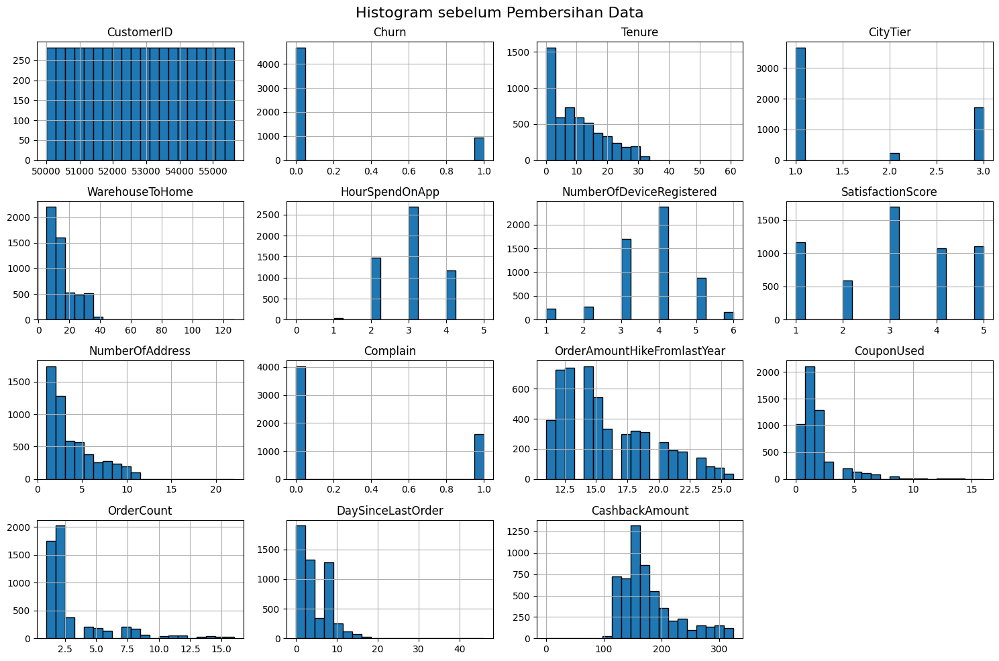

In [101]:
# Inisialisasi kolom numerik saja
numeric_columns = df.select_dtypes(include='number').columns

# Plot histograms dalam 1 figur
df[numeric_columns].hist(bins=20, figsize=(15, 10), layout=(4, 4), edgecolor='black')

plt.suptitle('Histogram sebelum Pembersihan Data', fontsize=16)

plt.tight_layout()
plt.show()

In [102]:
# Kolom numerik
numerical_columns = ['WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 
                     'NumberOfAddress', 'OrderAmountHikeFromlastYear', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']

# Kalkulasi skewness
skewness_values = df[numerical_columns].skew()

skewness_values

# Mendefinisikan kategori skewness
def classify_skewness(skew_value):
    if skew_value > 0:
        return 'Right-Skewed'
    elif skew_value < 0:
        return 'Left-Skewed'
    else:
        return 'Symmetric (Normal)'

# Membuat tabel
skewness_df = pd.DataFrame(skewness_values, columns=['Skewness'])
skewness_df['Kategori Skewness'] = skewness_df['Skewness'].apply(classify_skewness)

skewness_df

,Skewness,Kategori Skewness
WarehouseToHome,1.619154,Right-Skewed
HourSpendOnApp,-0.027213,Left-Skewed
NumberOfDeviceRegistered,-0.396969,Left-Skewed
SatisfactionScore,-0.142626,Left-Skewed
NumberOfAddress,1.088639,Right-Skewed
OrderAmountHikeFromlastYear,0.790785,Right-Skewed
OrderCount,2.196414,Right-Skewed
DaySinceLastOrder,1.191000,Right-Skewed
CashbackAmount,1.149846,Right-Skewed


<div style='text-align: justify'>

Pada visualisasi histogram sebelum pembersihan data, terlihat bahwa distribusi data pada sebagian besar kolom cenderung bersifat **tidak normal**, ditandai dengan distribusi yang skewed (condong ke salah satu sisi) dan beberapa kolom menunjukkan puncak yang tidak merata (multimodal).

</div>

# **Bagian III. Pembersihan Dataset**

<div style='text-align: justify'>

Untuk pembersihan data, kami memulai dengan membackup dataset asli agar tidak hilang ketika suatu saat diperlukan kembali.

</div>

In [103]:
# Backup dataset
df_bak = df.copy()

## `Duplikat Data`

In [104]:
print(f'Banyak duplikat data: {df.duplicated().sum()}')

Banyak duplikat data: 0


<div style='text-align: justify'>

Bisa dilihat bahwa banyaknya duplikat data adalah  0, maka tidak ada penghapusan untuk data yang terduplikat.

</div>

## `Hapus Kolom yang Tidak Relevan`

<div style='text-align: justify'>

Pada kolom `CustomerID` bersifat unik pada setiap baris untuk mengidentifikasi setiap customer, sehingga kolom bisa dihapus karena tidak relevan dengan masalah bisnis kami.

</div>

In [105]:
# Menghapus kolom CustomerID
df = df.drop(columns='CustomerID',axis=1)
df.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferredOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


## `Data Hilang`

In [106]:
df.isna().sum()

Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferredOrderCat                0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [107]:
# Pengecekan distribusi data hilang
missing = df.isna().sum()

# Heatmap
fig = go.Figure(data=go.Heatmap(
                z=[missing.values],
                x=missing.index,
                y=['Missing Values'],
                colorscale='reds'))

fig.update_layout(
    title='Distribution of Missing Values',
    xaxis_title='Columns',
    yaxis_title='',
    height=500,
    width=1000
)

fig.show()

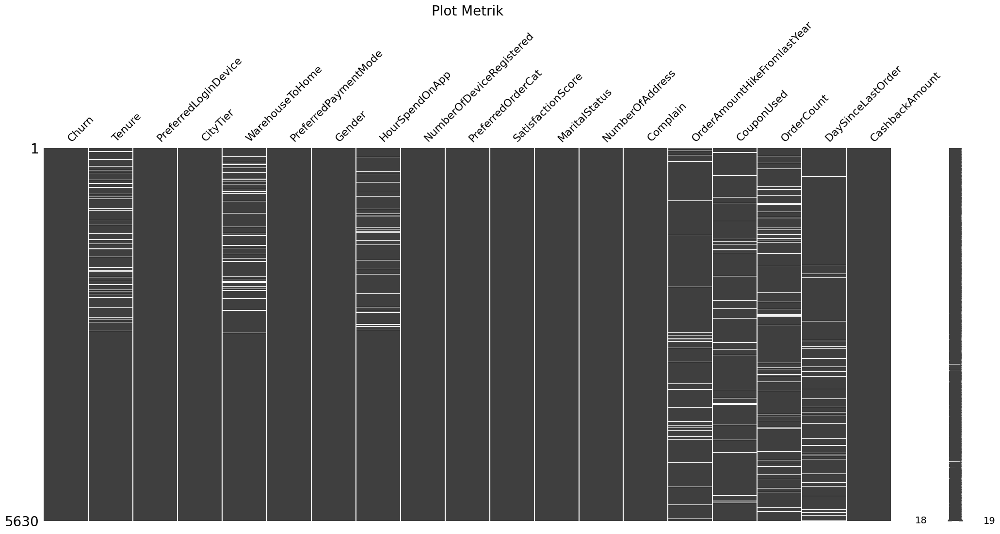

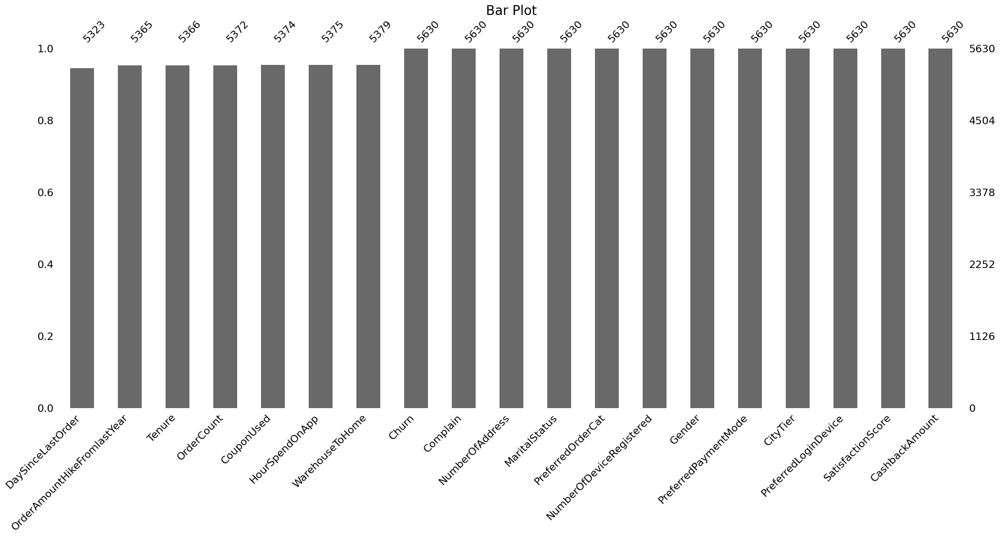

In [108]:
# Visualisasi metrik
msno.matrix(df)
plt.title('Plot Metrik',fontsize=20)
plt.show()

# Visualisasi bar
msno.bar(df,sort='ascending')
plt.title('Bar Plot',fontsize=20)
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, terdapat tujuh kolom data yang hilang yaitu `Tenure`, `WarehouseToHome`, `HourSpendOnApp`, `OrderAmountHikeFromlastYear`, `CouponUsed`, `OrderCount`, `DaySinceLastOrder`.

Untuk menangani data yang hilang, kami menggunakan **median**. Alasan kami menggunakan median:
1. **Mengatasi Outliers**: Median lebih stabil terhadap nilai ekstrem (outliers), menjaga keakuratan pusat distribusi data.
   
2. **Distribusi Skewed**: Median lebih cocok untuk data yang condong (skewed), karena lebih akurat dalam merepresentasikan nilai tengah dibandingkan mean.

3. **Robust dan Reliable**: Median tetap representatif dalam dataset dengan variabilitas tinggi, lebih tahan terhadap outliers.

4. **Nilai Tidak Diketahui**: Median sering dipilih ketika informasi distribusi variabel terbatas, memberikan hasil yang netral dan konservatif.

</div>


In [109]:
# Kolom untuk diisi median
columns_to_fill = [
    'Tenure', 'WarehouseToHome', 'HourSpendOnApp',
    'OrderAmountHikeFromlastYear', 'CouponUsed',
    'OrderCount', 'DaySinceLastOrder'
]

# Isi data hilang dengan median setiap kolom
for column in columns_to_fill:
    df[column].fillna(df[column].median(), inplace=True)

In [110]:
df.isna().sum()

Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferredOrderCat              0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

## `Anomali Data (Inkonsistensi Kategori)`

### Kolom `PreferredLoginDevice`

In [111]:
# Banyaknya setiap kategori
df['PreferredLoginDevice'].value_counts()

PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64

<div style='text-align: justify'>

Pada kolom `PreferredLoginDevice` terdapat inkonsistensi kategori yaitu mempunyai kesamaan kategori antara Mobile Phone dengan Phone, di mana mempunyai arti yang sama. Sehingga kami akan menggabungkan kedua kategori menjadi satu kesatuan.

</div>


In [112]:
# Standardisasi data
df['PreferredLoginDevice'] = df['PreferredLoginDevice'].replace('Phone', 'Mobile Phone')

df['PreferredLoginDevice'].value_counts()

PreferredLoginDevice
Mobile Phone    3996
Computer        1634
Name: count, dtype: int64

### Kolom `PreferredPaymentMode`

In [113]:
# Banyaknya setiap kategori
df['PreferredPaymentMode'].value_counts()

PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64

<div style='text-align: justify'>

Pada kolom `PreferredPaymentMode` terdapat inkonsistensi kategori yaitu mempunyai kesamaan kategori antara CC dengan Credit Card dan COD dengan Cash on Delivery, di mana mempunyai arti yang sama. Sehingga kami akan menggabungkan kedua kategori menjadi satu kesatuan.

</div>

In [114]:
# Standardisasi data
df['PreferredPaymentMode'] = df['PreferredPaymentMode'].replace({'CC': 'Credit Card',
                                                                 'COD': 'Cash on Delivery'})

df['PreferredPaymentMode'].value_counts()

PreferredPaymentMode
Debit Card          2314
Credit Card         1774
E wallet             614
Cash on Delivery     514
UPI                  414
Name: count, dtype: int64

### Kolom `PreferredOrderCat`

In [115]:
# Banyaknya setiap kategori
df['PreferredOrderCat'].value_counts()

PreferredOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: count, dtype: int64

<div style='text-align: justify'>

Pada kolom `PreferredOrderCat` terdapat inkonsistensi kategori yaitu mempunyai kesamaan kategori antara Mobile dengan Mobile Phone, di mana mempunyai arti yang sama. Sehingga kami akan menggabungkan kedua kategori menjadi satu kesatuan.

</div>

In [116]:
# Standardisasi data
df['PreferredOrderCat'] = df['PreferredOrderCat'].replace({'Mobile': 'Mobile Phone'})

df['PreferredOrderCat'].value_counts()

PreferredOrderCat
Mobile Phone          2080
Laptop & Accessory    2050
Fashion                826
Grocery                410
Others                 264
Name: count, dtype: int64

## `Outliers Data`

<div style='text-align: center'>
    <img src='https://miro.medium.com/v2/resize:fit:700/0*XG2sFucPoFMg6NeV.png' alt='Boxplot Image' style='width:800px; height:300px; border-radius: 10px;'>
</div>



In [117]:
# Pilih kolom numerik
numeric_columns = [
    'Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered',
    'NumberOfAddress', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
    'DaySinceLastOrder', 'CashbackAmount'
]

n_cols = 2
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

# Buat subplots dengan subplot_titles
fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=numeric_columns,
    shared_yaxes=False,
    horizontal_spacing=0.1,
    vertical_spacing=0.1
)

# Tambah boxplot tanpa 'boxmean'
for idx, column in enumerate(numeric_columns):
    row = (idx // n_cols) + 1
    col = (idx % n_cols) + 1
    fig.add_trace(
        go.Box(
            x=df[column],
            name='',
            boxmean=False,  # Nonaktifkan boxmean untuk menghilangkan teks tambahan
            orientation='h'
        ),
        row=row,
        col=col
    )

    # Hilangkan label pada sumbu y
    fig.update_yaxes(showticklabels=False, row=row, col=col)

    if col > 1:
        fig.update_xaxes(showticklabels=False, row=row, col=col)

fig.update_layout(
    height=300 * n_rows,
    width=1200,
    showlegend=False,
    title_text='Deteksi Outliers Data',
    margin=dict(l=50, r=50, t=80, b=50),
    paper_bgcolor="White",
)

for annotation in fig['layout']['annotations']:
    annotation['font'] = dict(size=12)

fig.show()


<div style='text-align: justify'>

Berdasarkan hasil visualisasi outliers di atas menggunakan boxplot, kami dapat memberikan gambaran bahwa adanya outlier yang bervariasi pada masing-masing kolom (banyak atau sedikitnya outlier dan rentang jauh pendeknya outlier).  
Setelah memahami karakteristik dari bisnis Flipkart dan dataset yang diperoleh, kami memutuskan untuk tidak menghapus outlier yang terdapat di dalam data.  
Berikut alasan kami tidak menghapus outliers pada setiap kolom:  
* `Tenure`: Terdapat outliers data dari 50 bulan sampai paling tinggi 61 bulan. Flipkart membuat website publik tahun 2008 dan aplikasi mobile tahun 2013. Pelanggan yang mempunyai keanggotan selama 50 bulan (4 tahun) sampai 61 bulan (5 tahun) masih dapat diterima.  
* `WarehouseToHome`: Terdapat outliers data dari 126 km sampai 127 km. Flipkart yang mengirim ke seluruh kota India, tentu dapat menerima pelanggan yang jauh dari gudang Flipkart itu sendiri.
* `HourSpendOnApp`: Terdapat outliers rentang 0 jam sampai 5 jam. Ini bervariasi tergantung pelanggannya apakah mereka sibuk atau tidak pada hari mereka memakai waktunya untuk menggunakan aplikasi. Tetapi rentang itu masih dapat diterima.
* `NumberOfDeviceRegistered`: Terdapat ouliers dari 1 sampai paling banyak 6 perangkat. Ini tentu tergantung dari pelanggan yang bervariasi mempunyai perangkat elektronik. Tetapi outliers tersebut masih dapat diterima.
* `NumberOfAddress`: Terdapat outliers dari 19 sampai 22 alamat ada dalam 1 akun pelanggan. Ini sangat mungkin terjadi apabila pelanggan tersebut merangkap menjadi reseller pada sebuah bisnis yang diterapkan. Lalu, alasan selanjutnya pelanggan tersebut memang berpindah-pindah dari suatu tempat ke tempat lain, tidak menetap di satu tempat saja.
* `OrderAmountHikeFromlastYear`: Terdapat outlier sebesar 26 %. Hal ini masih dapat diterima dimana pengertian dari kolom tersebut yaitu kenaikan persentase orderan dari tahun lalu. Kenaikan sebesar 26 % sangat mungkin terjadi dan dapat diterima.
* `CouponUsed`: Terdapat outliers dari rentang 4 sampai 16 kupon yang dipakai. Hal ini masih bisa diterima karena masih dalam batas wajar dilihat dari jumlah orderan dan durasi pelanggan tersebut mendaftar.
* `OrderCount`: Terdapat outliers dari rentang 7 sampai 16 orderan. Jumlah tersebut masih dapat diterima mengingat Flipkart merupakan bisnis jual beli e-commerce yang menjual keperluan pelanggan.
* `DaySinceLastOrder`: Terdapat outliers dari 15 hari sampai paling tinggi 46 hari. Hal ini merupakan kejadian yang sering terjadi karena pelanggan tersebut tidak melakukan transaksi dalam jangka waktu tertentu.
* `CashbackAmount`: Terdapat outliers dari 0 rupee sampai terbesar 325 rupee. Hal ini masih dapat diterima karena jumlah cashback tergantung dengan nominal dan kategori barang yang dibeli pelanggan.

</div>

## `Distribusi Data setelah Pembersihan Data`

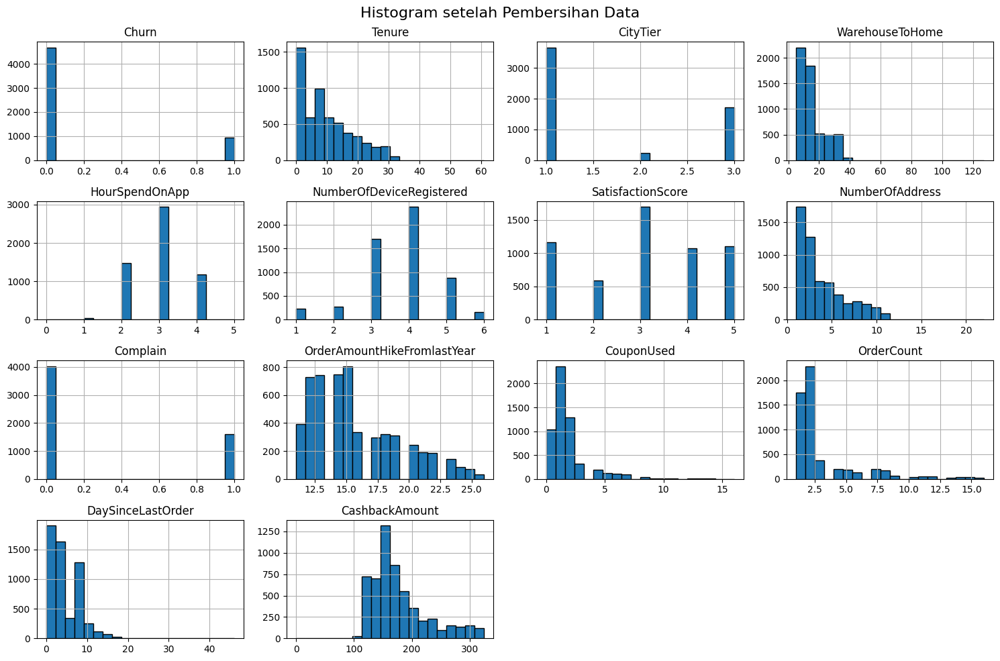

In [118]:
# Kolom numerik saja
numeric_columns = df.select_dtypes(include='number').columns

# Plot histograms dalam 1 figur
df[numeric_columns].hist(bins=20, figsize=(15, 10), layout=(4, 4), edgecolor='black')

plt.suptitle('Histogram setelah Pembersihan Data', fontsize=16)

plt.tight_layout()
plt.show()

In [119]:
# Kolom numerik
numerical_columns = ['WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 
                     'NumberOfAddress', 'OrderAmountHikeFromlastYear', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']

# Kalkulasi skewness
skewness_values = df[numerical_columns].skew()

skewness_values

# Definisi kategori skewness
def classify_skewness(skew_value):
    if skew_value > 0:
        return 'Right-Skewed'
    elif skew_value < 0:
        return 'Left-Skewed'
    else:
        return 'Symmetric (Normal)'

# Buat tabel
skewness_df = pd.DataFrame(skewness_values, columns=['Skewness'])
skewness_df['Kategori Skewness'] = skewness_df['Skewness'].apply(classify_skewness)

skewness_df

,Skewness,Kategori Skewness
WarehouseToHome,1.678346,Right-Skewed
HourSpendOnApp,-0.040982,Left-Skewed
NumberOfDeviceRegistered,-0.396969,Left-Skewed
SatisfactionScore,-0.142626,Left-Skewed
NumberOfAddress,1.088639,Right-Skewed
OrderAmountHikeFromlastYear,0.835439,Right-Skewed
OrderCount,2.276640,Right-Skewed
DaySinceLastOrder,1.273530,Right-Skewed
CashbackAmount,1.149846,Right-Skewed


<div style='text-align: justify'>

Pada visualisasi histogram setelah pembersihan data, terlihat bahwa distribusi data pada sebagian besar kolom cenderung masih bersifat **tidak normal**, ditandai dengan distribusi yang skewed (condong ke salah satu sisi) dan beberapa kolom menunjukkan puncak yang tidak merata (multimodal).

</div>

## `Heatmap`

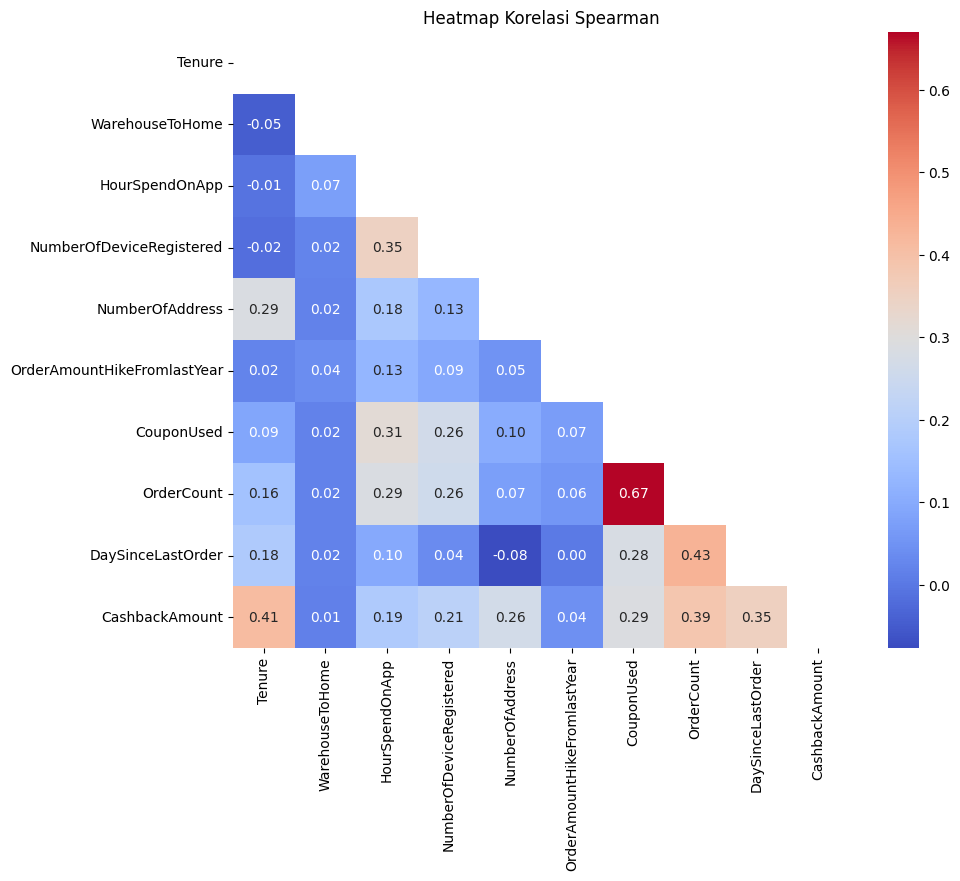

In [120]:
# Fitur Numerik
num_col = [
    'Tenure',
    'WarehouseToHome',
    'HourSpendOnApp',
    'NumberOfDeviceRegistered',
    'NumberOfAddress',
    'OrderAmountHikeFromlastYear',
    'CouponUsed',
    'OrderCount',
    'DaySinceLastOrder',
    'CashbackAmount'
]

# Fitur yang akan dimasukkan ke dalam heatmap
selected_features = num_col

# Hitung korelasi Spearman
corr = df[selected_features].corr(method='spearman')

# Buat mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Buat heatmap dengan mask
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Heatmap Korelasi Spearman')
plt.show()

<div style='text-align: justify'>

Berdasarkan heatmap korelasi metrik di atas, kami memberi insight sebagai berikut:


1. `Tenure` dan `Cashback Amount`:

Korelasi positif yang cukup kuat antara `Tenure` dan `CashbackAmount` sebesar +0.41. Ini menunjukkan bahwa pelanggan yang sudah lama menggunakan platform cenderung menerima cashback lebih besar. Ini bisa diartikan bahwa pelanggan loyal mungkin mendapatkan lebih banyak manfaat atau promosi, atau lebih sering melakukan pembelian yang memicu cashback.

2. `Coupon Used` dan `Order Count`:

Ada korelasi positif yang signifikan antara `CouponUsed` dan `OrderCount` sebesar +0.67. Ini menunjukkan bahwa pemberian kupon cenderung meningkatkan frekuensi pembelian pelanggan. Dengan memberikan lebih banyak kupon atau promosi, platform dapat mendorong pelanggan untuk lebih aktif melakukan pembelian.

3. `CashbackAmount` dan `OrderCount`:

Terdapat korelasi positif antara `CashbackAmount` dan `OrderCount` sebesar +0.39. Ini menunjukkan bahwa semakin tinggi jumlah pesanan, semakin besar cashback yang diterima. Cashback mungkin digunakan sebagai insentif untuk mendorong pembelian yang lebih sering atau lebih besar.

4. `OrderCount` dan `DaySinceLastOrder`:

Ada korelasi positif antara `OrderCount` dan `DaySinceLastOrder` sebesar +0.43. Ini menunjukkan pola perilaku pelanggan tetap atau pelanggan yang melakukan pembelian terjadwal dengan interval tertentu. Hal ini dapat digunakan untuk menentukan kapan memberikan penawaran untuk mendorong pembelian berikutnya.

5. `DaySinceLastOrder` dan `CashbackAmount`

Ada korelasi positif antara `DaySinceLastOrder` dan `CashbackAmount` sebesar +0.35. Ini menunjukkan bahwa pelanggan yang lebih lama sejak melakukan pembelian terakhir cenderung menerima jumlah cashback yang lebih tinggi.

</div>

## `Uji Multikolinearitas`

<div style='text-align: justify'>

Uji multikolinearitas di mana multikolinearitas terjadi ketika dua atau lebih variabel independen saling berkorelasi tinggi.

</div>

In [121]:
# Kolom numerik
numeric_data = df.select_dtypes(include=['float64', 'int64']).drop(columns=['Churn'], errors='ignore')

# VIF
vif_data = pd.DataFrame()
vif_data['Fitur'] = numeric_data.columns

# Hitung VIF
vif_data['VIF'] = [variance_inflation_factor(numeric_data.values, i) for i in range(len(numeric_data.columns))]

# Status multikolinearitas
def multicollinearity_status(vif):
    if vif < 5:
        return 'Rendah'
    elif 5 <= vif < 10:
        return 'Sedang'
    else:
        return 'Tinggi'

vif_data['Status'] = vif_data['VIF'].apply(multicollinearity_status)

vif_data

,Fitur,VIF,Status
0,Tenure,3.359844,Rendah
1,CityTier,4.110878,Rendah
2,WarehouseToHome,4.359541,Rendah
3,HourSpendOnApp,19.171637,Tinggi
4,NumberOfDeviceRegistered,14.849479,Tinggi
5,SatisfactionScore,5.472923,Sedang
6,NumberOfAddress,4.100150,Rendah
7,Complain,1.395283,Rendah
8,OrderAmountHikeFromlastYear,14.840284,Tinggi
9,CouponUsed,3.243919,Rendah


<div style='text-align: justify'>

Dilihat bahwa pada kolom `HourSpendOnApp`, `NumberOfDeviceRegistered`, `OrderAmountHikeFromlastYear`, dan `CashbackAmount` terdapat kolinearitas yang tinggi. Informasi ini dapat menjadi acuan untuk pemilihan fitur dalam model prediksi machine learning.  
Namun, karena kami menggunakan metode klasifikasi berbasis boosting, seperti contoh XGBoost atau LightGBM, yang secara otomatis dapat menangani multikolinearitas melalui proses pemilihan fitur pada setiap split, penggunaan VIF (Variance Inflation Factor) tidak terlalu diperlukan. Meskipun demikian, pengurangan fitur yang sangat berkorelasi tetap dapat mempertimbangkan efisiensi model dan interpretabilitas.

</div>

## `Perubahan Tipe Data`

<div style='text-align: justify'>

Seperti yang sudah dijelaskan di atas, bahwa kolom `CouponUsed` dan `OrderCount` bersifat nilai diskrit, oleh karena itu perlu diubah ke integer. Lalu kolom `Complain`, `CityTier`, dan `SatisfactionScore` diubah ke object karena tidak bersifat kategorikal.

</div>

In [122]:
# Mengubah 'CouponUsed' dan 'OrderCount' ke integer
df['CouponUsed'] = df['CouponUsed'].astype('int64')
df['OrderCount'] = df['OrderCount'].astype('int64')
df['Complain'] = df['Complain'].astype('object')
df['SatisfactionScore'] = df['SatisfactionScore'].astype('object')
df['CityTier'] = df['CityTier'].astype('object')

# Mengecek tipe data
df.dtypes[['CouponUsed', 'OrderCount', 'Complain', 'SatisfactionScore', 'CityTier']]

CouponUsed            int64
OrderCount            int64
Complain             object
SatisfactionScore    object
CityTier             object
dtype: object

## `Ekspor Data Bersih`

In [123]:
# Ekspor data bersih ke excel
df.to_excel('e-commerce_cleaned.xlsx',index=False)

# **Bagian IV. Pemaparan Analisis Data**

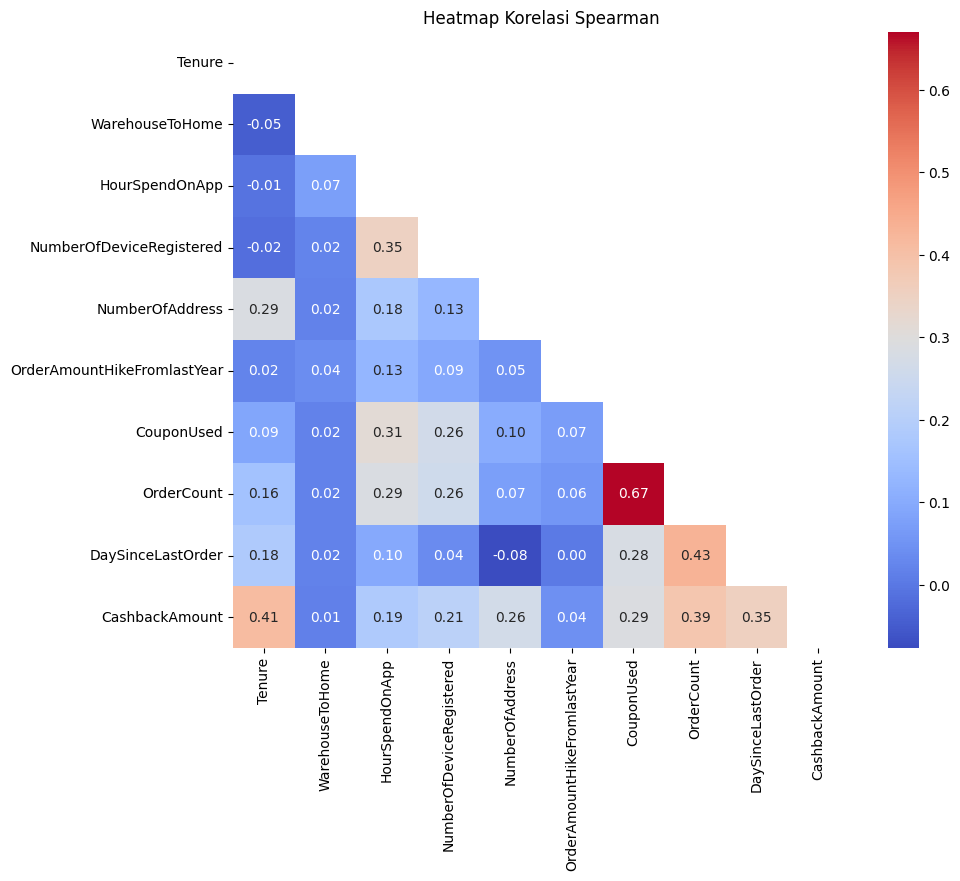

In [124]:
# Fitur Numerik
num_col = [
    'Tenure',
    'WarehouseToHome',
    'HourSpendOnApp',
    'NumberOfDeviceRegistered',
    'NumberOfAddress',
    'OrderAmountHikeFromlastYear',
    'CouponUsed',
    'OrderCount',
    'DaySinceLastOrder',
    'CashbackAmount'
]

# Fitur yang akan dimasukkan ke dalam heatmap
selected_features = num_col

# Hitung korelasi Spearman
corr = df[selected_features].corr(method='spearman')

# Buat mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Buat heatmap dengan mask
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Heatmap Korelasi Spearman')
plt.show()

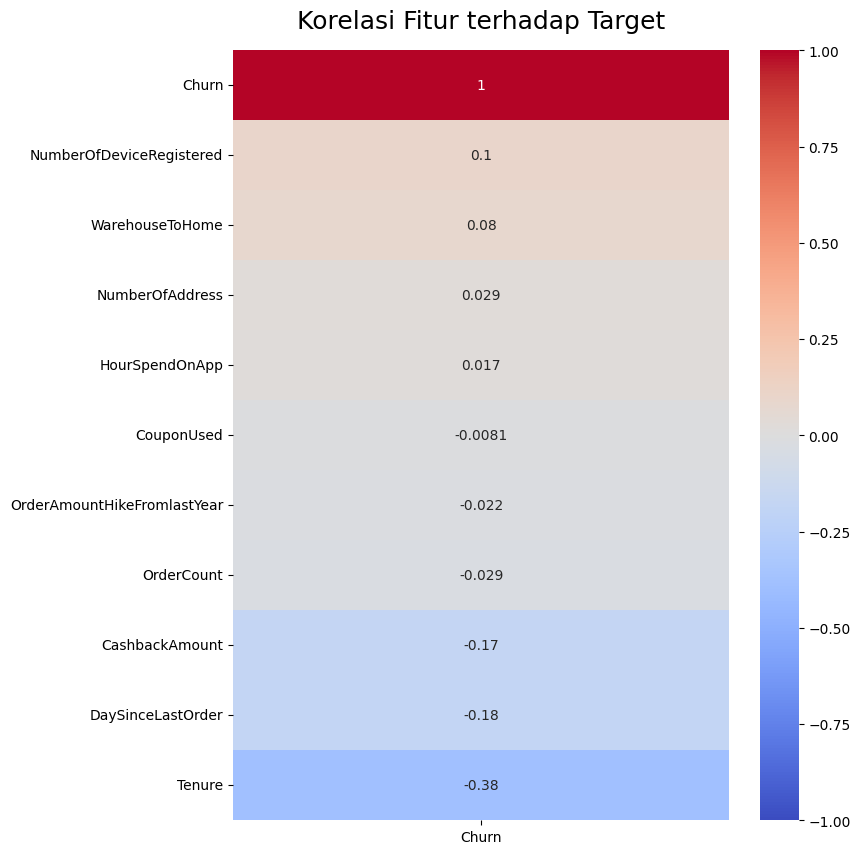

In [125]:
# Korelasi numerikal heatmap
df_heatmap_corr = df.corr(numeric_only=True, method='spearman')[['Churn']]

# Heatmap numerik
plt.figure(figsize=(8, 10))
heatmap = sns.heatmap(
    df_heatmap_corr.sort_values(by='Churn', ascending=False),
    vmin=-1, vmax=1, annot=True, cmap='coolwarm'
)
heatmap.set_title('Korelasi Fitur terhadap Target', fontdict={'fontsize':18}, pad=16)
plt.show()


<div style='text-align: justify'>

Berdasarkan heatmap korelasi antara fitur-fitur dengan target (dalam hal ini adalah **`Churn`**), berikut adalah beberapa insight yang dapat diperoleh:

1. **Fitur yang Positif terhadap Churn:**
   - **`NumberOfDeviceRegistered`** (0.1): Memiliki korelasi positif lemah terhadap churn, artinya semakin banyak perangkat yang terdaftar, kemungkinan untuk churn sedikit meningkat.
   - **`WarehouseToHome`** (0.08): Jarak atau waktu dari gudang ke rumah pelanggan juga menunjukkan korelasi positif lemah, namun kontribusinya terhadap churn sangat kecil.
   - **`NumberOfAddress`** (0.029): Jumlah alamat yang disimpan oleh pengguna menunjukkan korelasi positif yang sangat lemah.
   - **`HourSpendOnApp`** (0.017): Waktu yang dihabiskan pada aplikasi hampir tidak memiliki korelasi dengan churn, menunjukkan bahwa waktu penggunaan aplikasi bukan faktor signifikan dalam prediksi churn.
   
   Dari fitur-fitur ini, meskipun ada korelasi positif, nilai korelasinya sangat rendah sehingga dampaknya terhadap churn mungkin tidak terlalu signifikan.

2. **Fitur yang Negatif terhadap Churn:**
   - **`Tenure`** (-0.38): Memiliki korelasi negatif yang cukup kuat dengan churn, artinya semakin lama seorang pelanggan bergabung, semakin kecil kemungkinan mereka untuk churn. Ini adalah fitur dengan korelasi terbesar terhadap churn dan dapat menjadi faktor penting dalam prediksi churn.
   - **`DaySinceLastOrder`** (-0.18): Memiliki korelasi negatif moderat, yang menunjukkan bahwa semakin lama waktu sejak pesanan terakhir, kemungkinan churn lebih rendah, meskipun tidak sekuat fitur "Tenure."
   - **`CashbackAmount`** (-0.17): Korelasi negatif menunjukkan bahwa semakin besar cashback yang diterima, semakin rendah kemungkinan churn. Memberikan cashback mungkin bisa menjadi strategi retensi yang efektif.
   - **`OrderCount`** (-0.029): Korelasi negatif yang sangat lemah dengan churn, menunjukkan bahwa frekuensi pemesanan tidak memiliki pengaruh besar terhadap churn.
   - **`OrderAmountHikeFromlastYear`** (-0.022): Perubahan jumlah pemesanan dari tahun lalu hampir tidak berpengaruh terhadap churn.
   - **`CouponUsed`** (-0.0081): Penggunaan kupon juga memiliki korelasi negatif yang sangat lemah, menunjukkan bahwa faktor ini bukan indikator yang signifikan untuk churn.

3. **Insight Utama:**
   - **`Tenure`** adalah fitur yang paling signifikan dalam menentukan kemungkinan churn, dengan korelasi negatif yang relatif kuat. Ini menunjukkan bahwa pelanggan yang memiliki masa aktif lebih lama cenderung tidak churn.
   - **`Strategi Retensi`**: Cashback dan frekuensi pemesanan dapat menjadi strategi yang efektif untuk retensi karena meskipun korelasinya lemah, fitur-fitur ini menunjukkan hubungan negatif dengan churn.
   - **`Fitur-Fitur Lain`**: Fitur-fitur lain seperti jumlah perangkat yang terdaftar, jarak ke gudang, dan jumlah alamat yang tersimpan menunjukkan hubungan yang sangat lemah, sehingga mungkin tidak terlalu berpengaruh dalam model prediksi churn.

Secara keseluruhan, fokus utama untuk mengurangi churn sebaiknya diarahkan pada pelanggan dengan masa aktif yang pendek, dan memberikan insentif seperti cashback atau meningkatkan frekuensi interaksi (order) bisa menjadi upaya tambahan untuk menjaga retensi pelanggan.

</div>

## `Pelanggan Berdasarkan Demografis dan Geografis`

<div style='text-align: justify'>

Segmentasi pelanggan berdasarkan demografis adalah kolom `Gender`, `MaritalStatus`, `NumberOfAddress`. Untuk berdasarkan geografis adalah kolom `CityTier`, `WarehouseToHome`.

</div>

### Hubungan `Churn` dengan `Gender`

In [126]:
pd.DataFrame(df.groupby('Gender')['Churn'].value_counts())

count
Gender Churn       
Female 0       1898
       1        348
Male   0       2784
       1        600

<Figure size 1000x600 with 0 Axes>

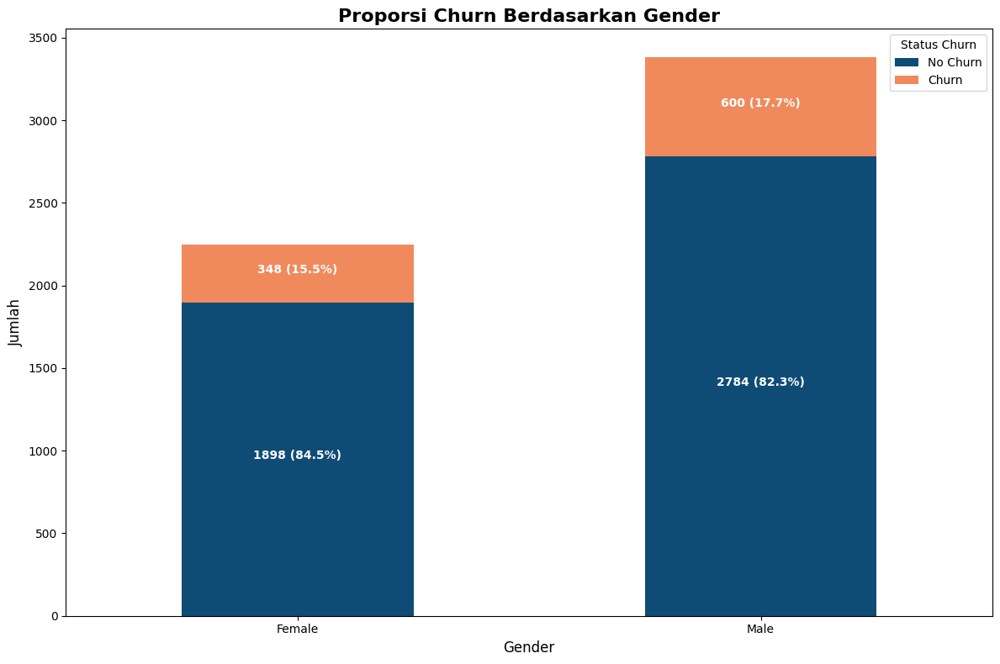

In [127]:
# Mengelompokkan data berdasarkan Gender dan Status Churn
gender_churn_counts = df.groupby(['Gender', 'Churn']).size().unstack(fill_value=0)
gender_churn_counts.columns = ['No Churn', 'Churn']

# Menghitung persentase
gender_churn_counts['Total'] = gender_churn_counts['No Churn'] + gender_churn_counts['Churn']
gender_churn_counts['No Churn %'] = (gender_churn_counts['No Churn'] / gender_churn_counts['Total']) * 100
gender_churn_counts['Churn %'] = (gender_churn_counts['Churn'] / gender_churn_counts['Total']) * 100

# Menyiapkan figure
plt.figure(figsize=(10, 6))

# Membuat stacked bar plot tanpa border di bar
gender_churn_counts[['No Churn', 'Churn']].plot(kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(12, 8))

# Menambahkan title dan label
plt.title("Proporsi Churn Berdasarkan Gender", fontsize=16, fontweight='bold')
plt.xlabel("Gender", fontsize=12)
plt.ylabel("Jumlah", fontsize=12)
plt.legend(title='Status Churn')

# Menambahkan anotasi pada setiap segmen bar
for index, (no_churn, churn, no_churn_pct, churn_pct) in enumerate(zip(
    gender_churn_counts['No Churn'], 
    gender_churn_counts['Churn'], 
    gender_churn_counts['No Churn %'], 
    gender_churn_counts['Churn %']
)):
    plt.text(index, no_churn / 2, f"{int(no_churn)} ({no_churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold')
    plt.text(index, no_churn + churn / 2, f"{int(churn)} ({churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold')

# Mengatur tampilan sumbu x dan tata letak
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [128]:
churn_counts = df[df['Churn'] == 1]['Gender'].value_counts()

male_churn_count = churn_counts.get('Male', 0)
female_churn_count = churn_counts.get('Female', 0)

total_male = df[df['Gender'] == 'Male'].shape[0]
total_female = df[df['Gender'] == 'Female'].shape[0]

count = [male_churn_count, female_churn_count]
nobs = [total_male, total_female]

# Two proportions
z_stat, p_value = proportions_ztest(count, nobs)

# Print hipotesis
print('Hipotesis:')
print("H0: Proporsi churn sama antara gender male dan female.")
print("Ha: Proporsi churn berbeda antara gender male dan female.\n")

if p_value < 0.05:
    decision = "Tolak H0"
    hypothesis_result = "Terdapat perbedaan proporsi churn antara gender male dan female."
else:
    decision = "Gagal tolak H0"
    hypothesis_result = "Tidak terdapat bukti cukup untuk menyatakan perbedaan proporsi churn antara gender male dan female."

print(f"pvalue: {p_value:.4f}\n\n{decision}\n{hypothesis_result}\n")

Hipotesis:
H0: Proporsi churn sama antara gender male dan female.
Ha: Proporsi churn berbeda antara gender male dan female.

pvalue: 0.0281

Tolak H0
Terdapat perbedaan proporsi churn antara gender male dan female.



<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami mendapat insight bahwa **proporsi wanita lebih rendah tingkat churnnya sebanyak 16% dibanding dengan pria sebesar 18%**.

Kami melakukan **uji statistika menggunakan Z-test** untuk mengetahui apakah proporsi churn gender male apakah ada perbedaan proporsi atau sama saja dengan proporsi gender female, mengingat perbedaan angkanya tidak signifikan. **Setelah diuji, ternyata memiliki hipotesis bahwa terdapat perbedaan proporsi churn antara gender male dan female**.

Secara umum, hal ini disebabkan karena **pria lebih fleksibel dalam menentukan pilihan produknya dan bebas menentukan dimana saja dia dapat memilih di platform manapun**, seperti harga yang lebih murah dan banyak promo, mereka cenderung untuk lebih pindah ke kompetitor lain.

Berbeda dengan **perempuan yang cenderung memiliki emosional dan pemilih dalam menentukan sebuah produk**. Mereka yang sudah terlanjur suka akan produk atau perusahaan tersebut, tidak mudah untuk pindah ke kompetitor lain.

</div>

### Hubungan `Churn` dengan `MaritalStatus`

In [129]:
pd.DataFrame(df.groupby('MaritalStatus')['Churn'].value_counts())

count
MaritalStatus Churn       
Divorced      0        724
              1        124
Married       0       2642
              1        344
Single        0       1316
              1        480

<Figure size 1200x800 with 0 Axes>

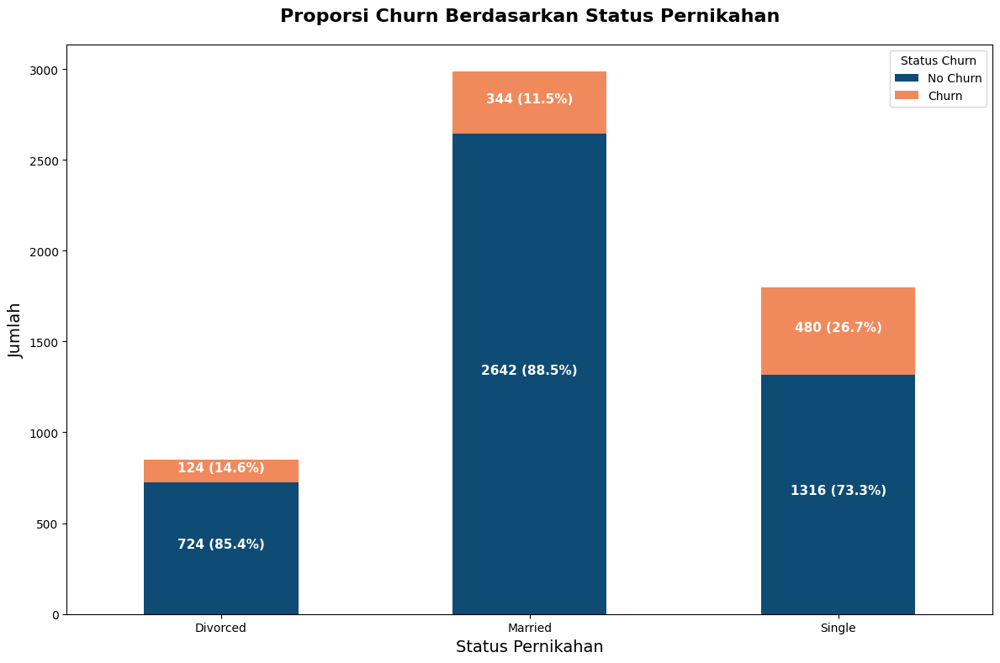

In [130]:
# Group 'MaritalStatus' dan 'Churn'
marital_churn_counts = pd.DataFrame(df.groupby('MaritalStatus')['Churn'].value_counts())
marital_churn_pivot = marital_churn_counts.unstack(level=1).fillna(0)
marital_churn_pivot.columns = ['Not Churned', 'Churned']

# Kalkulasi total dan persentase
marital_churn_pivot['Total'] = marital_churn_pivot['Not Churned'] + marital_churn_pivot['Churned']
marital_churn_pivot['Not Churned %'] = (marital_churn_pivot['Not Churned'] / marital_churn_pivot['Total']) * 100
marital_churn_pivot['Churned %'] = (marital_churn_pivot['Churned'] / marital_churn_pivot['Total']) * 100

# Plot stack bar
plt.figure(figsize=(12, 8))
bar_plot = marital_churn_pivot[['Not Churned', 'Churned']].plot(
    kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(12, 8)
)

plt.title("Proporsi Churn Berdasarkan Status Pernikahan", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Status Pernikahan", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)

# Tambah anotasi
for index, (not_churned, churned, not_churned_pct, churned_pct) in enumerate(zip(
    marital_churn_pivot['Not Churned'], 
    marital_churn_pivot['Churned'], 
    marital_churn_pivot['Not Churned %'], 
    marital_churn_pivot['Churned %']
)):

    plt.text(index, not_churned / 2, f"{int(not_churned)} ({not_churned_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)

    plt.text(index, not_churned + churned / 2, f"{int(churned)} ({churned_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)

# Menyesuaikan legenda
plt.xticks(rotation=0)
plt.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")
plt.tight_layout()
plt.show()


<div style='text-align: justify'>

Dari hasil visualiasi di atas, **kami dapat memberikan insight bahwa tingkat churn tertinggi ada di pelanggan yang berstatus single sebesar 27%**. Hal ini bisa disebabkan karena pelanggan yang single tidak mempunyai tanggungan dan kebutuhan secara konsisten yang harus loyal kepada perusahaan terkait. Lalu pada pelanggan single, didalamnya juga terdapat anak yang masih berusia muda yang masih mempunyai hasrat untuk membeli keperluan hobinya yang masih tergantung pada promo atau harga yang murah.

Untuk **kategori divorced/cerai tingkat churn relatif rendah di angka 15%**. Hal ini disebabkan karena pelanggan yang bercerai mungkin berada dalam posisi menata ulang kebutuhan mereka setelah perubahan dalam status rumah tangga. Hal ini mungkin membuat mereka lebih terbuka untuk mencoba platform baru atau penawaran yang lebih kompetitif, meskipun tidak sefleksibel pelanggan lajang.

Berbeda halnya dengan kategori yang sudah **married/menikah yang mempunyai tingkat churn paling rendah yaitu 12%**. Pelanggan yang menikah lebih mempertimbangkan kebutuhan keluarga dan rumah tangga dalam berbelanja, yang menyebabkan mereka lebih loyal terhadap satu platform yang memberikan layanan stabil dan produk berkualitas. Pelanggan yang menikah mungkin lebih menghargai kenyamanan dan konsistensi dalam belanja daripada mencari penawaran terbaik di berbagai platform, sehingga mengurangi kemungkinan churn.

</div>

### Hubungan `Churn` dengan `NumberOfAddress`

In [131]:
pd.DataFrame(df.groupby('NumberOfAddress')['Churn'].value_counts())

count
NumberOfAddress Churn       
1               0        326
                1         45
2               0       1128
                1        241
3               0       1050
                1        228
4               0        523
                1         65
5               0        504
                1         67
6               0        316
                1         66
7               0        192
                1         64
8               0        214
                1         66
9               0        193
                1         46
10              0        159
                1         35
11              0         75
                1         23
19              1          1
20              1          1
21              0          1
22              0          1

In [132]:
# Data
churn_address = df.groupby(['Churn', 'NumberOfAddress']).size().unstack(fill_value=0)
churn_address_prop = churn_address.div(churn_address.sum(axis=0), axis=1) * 100

# Menyiapkan data dan mengganti nilai 0 dan 1 dengan 'No Churn' dan 'Churn'
churn_address_prop_reset = churn_address_prop.T.reset_index().melt(id_vars='NumberOfAddress', 
                                                                    var_name='Churn', 
                                                                    value_name='Percentage')
churn_address_prop_reset['Churn'] = churn_address_prop_reset['Churn'].map({0: 'No Churn', 1: 'Churn'})

# Membuat stacked bar plot
fig = px.bar(churn_address_prop_reset, 
             x='NumberOfAddress', 
             y='Percentage', 
             color='Churn', 
             color_discrete_map={'No Churn': '#0F4C75', 'Churn': '#F08A5D'},
             labels={'Churn': 'Status Churn'},
             title="Proporsi Churn berdasarkan Jumlah Alamat")

# Mengatur layout
fig.update_layout(
    xaxis_title="Number of Address",
    yaxis_title="Proporsi (%)",
    legend_title="Status Churn",
    font=dict(size=12),
    title_font=dict(size=18),
    barmode='stack'
)

fig.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa tingkat churn pelanggan untuk **range 1 sampai 11 alamat per 1 pelanggan mengalami tingkat fluktuasi bervariasi dari 11% hingga 25%**. Kemudian pada **range 19 dan 20 alamat mengalami tingkat churn sampai 100%**, dan pelanggan yang mempunyai **21 dan 22 alamat tidak mengalami churn sama sekali**. 

Hal tersebut butuh analisis lebih lanjut mengenai hubungan antara jumlah alamat dengan preferensi device misalnya, untuk mengetahui mengapa churn itu terjadi. Karena dengan hanya berdasarkan jumlah alamat dengan tingkat churn, kami tidak bisa mendapat insight mendalam faktor penyebab didalamnya.

</div>

### Hubungan `Churn` dengan `CityTier`

In [133]:
pd.DataFrame(df.groupby('CityTier')['Churn'].value_counts())

count
CityTier Churn       
1        0       3134
         1        532
2        0        194
         1         48
3        0       1354
         1        368

<Figure size 1200x800 with 0 Axes>

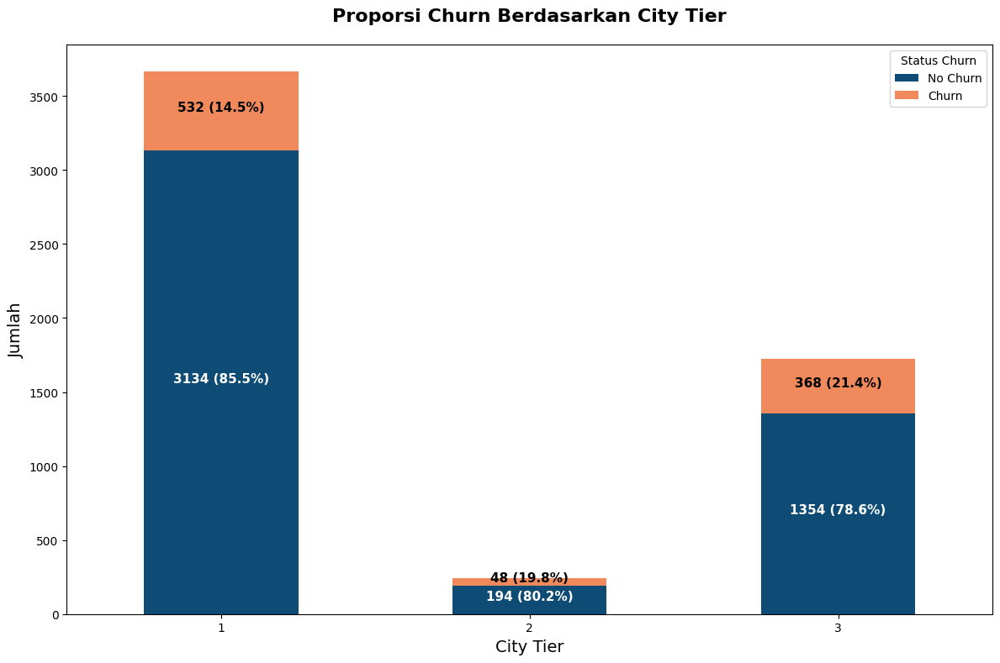

In [134]:
# Group by 'CityTier' dan 'Churn'
city_tier_churn_counts = pd.DataFrame(df.groupby('CityTier')['Churn'].value_counts())

city_tier_churn_pivot = city_tier_churn_counts.unstack(level=1).fillna(0)
city_tier_churn_pivot.columns = ['Not Churn', 'Churn']

# kalkulasi totals dan percentages
city_tier_churn_pivot['Total'] = city_tier_churn_pivot['Not Churn'] + city_tier_churn_pivot['Churn']
city_tier_churn_pivot['Not Churn %'] = (city_tier_churn_pivot['Not Churn'] / city_tier_churn_pivot['Total']) * 100
city_tier_churn_pivot['Churn %'] = (city_tier_churn_pivot['Churn'] / city_tier_churn_pivot['Total']) * 100

# Plot stack bar 
plt.figure(figsize=(12, 8))
city_tier_churn_pivot[['Not Churn', 'Churn']].plot(kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(12, 8))

# Titles and labels
plt.title("Proporsi Churn Berdasarkan City Tier", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("City Tier", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)

for index, (not_churn, churn, not_churn_pct, churn_pct) in enumerate(zip(
    city_tier_churn_pivot['Not Churn'], 
    city_tier_churn_pivot['Churn'], 
    city_tier_churn_pivot['Not Churn %'], 
    city_tier_churn_pivot['Churn %']
)):
   

    plt.text(index, not_churn / 2, f"{int(not_churn)} ({not_churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)
   

    plt.text(index, not_churn + churn / 2, f"{int(churn)} ({churn_pct:.1f}%)", 
             ha='center', color='black', fontweight='bold', fontsize=11)

plt.xticks(rotation=0)
plt.tight_layout()
plt.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami dapat memberi insight bahwa tingkat churn terendah pelanggan berada di kawasan yang mempunyai **city tier 1 sebesar 15%. Untuk city tier 2 dan 3 mempunyai tingkat churn yang hampir sama sebesar 20% - 21%**.

Alasan mengapa city tier 2 dan 3 mengalami tingkat churn yang tinggi dibanding city tier 1, kami mempunyai alasan sebagai berikut:
1. **Di India terutama city tier 2 dan 3 mempunyai sumber daya yang masih terbatas dalam hal pengiriman barang dan gudang.** Sehingga warga India terutama lebih suka untuk membeli keperluan mereka via offline store disana.
2. Masih adanya **keterbatasan akses internet** dan pengetahuan teknologi yang berakibatkan masyarakat di **kawasan city tier 2 dan 3 kurang dalam meleknya online shop**, khususnya perusahaan kami (Flipkart). **Sehingga daya beli masyarakat di sana masih relatif rendah dibanding city tier 1.**

</div>

### Hubungan `Churn` dengan `WarehouseToHome`

In [135]:
pd.DataFrame(df.groupby('WarehouseToHome')['Churn'].value_counts())

count
WarehouseToHome Churn       
5.0             0          7
                1          1
6.0             0        261
                1         34
7.0             0        340
                1         49
8.0             0        386
                1         58
9.0             0        479
                1         80
10.0            0        230
                1         44
11.0            0        201
                1         32
12.0            0        191
                1         30
13.0            0        219
                1         30
14.0            0        426
                1        124
15.0            0        236
                1         52
16.0            0        268
                1         54
17.0            0        189
                1         28
18.0            0         71
                1         18
19.0            0         53
                1         22
20.0            0         56
                1         18
21.0            0         69
                1         16
22.0            0         82
                1         22
23.0            0         78
                1         18
24.0            0         69
                1         16
25.0            0         74
                1         12
26.0            0         75
                1         14
27.0            0         69
                1         12
28.0            0         53
                1         18
29.0            0         59
                1         22
30.0            0         68
                1         26
31.0            0         67
                1         34
32.0            0         76
                1         18
33.0            0         55
                1         12
34.0            0         53
                1         10
35.0            0         79
                1         14
36.0            0         41
                1         10
126.0           0          1
127.0           0          1

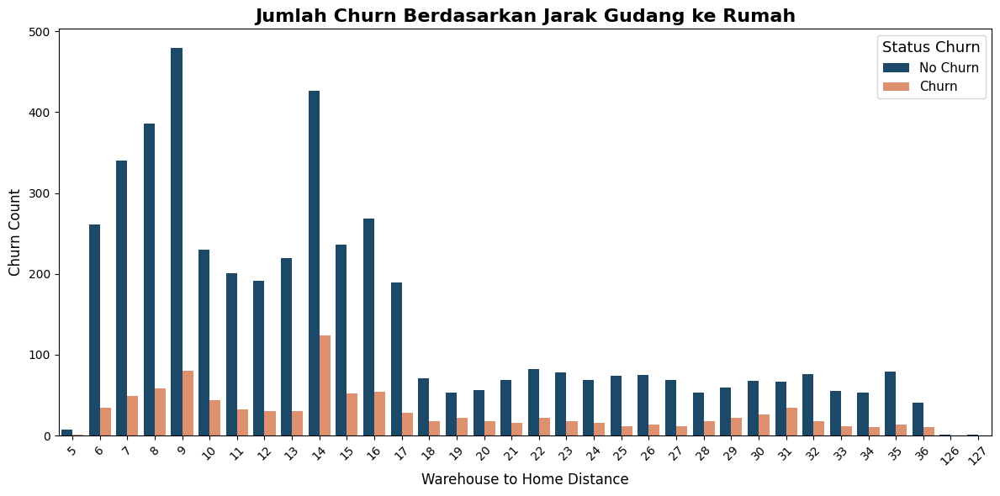

In [136]:
# Konversi kolom 'WarehouseToHome' menjadi integer
df['WarehouseToHome'] = df['WarehouseToHome'].astype(int)

churn_counts = df.groupby('WarehouseToHome')['Churn'].value_counts().unstack().fillna(0)

churn_counts_melted = churn_counts.reset_index().melt(id_vars='WarehouseToHome', var_name='Churn', value_name='Count')
churn_counts_melted['Churn'] = churn_counts_melted['Churn'].map({0: 'No Churn', 1: 'Churn'})

custom_palette = ['#0F4C75', '#F08A5D']

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(
    data=churn_counts_melted,
    x='WarehouseToHome',
    y='Count',
    hue='Churn',
    palette=custom_palette
)

# Tambah title and labels
plt.title('Jumlah Churn Berdasarkan Jarak Gudang ke Rumah', fontsize=16, fontweight='bold')
plt.xlabel('Warehouse to Home Distance', fontsize=12)
plt.ylabel('Churn Count', fontsize=12)

# Displaying legend and final plot settings
plt.legend(title='Status Churn', title_fontsize='13', fontsize='11')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [137]:
# Konversi kolom 'WarehouseToHome' menjadi integer
df['WarehouseToHome'] = df['WarehouseToHome'].astype(int)

# Hitung jumlah churn dan non-churn untuk setiap jarak Warehouse ke Home
churn_counts = df.groupby('WarehouseToHome')['Churn'].value_counts().unstack().fillna(0)

churn_counts.columns = ['No Churn', 'Churn']

# Hitung total dan proporsi
churn_counts['Total'] = churn_counts['Churn'] + churn_counts['No Churn']
churn_counts['Churn_Percentage'] = churn_counts['Churn'] / churn_counts['Total']
churn_counts['No_Churn_Percentage'] = churn_counts['No Churn'] / churn_counts['Total']

# Siapkan data untuk plotting
churn_counts_reset = churn_counts.reset_index()
churn_counts_melted = churn_counts_reset.melt(
    id_vars=['WarehouseToHome'],
    value_vars=['No_Churn_Percentage', 'Churn_Percentage'],
    var_name='Churn_Status',
    value_name='Percentage'
)

# Ubah nama status churn
churn_counts_melted['Churn_Status'] = churn_counts_melted['Churn_Status'].map({
    'No_Churn_Percentage': 'No Churn',
    'Churn_Percentage': 'Churn'
})

# Atur urutan kategori agar 'No Churn' muncul sebelum 'Churn'
churn_counts_melted['Churn_Status'] = pd.Categorical(
    churn_counts_melted['Churn_Status'],
    categories=['No Churn', 'Churn'],
    ordered=True
)

# Buat grafik
fig = px.bar(
    churn_counts_melted,
    x='WarehouseToHome',
    y='Percentage',
    color='Churn_Status',
    title='Proporsi Churn Berdasarkan Jarak Gudang ke Rumah',
    labels={
        'WarehouseToHome': 'Jarak Warehouse ke Home',
        'Percentage': 'Proporsi'
    },
    category_orders={'Churn_Status': ['No Churn', 'Churn']}
)

# Sesuaikan layout untuk menampilkan proporsi dalam bentuk persentase
fig.update_layout(
    barmode='stack',
    yaxis=dict(title='Proporsi', tickformat='.0%'),
    legend_title_text='Status Churn'
)

# Tampilkan grafik
fig.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, **kami memberi insight bahwa tingkat churn berbeda-beda berdasarkan jarak antara gudang ke rumah pelanggan dan bersifat fluktuatif berdasarkan tingkat churnnya.** Hal ini tidak dapat dijadikan faktor yang kuat apakah churn bisa dikaitkan dengan jarak antar rumah dengan gudang. Seperti contoh, jarak terjauh yaitu 126 dan 127 km, pelanggan tersebut tidak churn.

Berdasarkan analisis kami, ada **beberapa faktor mengapa terjadi tingkat churn pada beberapa jarak gudang ke rumah:**
1. Pelanggan merasa jaraknya kejauhan, sehingga mereka berpindah ke kompetitor lain.
2. Pelanggan memang tidak melakukan order karena tidak perlu dan jika perlu, mereka lebih cenderung suka ke offline store.
3. Pelanggan memiliki pengalaman buruk dengan ekspedisi terkait, sehingga mereka tidak percaya lagi dengan perusahaan Flipkart.

Lalu **untuk 126 dan 127 km kami menganalisis mengapa pelanggan tersebut cenderung tidak churn:**
1. Barang tersebut hanya ada di perusahaan tersebut, maka pelanggan tersebut tidak mempermasalahkan jarak.
2. Sudah terlanjur nyaman dengan perusahaan Flipkart, sejauh apapun tetap order.

</div>

## `Pelanggan Berdasarkan Perilaku`

<div style='text-align: justify'>

Segmentasi pelanggan berdasarkan perilaku adalah kolom `PreferredLoginDevice`, `PreferredPaymentMode`, `PreferredOrderCat`, `SatisfactionScore`, `HourSpendOnApp`, `NumberOfDeviceRegistered`, `Complain`.

</div>

### Hubungan `Churn` dengan `PreferredLoginDevice`

In [138]:
pd.DataFrame(df.groupby('PreferredLoginDevice')['Churn'].value_counts())

count
PreferredLoginDevice Churn       
Computer             0       1310
                     1        324
Mobile Phone         0       3372
                     1        624

<Figure size 1400x800 with 0 Axes>

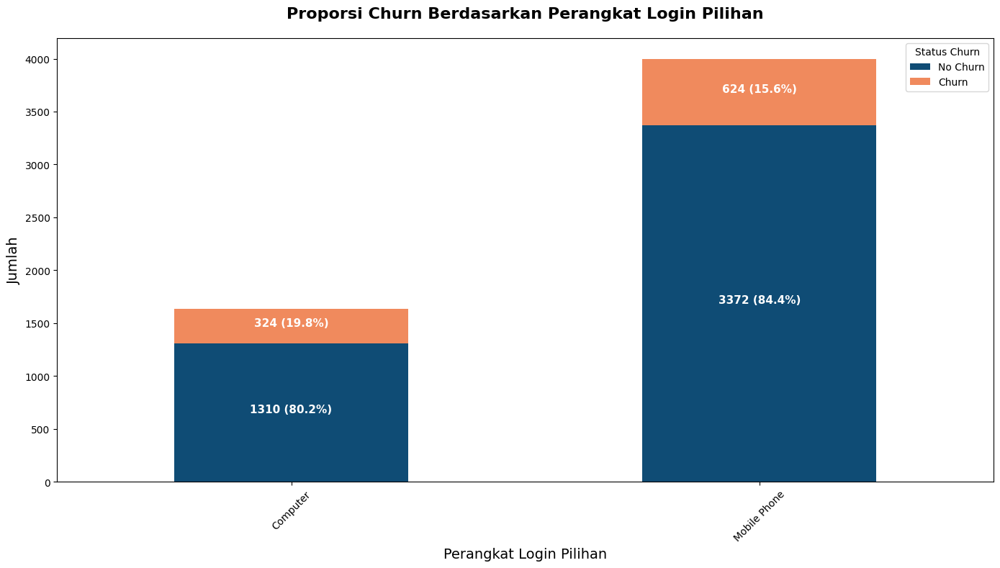

In [139]:
# Group data 'PreferredLoginDevice' dan 'Churn'
device_churn_counts = df.groupby(['PreferredLoginDevice', 'Churn']).size().unstack(fill_value=0)
device_churn_counts.columns = ['No Churn', 'Churn']

# Kalkulasi totals dan percentages
device_churn_counts['Total'] = device_churn_counts['No Churn'] + device_churn_counts['Churn']
device_churn_counts['No Churn %'] = (device_churn_counts['No Churn'] / device_churn_counts['Total']) * 100
device_churn_counts['Churn %'] = (device_churn_counts['Churn'] / device_churn_counts['Total']) * 100

# Plot stack bar
plt.figure(figsize=(14, 8))
device_churn_counts[['No Churn', 'Churn']].plot(kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(14, 8))

# Titles and labels
plt.title("Proporsi Churn Berdasarkan Perangkat Login Pilihan", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Perangkat Login Pilihan", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)
plt.xticks(rotation=45)

for index, (no_churn, churn, no_churn_pct, churn_pct) in enumerate(zip(
    device_churn_counts['No Churn'], 
    device_churn_counts['Churn'], 
    device_churn_counts['No Churn %'], 
    device_churn_counts['Churn %']
)):

    # Annotation for 'No Churn'
    plt.text(index, no_churn / 2, f"{int(no_churn)} ({no_churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)
    
    # Annotation for 'Churn'
    plt.text(index, no_churn + churn / 2, f"{int(churn)} ({churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)

plt.tight_layout()
plt.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")
plt.show()

In [140]:
churn_device_counts = df[df['Churn'] == 1]['PreferredLoginDevice'].value_counts()

device_churn_counts = churn_device_counts.values

device_total_counts = df['PreferredLoginDevice'].value_counts()

count = device_churn_counts.tolist()
nobs = device_total_counts.loc[churn_device_counts.index].tolist()

# Z-test
z_stat, p_value = proportions_ztest(count, nobs)

# Print
print('Hipotesis:')
print("H0: Proporsi churn sama antara masing-masing perangkat login yang dipilih.")
print("Ha: Proporsi churn berbeda antara masing-masing perangkat login yang dipilih.\n")

if p_value < 0.05:
    decision = "Tolak H0"
    hypothesis_result = "Terdapat perbedaan proporsi churn antara perangkat login yang dipilih."
else:
    decision = "Gagal tolak H0"
    hypothesis_result = "Tidak terdapat bukti cukup untuk menyatakan perbedaan proporsi churn antara perangkat login yang dipilih."

print(f"pvalue: {p_value:.4f}\n\n{decision}\n{hypothesis_result}\n")

Hipotesis:
H0: Proporsi churn sama antara masing-masing perangkat login yang dipilih.
Ha: Proporsi churn berbeda antara masing-masing perangkat login yang dipilih.

pvalue: 0.0001

Tolak H0
Terdapat perbedaan proporsi churn antara perangkat login yang dipilih.



<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami memberikan insight bahwa pelanggan yang menggunakan mobile phone sebagai **pemakaian utama lebih rendah tingkat churnnya sebesar 16% dibandingkan dengan pelanggan yang memakai komputer sebesar 20%.**

Kami melakukan uji statistika menggunakan Z-test untuk mengetahui apakah proporsi churn perangkat login computer apakah ada perbedaan proporsi atau sama saja dengan proporsi perangkat mobile phone, mengingat perbedaan angkanya tidak signifikan. **Setelah diuji, ternyata memiliki hipotesis bahwa terdapat perbedaan proporsi churn antara perangkat login yang dipilih.**

Hal ini dikarenakan karena **pemakaian mobile phone bersifat flexible**, dapat digunakan dimana saja dibanding penggunaan komputer yang bersifat tetap di satu tempat. Pelanggan cenderung senang jika bisa melakukan order dimana saja karena kegiatan/rutinitas yang mereka kerjakan setiap hari menggunakan aplikasi mobile phone. 

Hal lainnya adalah perusahaan **Flipkart sebelumnya menetapkan suatu kebijakan** dimana terdapat kupon eksklusif yang hanya tersedia di aplikasi saja, tidak bisa digunakan pada website. **Hal tersebut menyebabkan kecenderungan pelanggan beralih ke aplikasi mobile untuk menggunakan kupon tersebut.**

</div>

### Hubungan `Churn` dengan `PreferredPaymentMode`

In [141]:
pd.DataFrame(df.groupby('PreferredPaymentMode')['Churn'].value_counts())

count
PreferredPaymentMode Churn       
Cash on Delivery     0        386
                     1        128
Credit Card          0       1522
                     1        252
Debit Card           0       1958
                     1        356
E wallet             0        474
                     1        140
UPI                  0        342
                     1         72

<Figure size 1400x800 with 0 Axes>

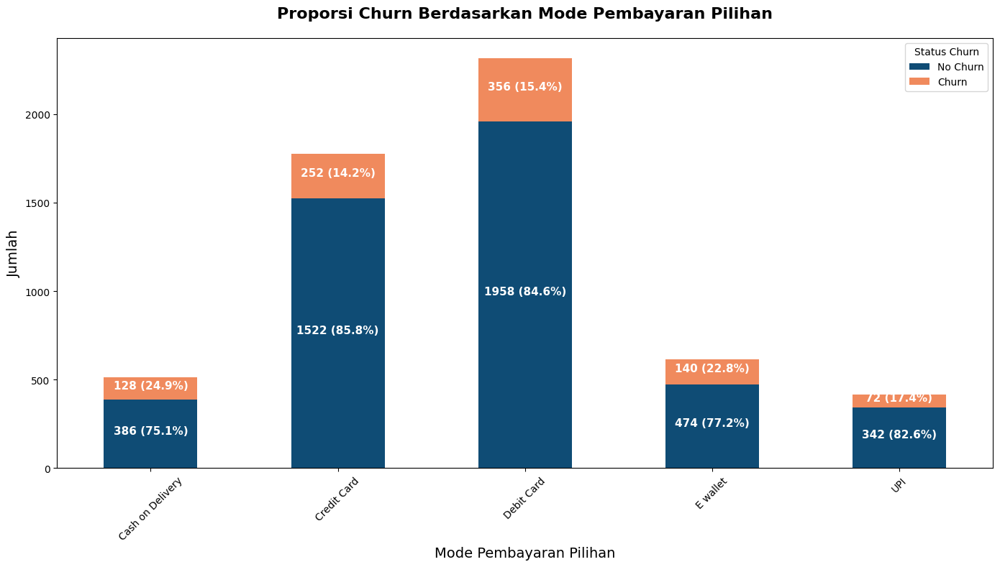

In [142]:
# Group data'PreferredPaymentMode' dan 'Churn'
payment_churn_counts = df.groupby(['PreferredPaymentMode', 'Churn']).size().unstack(fill_value=0)
payment_churn_counts.columns = ['No Churn', 'Churn']

payment_churn_counts['Total'] = payment_churn_counts['No Churn'] + payment_churn_counts['Churn']
payment_churn_counts['No Churn %'] = (payment_churn_counts['No Churn'] / payment_churn_counts['Total']) * 100
payment_churn_counts['Churn %'] = (payment_churn_counts['Churn'] / payment_churn_counts['Total']) * 100

plt.figure(figsize=(14, 8))
bar_plot = payment_churn_counts[['No Churn', 'Churn']].plot(kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(14, 8))

# Titles and labels for consistency
plt.title("Proporsi Churn Berdasarkan Mode Pembayaran Pilihan", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Mode Pembayaran Pilihan", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)
plt.xticks(rotation=45)

# Tambah anotasi
for index, (no_churn, churn, no_churn_pct, churn_pct) in enumerate(zip(
    payment_churn_counts['No Churn'], 
    payment_churn_counts['Churn'], 
    payment_churn_counts['No Churn %'], 
    payment_churn_counts['Churn %']
)):
    

    plt.text(index, no_churn / 2, f"{int(no_churn)} ({no_churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)
    

    plt.text(index, no_churn + churn / 2, f"{int(churn)} ({churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)

plt.tight_layout()
plt.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami mendapat insight bahwa proporsi churn tertinggi dan jumlah pemakaian yang sangat sedikit ada pada **pembayaran Cash On Delivery (COD) sebesar 25%, E-Wallet sebesar 23%, dan UPI 17%. Hal ini disebabkan oleh beberapa faktor karakteristik dari pembayaran tersebut.**

Seperti **Cash On Delivery (COD)**, biasanya digunakan oleh orang yang yang tidak mempunyai uang berbasis elektronik, **biasanya berdasarkan pengalaman, dipakai oleh kalangan anak muda yang belum cukup umur untuk membuka rekening sendiri atau orang yang belum percaya akan sistem pembayaran di perusahaan berbasis beli online.**

Untuk **E-Wallet dan UPI**, berdasarkan pengalaman, biasanya dipakai oleh kalangan anak muda yang tidak mau terikat oleh pembayaran berbasis kartu (kartu debit dan kredit).** Selain itu, kedua pembayaran tersebut biasanya mempunyai promo yang menarik yang didapat dari bermitra hanya di perusahaan kami untuk menarik peminat beralih ke 2 layanan pembayaran tersebut. Sehingga, pelanggan memakainya hanya bersifat sementara untuk membeli keperluan di perusahaan kami, lalu meninggalkan platform tersebut.

Untuk informasi lebih lanjut, **UPI (Unified Payments Interface) menghubungkan berbagai bank dalam satu platform**, memungkinkan transaksi langsung antar rekening bank tanpa perlu memindahkan uang ke e-wallet terlebih dahulu. Pengguna dapat membuat alamat pembayaran virtual UPI untuk melakukan transaksi tanpa harus membagikan detail rekening bank mereka.

Lalu yang **terakhir pada kartu kredit sebesar 14% dan kartu debit sebesar 15%**, memiliki tingkat churn yang paling rendah dan jumlah pemakaian yang terbanyak. **Berdasarkan pengalaman, hal ini disebabkan karena pelanggan sudah nyaman menggunakan kartu kredit/debit karena merasa perusahaan Flipkart aman dalam bertransaksi.** Alasan lainnya adalah karena penggunaan kartu kredit/debit mempunyai banyak promo eksklusif oleh bank terkait (diluar promo umum dari perusahaan Flipkart) dan hal terpenting bisa untuk melakukan cicilan 0% pada barang yang ingin dibeli (pembelian elektronik, dan lain-lain).

</div>

### Hubungan `Churn` dengan `PreferredOrderCat`

In [143]:
pd.DataFrame(df.groupby('PreferredOrderCat')['Churn'].value_counts())

count
PreferredOrderCat  Churn       
Fashion            0        698
                   1        128
Grocery            0        390
                   1         20
Laptop & Accessory 0       1840
                   1        210
Mobile Phone       0       1510
                   1        570
Others             0        244
                   1         20

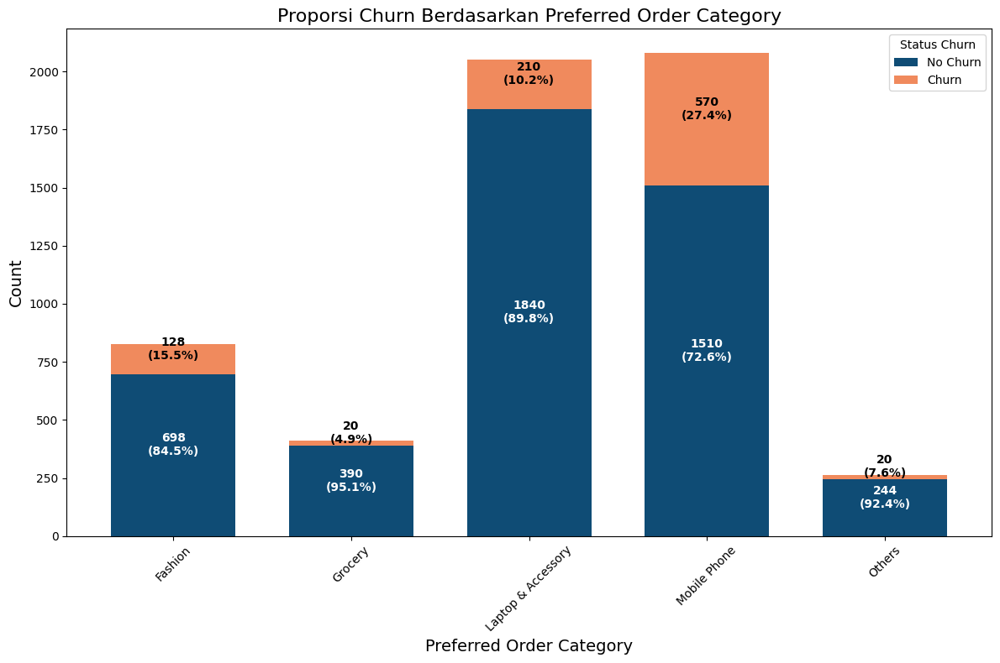

In [144]:
# Group data 'PreferredOrderCat' dan 'Churn'
grouped_data = df.groupby('PreferredOrderCat')['Churn'].value_counts().unstack(fill_value=0)

adjusted_colors = ["#0F4C75", "#F08A5D"]

# Buat stack bar
plt.figure(figsize=(12, 8))
grouped_data.plot(kind='bar', stacked=True, color=adjusted_colors, width=0.7, ax=plt.gca())

# Tambah title and labels
plt.title('Proporsi Churn Berdasarkan Preferred Order Category', fontsize=16)
plt.xlabel('Preferred Order Category', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)

# Tambah legend dan anotasi
plt.legend(title='Status Churn', labels=['No Churn', 'Churn'], loc='upper right')
for i, (no_churn, churn) in enumerate(zip(grouped_data[0], grouped_data[1])):
    total = no_churn + churn
    # Annotations for No Churn and Churn with percentages
    plt.text(i, no_churn / 2, f'{no_churn:.0f}\n({no_churn / total * 100:.1f}%)', 
             ha='center', color='white', fontsize=10, fontweight='bold')
    plt.text(i, no_churn + churn / 2, f'{churn:.0f}\n({churn / total * 100:.1f}%)', 
             ha='center', color='black', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, **kami dapat memberi insight bahwa kategori grocery sebesar 5%, memiliki churn rate paling rendah di antara semua kategori.** Produk grocery cenderung memiliki siklus pembelian yang lebih sering dan stabil, serta pelanggan biasanya membeli kebutuhan sehari-hari yang lebih rutin. Pelanggan yang membeli kebutuhan pokok sering kali lebih loyal dan tetap bertahan pada platform karena kenyamanan yang diberikan.

**Untuk kategori others mempunyai tingkat churn sebesar 8%.** Kemungkinan, produk di kategori ini memiliki daya tarik yang spesifik yang tidak ada di kompetitor lainnya, atau pelanggan yang memilih kategori ini cenderung memiliki kebutuhan yang lebih khusus, sehingga lebih loyal dan jarang berpindah platform karena tidak ada pilihan lain.

**Untuk kategori laptop dan aksesoris tingkat churn sebesar 10%.** Produk elektronik seperti laptop dan aksesoris cenderung memiliki durasi penggunaan yang lebih panjang, dan pelanggan biasanya tidak sering berpindah platform untuk pembelian perangkat elektronik yang lebih mahal atau jarang dibeli.

**Untuk kategori fashion tingkat churn sebesar 16%.** Ini mungkin karena tren fashion yang cepat berubah sehingga pelanggan cenderung beralih ke kompetitor lain yang menawarkan produk fashion terbaru atau lebih menarik.

**Untuk mobile phone memiliki tingkat churn paling tinggi sebesar 27%.**  Hal ini disebabkan oleh tingginya kompetisi antar platform untuk kategori ini. Selain itu, pelanggan yang membeli ponsel cenderung melakukan perbandingan harga yang ketat dan mungkin mudah berpindah ke kompetitor lain jika menemukan penawaran yang lebih baik. Produk mobile phone juga memiliki banyak variasi dan penawaran spesial yang sering kali membuat pelanggan berpindah-pindah platform.

</div>

### Hubungan `Churn` dengan `HourSpendOnApp`

In [145]:
pd.DataFrame(df.groupby('HourSpendOnApp')['Churn'].value_counts())

count
HourSpendOnApp Churn       
0.0            0          3
1.0            0         35
2.0            0       1239
               1        232
3.0            0       2424
               1        518
4.0            0        978
               1        198
5.0            0          3

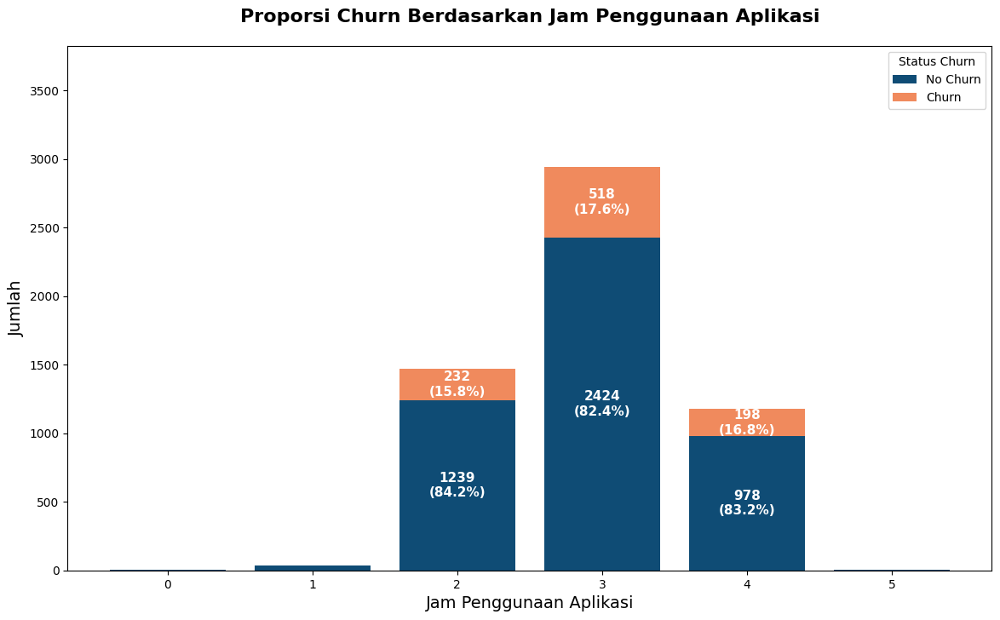

In [146]:
# Data 'HourSpendOnApp' dan 'Churn'
hour_spend_churn_counts = df.groupby('HourSpendOnApp')['Churn'].value_counts().unstack().fillna(0)
hour_spend_churn_counts['Total'] = hour_spend_churn_counts.sum(axis=1)
hour_spend_churn_counts['Prop_Churn_0'] = (hour_spend_churn_counts[0] / hour_spend_churn_counts['Total']) * 100
hour_spend_churn_counts['Prop_Churn_1'] = (hour_spend_churn_counts[1] / hour_spend_churn_counts['Total']) * 100

palette = ["#0F4C75", "#F08A5D"]

bar_width = 0.8  

plt.figure(figsize=(14, 8))
bar1 = plt.bar(hour_spend_churn_counts.index, hour_spend_churn_counts[0], color=palette[0], label="No Churn", width=bar_width)
bar2 = plt.bar(hour_spend_churn_counts.index, hour_spend_churn_counts[1], bottom=hour_spend_churn_counts[0], color=palette[1], label="Churn", width=bar_width)

for index, row in hour_spend_churn_counts.iterrows():
    if index not in [0, 1, 5]:
        plt.text(index, row[0] / 2, f"{int(row[0])}\n({row['Prop_Churn_0']:.1f}%)", 
                 ha='center', va='center', color="white", fontweight='bold', fontsize=11)
        plt.text(index, row[0] + (row[1] / 2), f"{int(row[1])}\n({row['Prop_Churn_1']:.1f}%)", 
                 ha='center', va='center', color="white", fontweight='bold', fontsize=11)

plt.ylim(0, hour_spend_churn_counts['Total'].max() * 1.3)

# Atur titles dan labels
plt.title("Proporsi Churn Berdasarkan Jam Penggunaan Aplikasi", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Jam Penggunaan Aplikasi", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)

# Tambah legend
plt.legend(title="Status Churn", loc='upper right')

# Lihat plot
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami dapat memberikan insight bahwa pelanggan dengan penggunaan aplikasi sebesar **2 sampai 4 jam mengalami tingkat churn yang tinggi yaitu di atas 15%.** Sedangkan penggunaan **aplikasi 0, 1, dan 5 jam tidak ada tingkat churnnya sebesar 0%.** Tingkat churn yang tinggi disebabkan oleh beberapa faktor salah satunya adalah produk yang dicari tidak ditemukan di perusahaan tersebut.

</div>

### Hubungan `Churn` dengan `NumberOfDeviceRegistered`

In [147]:
pd.DataFrame(df.groupby('NumberOfDeviceRegistered')['Churn'].value_counts())

count
NumberOfDeviceRegistered Churn       
1                        0        213
                         1         22
2                        0        250
                         1         26
3                        0       1445
                         1        254
4                        0       1985
                         1        392
5                        0        683
                         1        198
6                        0        106
                         1         56

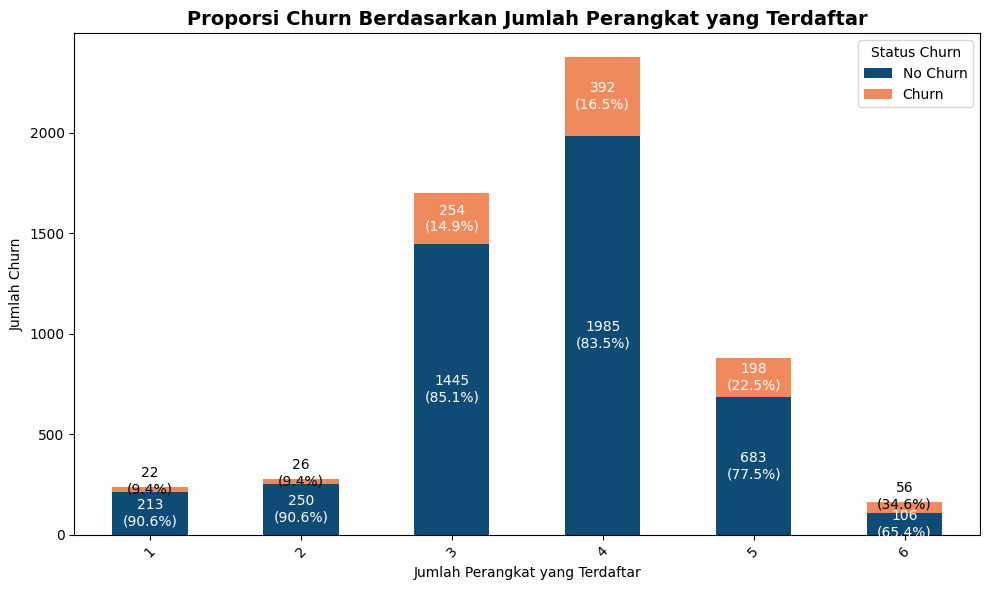

In [148]:
# Mengelompokkan data berdasarkan jumlah perangkat yang terdaftar dan status churn
grouped_data = df.groupby('NumberOfDeviceRegistered')['Churn'].value_counts().unstack().fillna(0)

# Warna untuk setiap status churn
colors = ["#0F4C75", "#F08A5D"]

# Membuat figure dan axis
fig, ax = plt.subplots(figsize=(10, 6))

# Membuat stacked bar chart tanpa border di bar
grouped_data.plot(kind='bar', stacked=True, color=colors, ax=ax)

# Menambahkan anotasi untuk setiap segmen bar
for i, (index, row) in enumerate(grouped_data.iterrows()):
    bottom = 0
    for j, value in enumerate(row):
        # Menghitung persentase
        percentage = f"{(value / row.sum()) * 100:.1f}%"

        # Menyesuaikan posisi anotasi berdasarkan nilai
        if value < 100 and j == 1:
            ax.text(i, bottom + value + 30, f"{value}\n({percentage})", ha="center", va="center", color="black", fontsize=10)
        else:
            ax.text(i, bottom + value / 2, f"{value}\n({percentage})", ha="center", va="center", color="white", fontsize=10)
        bottom += value

# Mengatur judul dan label
ax.set_title("Proporsi Churn Berdasarkan Jumlah Perangkat yang Terdaftar", fontsize=14, fontweight="bold")
ax.set_xlabel("Jumlah Perangkat yang Terdaftar")
ax.set_ylabel("Jumlah Churn")

plt.xticks(rotation=45)

# Menambahkan legenda yang sesuai
ax.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")

# Menampilkan plot dengan layout yang rapih
plt.tight_layout()
plt.show()


<div style='text-align: justify'>

Berdasarkan hasil visualisasi di atas, kami dapat memberikan insight bahwa tingkat churn terendah adalah pelanggan yang mempunyai **jumlah perangkat maksimal 2 sebesar 9%.** Jumlah perangkat yang lebih dari 2 mempunyai tingkat churn yang sangat tinggi perbandingannya dibanding pelanggan yang mempunyai **jumlah perangkat 1 atau 2, yaitu berkisar antara 15% - 35%.**

</div>

### Hubungan `Churn` dengan `SatisfactionScore`

In [149]:
pd.DataFrame(df.groupby('SatisfactionScore')['Churn'].value_counts())

count
SatisfactionScore Churn       
1                 0       1030
                  1        134
2                 0        512
                  1         74
3                 0       1406
                  1        292
4                 0        890
                  1        184
5                 0        844
                  1        264

<Figure size 1200x800 with 0 Axes>

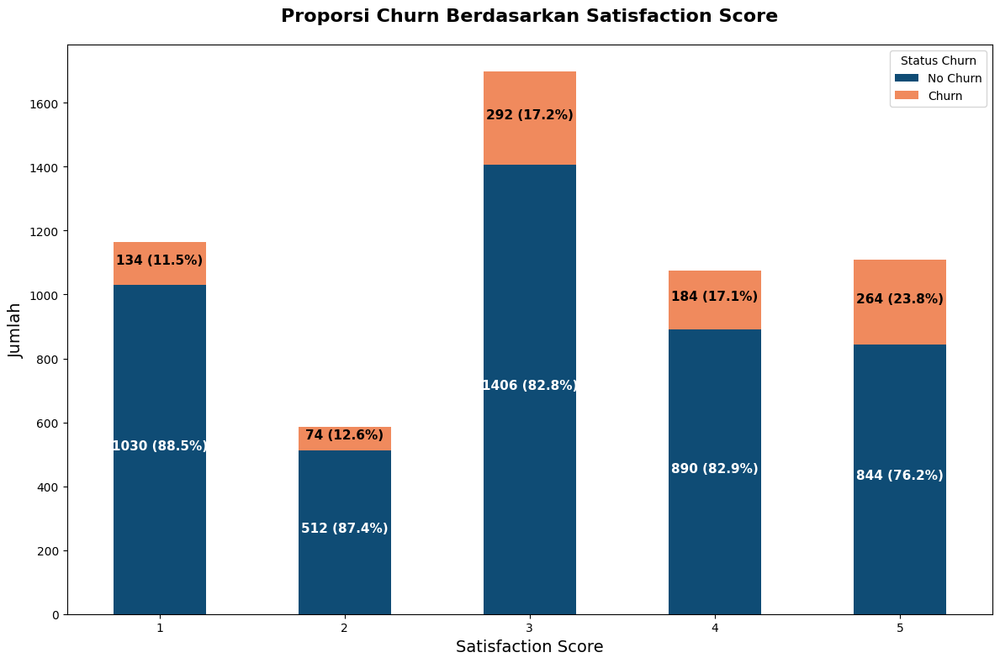

In [150]:
# Group 'SatisfactionScore' dan 'Churn'
satisfaction_churn_counts = pd.DataFrame(df.groupby('SatisfactionScore')['Churn'].value_counts())

satisfaction_churn_pivot = satisfaction_churn_counts.unstack(level=1).fillna(0)
satisfaction_churn_pivot.columns = ['Not Churn', 'Churn']

# Kalkulasi totals and persentasi
satisfaction_churn_pivot['Total'] = satisfaction_churn_pivot['Not Churn'] + satisfaction_churn_pivot['Churn']
satisfaction_churn_pivot['Not Churn %'] = (satisfaction_churn_pivot['Not Churn'] / satisfaction_churn_pivot['Total']) * 100
satisfaction_churn_pivot['Churn %'] = (satisfaction_churn_pivot['Churn'] / satisfaction_churn_pivot['Total']) * 100

# Plot stack bar
plt.figure(figsize=(12, 8))
satisfaction_churn_pivot[['Not Churn', 'Churn']].plot(kind='bar', stacked=True, color=['#0F4C75', '#F08A5D'], figsize=(12, 8))

# Titles and labels
plt.title("Proporsi Churn Berdasarkan Satisfaction Score", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Satisfaction Score", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)

for index, (not_churn, churn, not_churn_pct, churn_pct) in enumerate(zip(
    satisfaction_churn_pivot['Not Churn'], 
    satisfaction_churn_pivot['Churn'], 
    satisfaction_churn_pivot['Not Churn %'], 
    satisfaction_churn_pivot['Churn %']
)):

    
    plt.text(index, not_churn / 2, f"{int(not_churn)} ({not_churn_pct:.1f}%)", 
             ha='center', color='white', fontweight='bold', fontsize=11)

   
    plt.text(index, not_churn + churn / 2, f"{int(churn)} ({churn_pct:.1f}%)", 
             ha='center', color='black', fontweight='bold', fontsize=11)

plt.xticks(rotation=0)
plt.tight_layout()
plt.legend(["No Churn", "Churn"], title="Status Churn", loc="upper right")
plt.show()

<div style='text-align: justify'>

Berdasarkan hasil visualisai di atas, kami dapat memberikan insight bahwa pemberian skor yang kecil belum tentu menyebabkan kenaikan tingkat churn. **Hal ini dapat dilihat bahwa pemberian rating 1 dan 2 memiliki proporsi churn yang sangat rendah yaitu dibawah 13% dibandingkan pemberian rating 3 sampai dengan 5 dengan tingkat churn di atas 17%.**

Hal ini kami **analisis lebih lanjut mengapa tingkat churn pada bintang 1 dan 2 lebih kecil dibanding bintang 3 sampai 5:**
1. Pelanggan yang memberikan skor rendah mungkin adalah pengguna yang sudah terbiasa dengan layanan tersebut atau memiliki keterbatasan dalam menemukan alternatif lain.
2. Pelanggan dengan skor kepuasan rendah mungkin sudah memiliki ekspektasi yang rendah sejak awal. Mereka mungkin telah menerima beberapa kekurangan dari layanan dan tidak terlalu mengharapkan peningkatan signifikan.

Sebaliknya, **bintang 3 sampai 5, tingkat churnnya relatif tinggi dibanding bintang 1 dan 2:**
1. Pelanggan merasa bahwa kepuasan mereka belum maksimal meskipun layanannya cukup baik, sehingga lebih mudah untuk beralih ke kompetitor lain.
2. Pelanggan dengan skor tinggi menikmati promosi awal atau diskon yang menarik sehingga mereka memberikan skor bagus. Namun, setelah masa promosi berakhir atau harga kembali normal, loyalitas mereka mungkin menurun dan mereka lebih mudah churn, terutama jika mereka merasa platform lain menawarkan promosi yang lebih menarik.
3. Pelanggan dengan skor kepuasan tinggi mungkin merasa bahwa meskipun mereka puas dengan layanan, tidak ada insentif tambahan yang membuat mereka tetap loyal pada perusahaan Flipkart.

</div>

### Hubungan `Churn` dengan `Complain`

In [151]:
pd.DataFrame(df.groupby('Complain')['Churn'].value_counts())

count
Complain Churn       
0        0       3586
         1        440
1        0       1096
         1        508

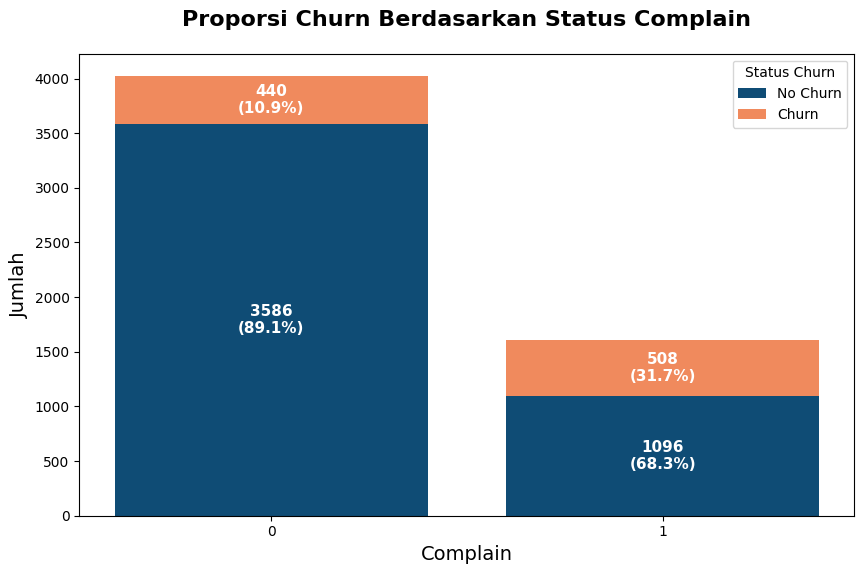

In [152]:
# Group data and calculate proportions
complain_churn_counts = df.groupby('Complain')['Churn'].value_counts().unstack().fillna(0)
complain_churn_counts['Total'] = complain_churn_counts.sum(axis=1)
complain_churn_counts['Prop_Churn_0'] = (complain_churn_counts[0] / complain_churn_counts['Total']) * 100
complain_churn_counts['Prop_Churn_1'] = (complain_churn_counts[1] / complain_churn_counts['Total']) * 100

# Define the updated color palette
palette = ["#0F4C75", "#F08A5D"]

# Plot stack bar
plt.figure(figsize=(10, 6))
bar1 = plt.bar(complain_churn_counts.index, complain_churn_counts[0], color=palette[0], label="No Churn")
bar2 = plt.bar(complain_churn_counts.index, complain_churn_counts[1], bottom=complain_churn_counts[0], color=palette[1], label="Churn")

# Tambah anotasi
for index, row in complain_churn_counts.iterrows():
    plt.text(index, row[0] / 2, f"{int(row[0])}\n({row['Prop_Churn_0']:.1f}%)", ha='center', va='center', color="white", fontweight='bold', fontsize=11)
    plt.text(index, row[0] + (row[1] / 2), f"{int(row[1])}\n({row['Prop_Churn_1']:.1f}%)", ha='center', va='center', color="white", fontweight='bold', fontsize=11)

# Set titles and labels
plt.title("Proporsi Churn Berdasarkan Status Complain", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Complain", fontsize=14)
plt.ylabel("Jumlah", fontsize=14)

plt.xticks(ticks=[0, 1], labels=['0', '1'])
plt.legend(title="Status Churn", loc='upper right')

# Tunjukkan plot
plt.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa pelanggan yang pernah melakukan complain/pengaduan sebelumnya, **cenderung untuk melakukan churn lebih tinggi sebesar 32% dibandingkan pelanggan yang belum pernah melakukan complain sebelumnya sebesar 11%.**

**Hal ini tentu karena beberapa faktor yang mempengaruhi berikut ini:**
1. Pelanggan merasa kecewa akan produk yang dikirim ke rumahnya tidak sesuai/rusak.
2. Jasa pengiriman yang lambat.

**Berbeda dengan sudut pandang jika pelanggan tidak pernah complain/pengaduan, tetapi melakukan churn:**
1. Pelanggan mendapat benefit lebih menguntungkan di kompetitor lain.
2. Hanya memanfaatkan voucher yang ada untuk order produk, sehingga pelanggan tidak akan order di kemudian hari jika tidak ada voucher.

</div>

##  `Pelanggan Berdasarkan Transaksional`

Segmentasi pelanggan berdasarkan transaksional adalah kolom `Tenure`, `OrderAmountHikeFromlastYear`, `CouponUsed`, `OrderCount`, `DaySinceLastOrder`, `CashbackAmount`.

### Hubungan `Churn` dengan `Tenure`

In [153]:
pd.DataFrame(df.groupby('Tenure')[['Churn']].value_counts())

count
Tenure Churn       
0.0    1        272
       0        236
1.0    1        349
       0        341
2.0    0        153
       1         14
3.0    0        177
       1         18
4.0    0        183
       1         20
5.0    0        188
       1         16
6.0    0        175
       1          8
7.0    0        205
       1         16
8.0    0        247
       1         16
9.0    0        418
       1         93
10.0   0        199
       1         14
11.0   0        184
       1         10
12.0   0        175
       1          7
13.0   0        168
       1         13
14.0   0        162
       1         14
15.0   0        149
       1         10
16.0   0        139
       1         10
17.0   0        102
       1          4
18.0   0        117
       1          6
19.0   0        128
       1         12
20.0   0         93
       1         16
21.0   0         74
       1         10
22.0   0         76
23.0   0         89
24.0   0         75
25.0   0         59
26.0   0         60
27.0   0         66
28.0   0         70
29.0   0         55
30.0   0         66
31.0   0         49
50.0   0          1
51.0   0          1
60.0   0          1
61.0   0          1

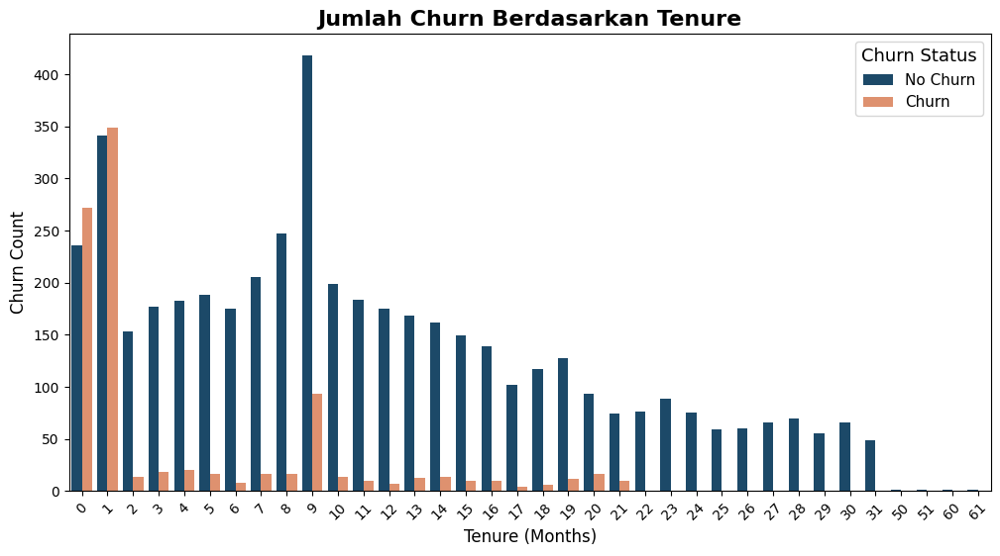

In [154]:
df['Tenure'] = df['Tenure'].astype(int)

churn_counts_by_tenure = df.groupby(['Tenure', 'Churn']).size().reset_index(name='Count')

churn_counts_by_tenure['Churn'] = churn_counts_by_tenure['Churn'].replace({0: 'No Churn', 1: 'Churn'})

palette = {'No Churn': '#0F4C75', 'Churn': '#F08A5D'}

# Buat plot
plt.figure(figsize=(12, 6))
sns.barplot(
    data=churn_counts_by_tenure,
    x='Tenure',
    y='Count',
    hue='Churn',
    palette=palette
)

# Tambah title dan labels
plt.title('Jumlah Churn Berdasarkan Tenure', fontsize=16, fontweight='bold')
plt.xlabel('Tenure (Months)', fontsize=12)
plt.ylabel('Churn Count', fontsize=12)

plt.legend(title='Churn Status', title_fontsize='13', fontsize='11')
plt.xticks(rotation=45)

plt.show()

In [155]:
# Konversi kolom 'Tenure' ke integer
df['Tenure'] = df['Tenure'].astype(int)

# Hitung jumlah churn berdasarkan Tenure dan Churn status
churn_counts_by_tenure = df.groupby(['Tenure', 'Churn']).size().reset_index(name='Count')
churn_counts_by_tenure['Churn'] = churn_counts_by_tenure['Churn'].replace({0: 'No Churn', 1: 'Churn'})

# Siapkan data
tenure_churn_data = churn_counts_by_tenure.pivot(index='Tenure', columns='Churn', values='Count').reset_index().fillna(0)
tenure_churn_data = tenure_churn_data.melt(id_vars='Tenure', var_name='Churn Status', value_name='Count')

# Buat line chart
fig = px.line(
    tenure_churn_data,
    x='Tenure',
    y='Count',
    color='Churn Status',
    title='Tren Jumlah Churn Berdasarkan Tenure',
    markers=True,
    color_discrete_map={'No Churn': '#0F4C75', 'Churn': '#F08A5D'}
)

# Update layout untuk memperjelas tampilan
fig.update_layout(
    xaxis_title='Tenure (Months)',
    yaxis_title='Churn Count',
    legend_title='Churn Status',
    title_font=dict(size=16, color='black'),
    title_x=0.5
)

fig.show()

<div style='text-align: justify'>

Dari visualisasi di atas, kami dapat **memberikan insight bahwa pelanggan yang mempunyai tenure 0 sampai 1 bulan mempunyai tingkat churn yang lebih tinggi.** Hal ini disebabkan oleh beberapa faktor antara lain:
1. Pelanggan hanya mencoba order di platform kami tersebut dengan kupon voucher, cashback, yang hanya ada saat pertama kali mendaftar.
2. Pelanggan merasa tidak puas dengan produk yang dibeli pertama kali (layanan, kualitas produk, pengiriman, dll).
3. Pelanggan merasa perusahaan kami tidak memberikan benefit yang berarti seperti voucher untuk mereka individu sehingga ketika ada kompetitor yang lebih baik, mereka lebih mudah untuk meninggalkan perusahaan.

**Pada pelanggan yang mempunyai tenure 2 bulan sampai paling tinggi 61 bulan di visualisasi, tingkat churn pelanggan cenderung konsisten di angka kurang dari 20.** Hal ini dikarenakan pelanggan merasa pengalaman berbelanja yang lebih baik dibandingkan dengan kompetitor lainnya dan pelanggan cenderung sudah nyaman dengan perusahaan kami karena pelayanan yang kami berikan sangat baik.

**Khusus untuk bulan ke 9, ada lonjakan kenaikan sebanyak 93 pelanggan yang churn**. Hal ini disebabkan karena di India khususnya hari raya besar seperti Durga Puja dan Navratri. Di perusahaan kami (Flipkart), kami mengadakan event bernama "Big Billion Days" yang menawarkan berbagai macam diskon besar bagi semua produk. Sehingga pelanggan berburu diskonan tersebut dengan "One-Time Shoppers" yang hanya memanfaatkan situasi tersebut tanpa ada niatan untuk order di perusahaan kami kembali.

</div>

### Hubungan `Churn` dengan `OrderAmountHikeFromLastYear`

In [156]:
pd.DataFrame(df.groupby('OrderAmountHikeFromlastYear')['Churn'].value_counts())

count
OrderAmountHikeFromlastYear Churn       
11.0                        0        309
                            1         82
12.0                        0        584
                            1        144
13.0                        0        613
                            1        128
14.0                        0        634
                            1        116
15.0                        0        711
                            1         96
16.0                        0        269
                            1         64
17.0                        0        243
                            1         54
18.0                        0        267
                            1         54
19.0                        0        267
                            1         44
20.0                        0        211
                            1         32
21.0                        0        166
                            1         24
22.0                        0        150
                            1         34
23.0                        0        108
                            1         36
24.0                        0         60
                            1         24
25.0                        0         59
                            1         14
26.0                        0         31
                            1          2

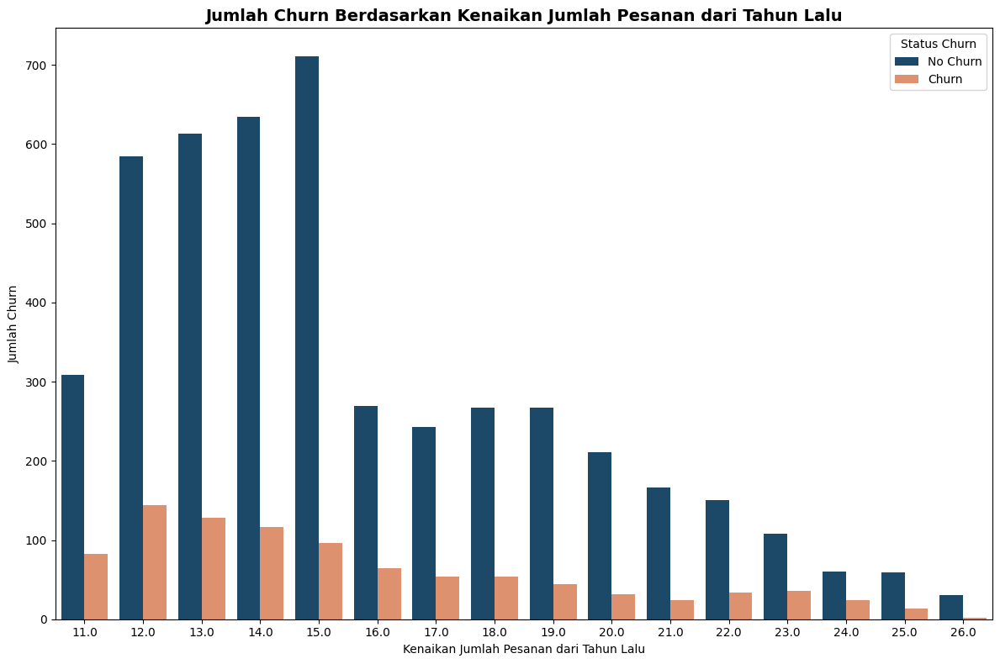

In [157]:
# Mengelompokkan data berdasarkan 'OrderAmountHikeFromlastYear' dan menghitung jumlah (count) 'Churn'
order_amount_hike_churn_count = df.groupby('OrderAmountHikeFromlastYear')['Churn'].value_counts().unstack(fill_value=0)
order_amount_hike_churn_count = order_amount_hike_churn_count.reset_index()
order_amount_hike_churn_count.columns = ['OrderAmountHikeFromlastYear', 'No Churn', 'Churn']
order_amount_hike_churn_count = order_amount_hike_churn_count.melt(id_vars="OrderAmountHikeFromlastYear", var_name="Status Churn", value_name="Jumlah")

# Mengatur ukuran figure
plt.figure(figsize=(12, 8))

# Membuat plot
sns.barplot(data=order_amount_hike_churn_count, x='OrderAmountHikeFromlastYear', y='Jumlah', hue='Status Churn', palette=colors)

# Mengatur judul dan label
plt.title("Jumlah Churn Berdasarkan Kenaikan Jumlah Pesanan dari Tahun Lalu", fontsize=14, fontweight="bold")
plt.xlabel("Kenaikan Jumlah Pesanan dari Tahun Lalu")
plt.ylabel("Jumlah Churn")

# Menampilkan plot
plt.legend(title="Status Churn")
plt.tight_layout()
plt.show()

In [158]:
# Menghitung proporsi churn berdasarkan 'OrderAmountHikeFromlastYear'
order_amount_hike_churn_prop = df.groupby('OrderAmountHikeFromlastYear')['Churn'].value_counts(normalize=True).unstack(fill_value=0)
order_amount_hike_churn_prop = order_amount_hike_churn_prop.reset_index()
order_amount_hike_churn_prop.columns = ['OrderAmountHikeFromlastYear', 'No Churn', 'Churn']

# Membuat visualisasi
fig = px.bar(
    order_amount_hike_churn_prop,
    x="OrderAmountHikeFromlastYear",
    y=["No Churn", "Churn"],
    title="Proporsi Churn Berdasarkan Kenaikan Jumlah Pesanan dari Tahun Lalu",
    labels={"value": "Proporsi", "OrderAmountHikeFromlastYear": "Kenaikan Jumlah Pesanan dari Tahun Lalu", "variable": "Status Churn"}
)

# Menyusun tampilan stack
fig.update_layout(barmode='stack', yaxis=dict(tickformat=".0%"))

# Menampilkan plot
fig.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa proporsi tingkat churn berdasarkan kenaikan jumlah pesanan dari tahun lalu **mengalami fluktuasi naik turun dalam tingkat churn dengan range 6-29%.** 

Tidak ada interval yang menunjukkan peningkatan drastis dalam proporsi churn. Ini mungkin berarti bahwa loyalitas pelanggan tidak banyak dipengaruhi oleh kenaikan jumlah pesanan, atau bisa juga bahwa program retensi yang ada cukup efektif dalam mempertahankan pelanggan meskipun terjadi kenaikan beban orderan.

</div>

### Hubungan `Churn` dengan `CouponUsed`

In [159]:
pd.DataFrame(df.groupby('CouponUsed')['Churn'].value_counts())

count
CouponUsed Churn       
0          0        844
           1        186
1          0       1975
           1        386
2          0       1061
           1        222
3          0        281
           1         46
4          0        167
           1         30
5          0        106
           1         23
6          0         90
           1         18
7          0         71
           1         18
8          0         33
           1          9
9          0         11
           1          2
10         0         11
           1          3
11         0         10
           1          2
12         0          8
           1          1
13         0          8
14         0          5
15         1          1
16         0          1
           1          1

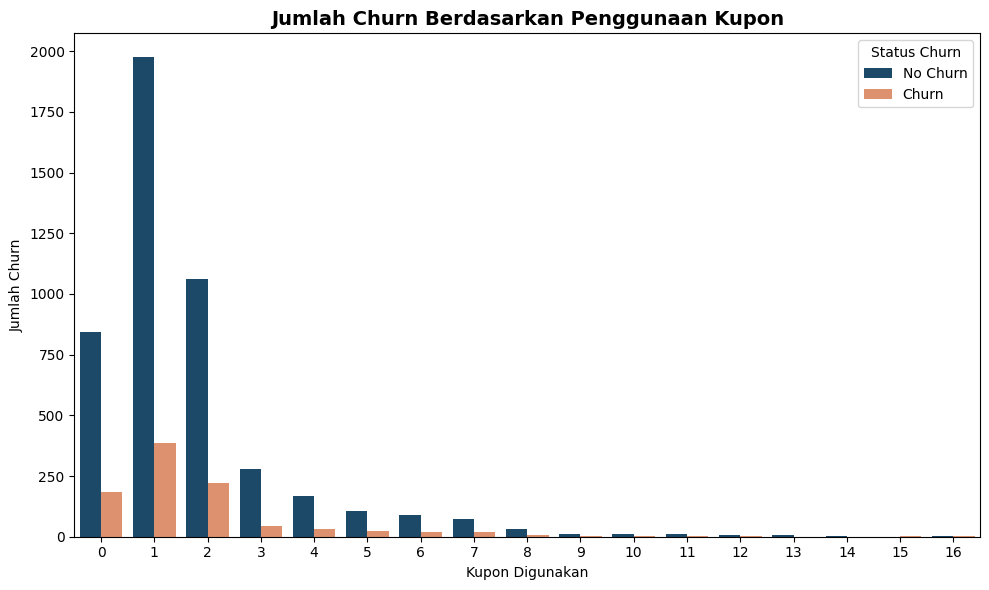

In [160]:
# Mengelompokkan data berdasarkan 'CouponUsed' dan menghitung jumlah 'Churn'
coupon_churn_count = df.groupby('CouponUsed')['Churn'].value_counts().unstack(fill_value=0)
coupon_churn_count = coupon_churn_count.reset_index()
coupon_churn_count.columns = ['CouponUsed', 'No Churn', 'Churn']
coupon_churn_count = coupon_churn_count.melt(id_vars="CouponUsed", var_name="Status Churn", value_name="Jumlah")

# Mengatur ukuran figure untuk membuat stack bar chart jumlah count
plt.figure(figsize=(10, 6))

# Membuat bar chart untuk jumlah count
sns.barplot(data=coupon_churn_count, x='CouponUsed', y='Jumlah', hue='Status Churn', palette=colors)

# Mengatur judul dan label
plt.title("Jumlah Churn Berdasarkan Penggunaan Kupon", fontsize=14, fontweight="bold")
plt.xlabel("Kupon Digunakan")
plt.ylabel("Jumlah Churn")

# Menampilkan plot
plt.legend(title="Status Churn")
plt.tight_layout()
plt.show()

In [161]:
# Mengelompokkan data berdasarkan 'CouponUsed' dan menghitung proporsi 'Churn'
coupon_churn_prop = df.groupby('CouponUsed')['Churn'].value_counts(normalize=True).unstack(fill_value=0)
coupon_churn_prop = coupon_churn_prop.reset_index()
coupon_churn_prop.columns = ['CouponUsed', 'No Churn', 'Churn']

# Membuat visualisasi
fig = px.bar(
    coupon_churn_prop, 
    x="CouponUsed", 
    y=["No Churn", "Churn"], 
    title="Proporsi Churn Berdasarkan Penggunaan Kupon",
    labels={"value": "Proporsi", "CouponUsed": "Kupon Digunakan", "variable": "Status Churn"}
)

# Menyusun tampilan stack
fig.update_layout(barmode='stack', yaxis=dict(tickformat=".0%"))

# Menampilkan plot
fig.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa pada rentang jumlah **kupon yang digunakan dari 0 hingga 12, proporsi churn relatif stabil dengan range 11-21%.** Tidak terlihat adanya perubahan signifikan dalam proporsi churn seiring dengan peningkatan jumlah kupon yang digunakan dalam rentang ini. Hal ini menunjukkan bahwa penggunaan kupon dalam jumlah rendah hingga menengah tidak berdampak signifikan terhadap kecenderungan churn pelanggan.

**Pada pemakaian kupon 15 dan 16, terdapat cukup signifikan terhadap tingkat churn. Hal ini bisa terjadi karena beberapa faktor yaitu:**
1. Perusahaan Flipkart memiliki batasan diskon maksimum, sehingga tidak ada kupon kembali/penurunan tingkat diskon/cashback.
2. Pelanggan sudah mendapat keuntungan lain dari kompetitor lain. Oleh karena itu pelanggan memutuskan untuk churn.
3. Pelanggan merasa jenuh karena dari sekian banyak kupon yang dipakai, benefit yang digunakan bersifat stagnan atau bahkan berkurang.

</div>

### Hubungan `Churn` dengan `OrderCount`

In [162]:
pd.DataFrame(df.groupby('OrderCount')['Churn'].value_counts())

count
OrderCount Churn       
1          0       1435
           1        316
2          0       1895
           1        388
3          0        303
           1         68
4          0        176
           1         28
5          0        167
           1         14
6          0        121
           1         16
7          0        164
           1         42
8          0        140
           1         32
9          0         54
           1          8
10         0         28
           1          8
11         0         45
           1          6
12         0         52
           1          2
13         0         28
           1          2
14         0         30
           1          6
15         0         27
           1          6
16         0         17
           1          6

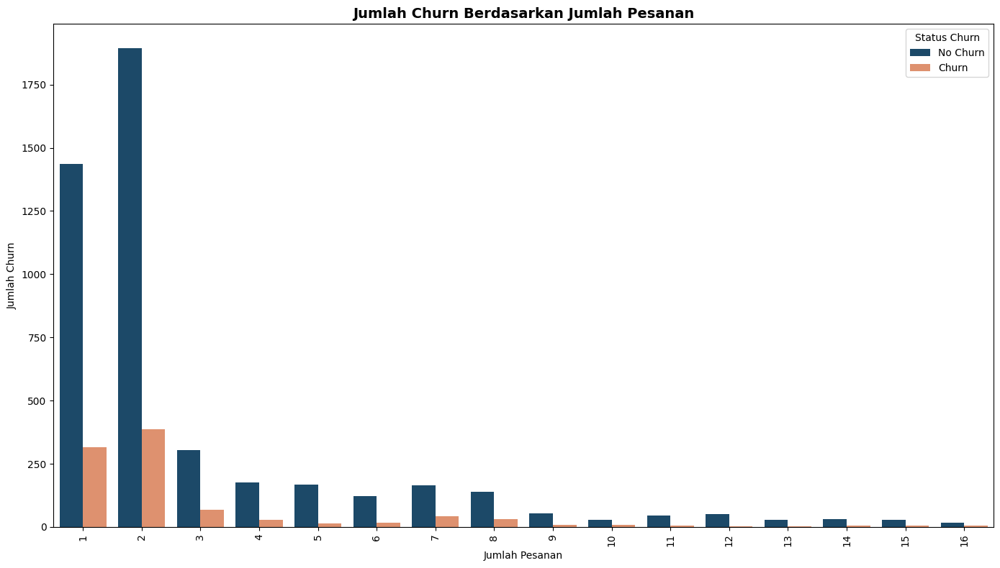

In [163]:
# Mengelompokkan data berdasarkan 'OrderCount' dan menghitung nilai 'Churn'
order_churn_data = df.groupby('OrderCount')['Churn'].value_counts().unstack(fill_value=0)

# Mengatur ukuran figure
plt.figure(figsize=(14, 8))

# Menyusun data
order_churn_data = order_churn_data.reset_index()
order_churn_data.columns = ['OrderCount', 'No Churn', 'Churn']
order_churn_data = order_churn_data.melt(id_vars="OrderCount", var_name="Status Churn", value_name="Jumlah")

# Membuat plot
sns.barplot(data=order_churn_data, x='OrderCount', y='Jumlah', hue='Status Churn', palette=colors)

# Mengatur judul dan label
plt.title("Jumlah Churn Berdasarkan Jumlah Pesanan", fontsize=14, fontweight="bold")
plt.xlabel("Jumlah Pesanan")
plt.ylabel("Jumlah Churn")
plt.xticks(rotation=90)

# Menampilkan plot
plt.legend(title="Status Churn")
plt.tight_layout()
plt.show()

In [164]:
# Menyiapkan data untuk proporsi 100% berdasarkan OrderCount
order_churn_prop = df.groupby('OrderCount')['Churn'].value_counts(normalize=True).unstack(fill_value=0)
order_churn_prop = order_churn_prop.reset_index()
order_churn_prop.columns = ['OrderCount', 'No Churn', 'Churn']

# Membuat visualisasi proporsi 100%
fig = px.bar(
    order_churn_prop, 
    x="OrderCount", 
    y=["No Churn", "Churn"], 
    title="Proporsi Churn Berdasarkan Jumlah Pesanan",
    labels={"value": "Proporsi", "OrderCount": "Jumlah Pesanan", "variable": "Status Churn"}
)

# Menyusun tampilan stack
fig.update_layout(barmode='stack', yaxis=dict(tickformat=".0%"))

# Menampilkan plot
fig.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa jumlah orderan yang banyak, belum menjamin pelanggan tersebut akan tidak churn, begitu juga sebaliknya. **Bisa dilihat dengan proporsi churnnya yang relatif stabil pada range jumlah orderan dari yang sedikit yaitu hanya 1 sampai paling banyak, yaitu 16 orderan sebesar 4-26%.**

</div>

### Hubungan `Churn` dengan `DaySinceLastOrder`

In [165]:
pd.DataFrame(df.groupby('DaySinceLastOrder')['Churn'].value_counts())

count
DaySinceLastOrder Churn       
0.0               0        326
                  1        170
1.0               0        432
                  1        182
2.0               0        670
                  1        122
3.0               0       1023
                  1        184
4.0               0        373
                  1         58
5.0               0        200
                  1         28
6.0               0         97
                  1         16
7.0               0        382
                  1         65
8.0               0        472
                  1         66
9.0               0        271
                  1         28
10.0              0        147
                  1         10
11.0              0         83
                  1          8
12.0              0         67
                  1          2
13.0              0         51
14.0              0         31
                  1          4
15.0              0         15
                  1          4
16.0              0         13
17.0              0         17
18.0              0         10
30.0              0          1
31.0              0          1
46.0              1          1

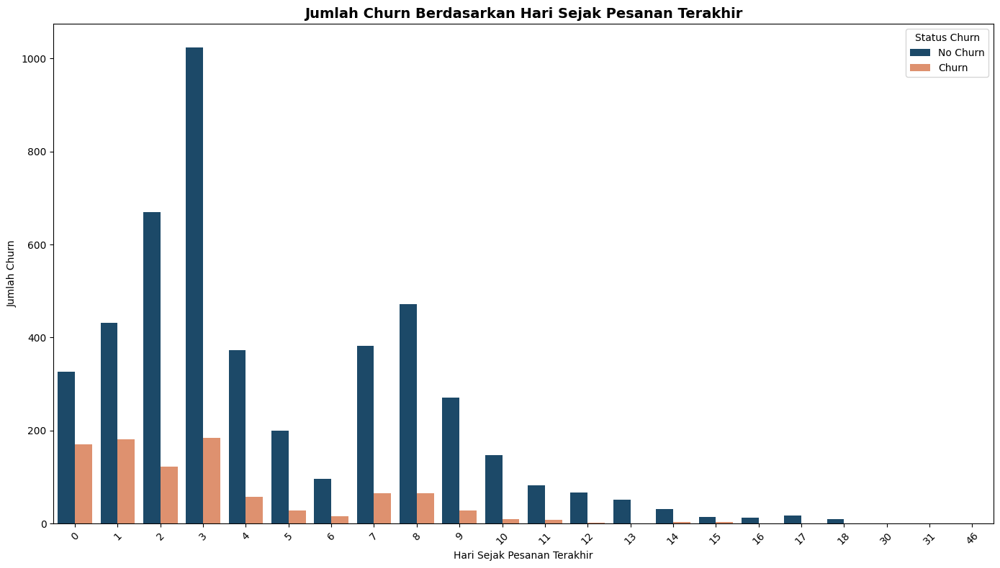

In [166]:
colors = ['#0F4C75', '#F08A5D']

# Mengelompokkan data berdasarkan 'DaySinceLastOrder' dan menghitung nilai 'Churn'
days_churn_data = df.groupby('DaySinceLastOrder')['Churn'].value_counts().unstack(fill_value=0)

days_churn_data = days_churn_data.reset_index()
days_churn_data.columns = ['DaySinceLastOrder', 'No Churn', 'Churn']
days_churn_data = days_churn_data.melt(id_vars="DaySinceLastOrder", var_name="Status Churn", value_name="Jumlah")

days_churn_data['DaySinceLastOrder'] = days_churn_data['DaySinceLastOrder'].astype(int)

# Mengatur ukuran figure
plt.figure(figsize=(14, 8))

# Membuat plot
sns.barplot(data=days_churn_data, x='DaySinceLastOrder', y='Jumlah', hue='Status Churn', palette=colors)

# Mengatur judul dan label
plt.title("Jumlah Churn Berdasarkan Hari Sejak Pesanan Terakhir", fontsize=14, fontweight="bold")
plt.xlabel("Hari Sejak Pesanan Terakhir")
plt.ylabel("Jumlah Churn")
plt.xticks(rotation=45)

# Menampilkan legend dan layout
plt.legend(title="Status Churn")
plt.tight_layout()
plt.show()

In [167]:
# Menghitung jumlah churned dan retained pelanggan untuk setiap hari sejak pemesanan terakhir
daily_churn_proportion = df.groupby(['DaySinceLastOrder', 'Churn']).size().unstack().fillna(0)
daily_churn_proportion.columns = ['Retained', 'Churned']
daily_churn_proportion['Total'] = daily_churn_proportion['Retained'] + daily_churn_proportion['Churned']
daily_churn_proportion['Retained_Proportion'] = daily_churn_proportion['Retained'] / daily_churn_proportion['Total'] * 100
daily_churn_proportion['Churned_Proportion'] = daily_churn_proportion['Churned'] / daily_churn_proportion['Total'] * 100

# Mengubah data menjadi long format
proportional_data_long = daily_churn_proportion.reset_index().melt(
    id_vars='DaySinceLastOrder',
    value_vars=['Retained_Proportion', 'Churned_Proportion'],
    var_name='Churn_Status',
    value_name='Proportion'
)

# Menyesuaikan nama legenda
proportional_data_long['Churn_Status'] = proportional_data_long['Churn_Status'].map({
    'Retained_Proportion': 'No Churn', 'Churned_Proportion': 'Churn'
})

# Membuat stack bar
fig = px.bar(
    proportional_data_long,
    x='DaySinceLastOrder',
    y='Proportion',
    color='Churn_Status',
    title='Proporsi Churn dan Days Since Last Order',
    labels={'DaySinceLastOrder': 'Days Since Last Order', 'Proportion': 'Proportion (%)'}
)

fig.update_layout(barmode='stack', xaxis_title='Days Since Last Order', yaxis_title='Proportion (%)')
fig.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa **proporsi pelanggan yang mempunyai range 0 hari sampai 1 hari mempunyai kecenderungan untuk churn dibandingkan dengan range 2 hari sampai seterusnya.**

**Terjadi penurunan secara signifikan antara proporsi churn dimulai pada 2 hari hingga seterusnya.** Hal ini menunjukkan bahwa pelanggan yang bertahan lebih dari beberapa hari cenderung lebih loyal dan memiliki risiko churn yang lebih rendah dibanding dalam waktu dekat.

Hal ini menjadi penyebab kenapa di hari awal terjadi peningkatan churn yang tinggi:
1. Pelanggan merupakan pelanggan baru yang baru mengenal perusahaan Flipkart, sehingga pembelian hanya bersifat "coba-coba".
2. Pelanggan hanya menggunakan diskon pertamanya saat mendaftar dan setelah itu tidak memakainya lagi alias churn.
3. Mereka sudah beralih ke kompetitor lain karena benefit yang lebih bagus.

**Untuk yang 46 hari sejak terakhir order, terdapat churn sebanyak 1 pelanggan**. Beberapa alasan churn adalah:
1. Pelanggan memang lagi menginginkan produk itu kembali di perusahaan Flipkart, lalu kembali churn.
2. Hanya ingin memanfaatkan voucher yang ada yang diketahui melalui email/notif aplikasi karena diperingatkan untuk membeli kembali dalam rentang waktu tertentu.

</div>

### Hubungan `Churn` dengan `CashbackAmount`

In [168]:
pd.DataFrame(df.groupby('CashbackAmount')['Churn'].value_counts())

,,count
CashbackAmount,Churn,
0.00,0,4
12.00,0,1
25.00,0,4
37.00,0,1
56.00,0,1
81.00,0,1
110.09,1,2
110.51,0,2
110.52,0,2


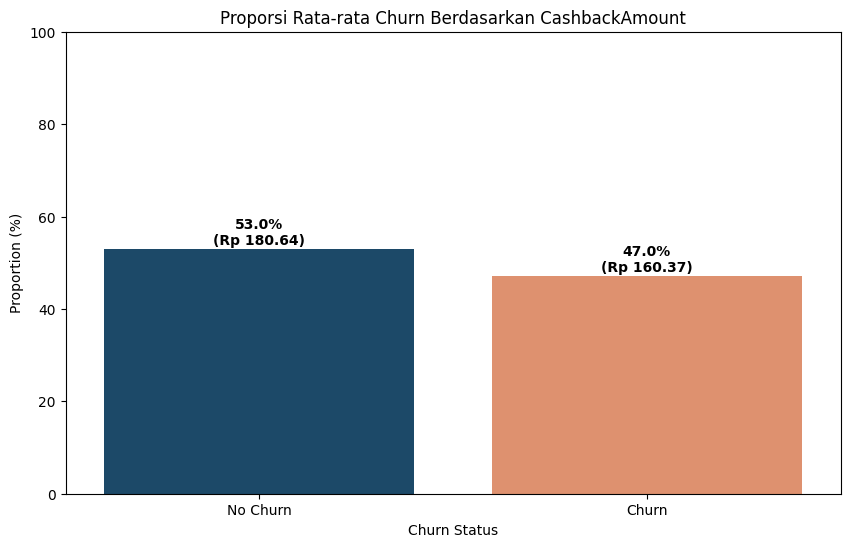

In [169]:
churn_cashback = df.groupby('Churn')['CashbackAmount'].mean().reset_index()
churn_cashback['Proportion'] = (churn_cashback['CashbackAmount'] / churn_cashback['CashbackAmount'].sum()) * 100

colors = ['#0F4C75', '#F08A5D']

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(data=churn_cashback, x='Churn', y='Proportion', palette=colors)

# Tambah labels
for index, row in churn_cashback.iterrows():
    plt.text(row.name, row['Proportion'] + 1, f"{row['Proportion']:.1f}%\n(Rp {row['CashbackAmount']:.2f})", 
             ha='center', color='black', fontweight='bold')

# Titles dan labels
plt.title("Proporsi Rata-rata Churn Berdasarkan CashbackAmount")
plt.xlabel("Churn Status")
plt.ylabel("Proportion (%)")
plt.xticks([0, 1], ["No Churn", "Churn"])
plt.ylim(0, 100)

plt.show()

<div style='text-align: justify'>

Dari hasil visualisasi di atas, kami dapat memberikan insight bahwa rata-rata dari cashback pada churn **sebesar 160 Rupee dan tidak churn sebesar 180 Rupee**. Hal ini mengindikasikan bahwa cashback yang rendah bisa menyebabkan pelanggan churn.

Hal ini disebabkan karena beberapa alasan yang menyebabkan churn:
1. Pelanggan tidak memanfaatkan dengan baik cashback yang tersedia di perusahaan, sehingga tidak merasakan benefit yang diperoleh.
2. Pelanggan beralih ke kompetitor lain karena merasa lebih banyak benefitnya.

</div>

## `Rangkuman Berdasarkan Pemaparan Analisis`

<div style='text-align: justify'>

### **Karakteristik Pelanggan Berdasarkan Demografis dan Geografis**

* Berdasarkan hasil visualisasi `Churn` dengan `Gender`, kami mendapat insight bahwa **proporsi wanita lebih rendah tingkat churnnya sebanyak 16% dibanding dengan pria sebesar 18%.**
* Dari hasil visualiasi `Churn` dengan `MaritalStatus`, kami dapat memberikan insight **bahwa tingkat churn tertinggi ada di pelanggan yang berstatus single sebesar 27%.** Untuk kategori **divorced/cerai** tingkat churn **relatif rendah di angka 15%.** Berbeda halnya dengan kategori yang sudah **married/menikah** yang mempunyai **tingkat churn paling rendah yaitu 12%**.
* Dari hasil visualisasi `Churn` dengan `NumberOfAddress`, kami dapat memberikan insight **bahwa tingkat churn pelanggan untuk range 1 sampai 11 alamat per 1 pelanggan mengalami tingkat fluktuasi bervariasi dari 11% hingga 25%**. Kemudian pada range **19 dan 20 alamat mengalami tingkat churn sampai 100%, dan pelanggan yang mempunyai 21 dan 22 alamat tidak mengalami churn sama sekali.**
* Berdasarkan hasil visualisasi `Churn` dengan `CityTier`, kami dapat memberi insight bahwa tingkat churn terendah pelanggan berada di kawasan yang mempunyai **city tier 1 sebesar 15%. Untuk city tier 2 dan 3 mempunyai tingkat churn yang hampir sama sebesar 20% - 21%.**
* Berdasarkan hasil visualisasi `Churn` dengan `WarehouseToHome`, kami memberi **insight bahwa tingkat churn berbeda-beda berdasarkan jarak antara gudang ke rumah pelanggan dan bersifat fluktuatif berdasarkan tingkat churnnya.** Hal ini tidak dapat dijadikan faktor yang kuat apakah churn bisa dikaitkan dengan jarak antar rumah dengan gudang. Seperti contoh, jarak terjauh yaitu 126 dan 127 km, pelanggan tersebut tidak churn.

### **Karakteristik Pelanggan Berdasarkan Perilaku**

* Berdasarkan hasil visualisasi `Churn` dengan `PreferredLoginDevice`, kami **memberikan insight bahwa pelanggan yang menggunakan mobile phone sebagai pemakaian utama lebih rendah tingkat churnnya sebesar 16% dibandingkan dengan pelanggan yang memakai komputer sebesar 20%.**
* Berdasarkan hasil visualisasi `Churn` dengan `PreferredPaymentMode`, kami mendapat insight bahwa **proporsi churn tertinggi dan jumlah pemakaian yang sangat sedikit ada pada pembayaran Cash On Delivery (COD) sebesar 25%, E-Wallet sebesar 23%, dan UPI 17%.** Lalu yang terakhir pada kartu kredit sebesar 14% dan kartu debit sebesar 15%, memiliki tingkat churn yang paling rendah dan jumlah pemakaian yang terbanyak.
* Berdasarkan hasil visualisasi `Churn` dengan `PreferredOrderCat`, kami dapat memberi insight bahwa **kategori grocery sebesar 5%, memiliki churn rate paling rendah di antara semua kategori.** Untuk kategori others mempunyai tingkat churn sebesar 8%. Untuk kategori laptop dan aksesoris tingkat churn sebesar 10%. Untuk kategori fashion tingkat churn sebesar 16%. Untuk mobile phone memiliki tingkat churn paling tinggi sebesar 27%.
* Berdasarkan hasil visualisasi `Churn` dengan `HourSpendOnApp`, kami dapat memberikan insight bahwa pelanggan dengan **penggunaan aplikasi sebesar 2 sampai 4 jam mengalami tingkat churn yang tinggi yaitu di atas 15%. Sedangkan penggunaan aplikasi 0, 1, dan 5 jam tidak ada tingkat churnnya sebesar 0%.**
* Berdasarkan hasil visualisasi `Churn` dengan `NumberOfDeviceRegistered`, kami dapat memberikan insight bahwa **tingkat churn terendah adalah pelanggan yang mempunyai jumlah perangkat maksimal 2 sebesar 9%.** Jumlah perangkat yang lebih dari 2 mempunyai tingkat churn yang sangat tinggi perbandingannya dibanding pelanggan yang mempunyai jumlah perangkat 1 atau 2, yaitu berkisar antara 15% - 35%.
* Berdasarkan hasil visualisai `Churn` dengan `SatisfactionScore`, kami dapat memberikan insight bahwa **pemberian skor yang kecil belum tentu menyebabkan kenaikan tingkat churn.** Hal ini dapat dilihat bahwa pemberian rating 1 dan 2 memiliki proporsi churn yang sangat rendah yaitu dibawah 13% dibandingkan pemberian rating 3 sampai dengan 5 dengan tingkat churn di atas 17%.
* Dari hasil visualisasi `Churn` dengan `Complain`, kami dapat memberikan insight bahwa pelanggan yang pernah melakukan complain/pengaduan sebelumnya, **cenderung untuk melakukan churn lebih tinggi sebesar 32% dibandingkan pelanggan yang belum pernah melakukan complain sebelumnya sebesar 11%.**

### **Karakteristik Pelanggan Berdasarkan Transaksional**

* Dari visualisasi `Churn` dengan `Tenure`, kami dapat memberikan insight bahwa pelanggan yang mempunyai **tenure 0 sampai 1 bulan mempunyai tingkat churn yang lebih tinggi.** Pada pelanggan yang mempunyai **tenure 2 bulan sampai paling tinggi 61 bulan** di visualisasi, tingkat churn pelanggan cenderung konsisten di angka kurang dari 20. **Khusus untuk bulan ke 9, ada lonjakan kenaikan sebanyak 93 pelanggan yang churn.**
* Dari hasil visualisasi `Churn` dengan `OrderAmountHikeFromLastYear`, kami dapat memberikan insight bahwa proporsi tingkat churn berdasarkan **kenaikan jumlah pesanan dari tahun lalu mengalami fluktuasi naik turun dalam tingkat churn dengan range 6-29%**.
* Dari hasil visualisasi `Churn` dengan `CouponUsed`, k**ami dapat memberikan insight bahwa pada rentang jumlah kupon yang digunakan dari 0 hingga 12, proporsi churn relatif stabil dengan range 11-21%.** Tidak terlihat adanya perubahan signifikan dalam proporsi churn seiring dengan peningkatan jumlah kupon yang digunakan dalam rentang ini. Pada pemakaian kupon 15 dan 16, terdapat cukup signifikan terhadap tingkat churn.
* Dari hasil visualisasi `Churn` dengan `OrderCount`, kami dapat memberikan insight bahwa jumlah orderan yang banyak, belum menjamin pelanggan tersebut akan tidak churn, begitu juga sebaliknya. **Bisa dilihat dengan proporsi churnnya yang relatif stabil pada range jumlah orderan dari yang sedikit yaitu hanya 1 sampai paling banyak, yaitu 16 orderan sebesar 4-26%.**
* Dari hasil visualisasi `Churn` dengan `DaySinceLastOrder`, kami dapat memberikan insight bahwa proporsi pelanggan yang mempunyai **range 0 hari sampai 1 hari mempunyai kecenderungan untuk churn dibandingkan dengan range 2 hari sampai seterusnya.** Terjadi penurunan secara signifikan antara proporsi churn dimulai pada 2 hari hingga seterusnya. **Hal ini menunjukkan bahwa pelanggan yang bertahan lebih dari beberapa hari cenderung lebih loyal dan memiliki risiko churn yang lebih rendah dibanding dalam waktu dekat. Untuk yang 46 hari sejak terakhir order, terdapat churn sebanyak 1 pelanggan.**
* Dari hasil visualisasi `Churn` dengan `CashbackAmount`, kami dapat **memberikan insight bahwa rata-rata dari cashback pada churn sebesar 160 Rupee dan tidak churn sebesar 180 Rupee.** Hal ini mengindikasikan bahwa cashback yang rendah bisa menyebabkan pelanggan churn.

</div>

# **Bagian V. Praproses Dataset untuk Pemodelan**

<div style='text-align: justify'>

Pada proyek ini, bertujuan untuk membangun model klasifikasi yang mampu memprediksi target churn menggunakan pendekatan boosting. Proses pemodelan akan melibatkan serangkaian langkah sistematis, mulai dari praproses data, pembandingan performa model, hingga hyperparameter tuning untuk menghasilkan model terbaik yang mampu memberikan akurasi tinggi.

</div>

## `Persiapan Data Bersih`

In [170]:
# Menampilkan dan membaca dataset yang telah melalui proses pembersihan
df_model = pd.read_excel('e-commerce_churn_cleaned.xlsx')
display(df_model.head(), df_model.tail())
print(f"Jumlah baris dan kolom pada dataset keperluan machine learning: {df_model.shape}")

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferredOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,4,Mobile Phone,3,6,Debit Card,Female,3,3,Laptop & Accessory,2,Single,9,1,11,1,1,5,159.93
1,1,9,Mobile Phone,1,8,UPI,Male,3,4,Mobile Phone,3,Single,7,1,15,0,1,0,120.90
2,1,9,Mobile Phone,1,30,Debit Card,Male,2,4,Mobile Phone,3,Single,6,1,14,0,1,3,120.28
3,1,0,Mobile Phone,3,15,Debit Card,Male,2,4,Laptop & Accessory,5,Single,8,0,23,0,1,3,134.07
4,1,0,Mobile Phone,1,12,Credit Card,Male,3,3,Mobile Phone,5,Single,3,0,11,1,1,3,129.60


,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferredOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
5625,0,10,Computer,1,30,Credit Card,Male,3,2,Laptop & Accessory,1,Married,6,0,18,1,2,4,150.71
5626,0,13,Mobile Phone,1,13,Credit Card,Male,3,5,Fashion,5,Married,6,0,16,1,2,3,224.91
5627,0,1,Mobile Phone,1,11,Debit Card,Male,3,2,Laptop & Accessory,4,Married,3,1,21,1,2,4,186.42
5628,0,23,Computer,3,9,Credit Card,Male,4,5,Laptop & Accessory,4,Married,4,0,15,2,2,9,178.90
5629,0,8,Mobile Phone,1,15,Credit Card,Male,3,2,Laptop & Accessory,3,Married,4,0,13,2,2,3,169.04


Jumlah baris dan kolom pada dataset keperluan machine learning: (5630, 19)


## `Penjelasan Pemilihan Fitur`

In [171]:
# Menampilkan informasi tiap fitur pada dataset dalam bentuk dataframe
list_item = []
for col in df_model.columns:
    list_item.append([col, df_model[col].dtypes, df_model[col].nunique(), df_model[col].sort_values().unique()])

table_desc = pd.DataFrame(list_item, columns=['column_name', 'data_type', 'number_of_unique', 'unique_sample'])
table_desc

,column_name,data_type,number_of_unique,unique_sample
0,Churn,int64,2,"[0, 1]"
1,Tenure,int64,36,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,PreferredLoginDevice,object,2,"[Computer, Mobile Phone]"
3,CityTier,int64,3,"[1, 2, 3]"
4,WarehouseToHome,int64,34,"[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17..."
5,PreferredPaymentMode,object,5,"[Cash on Delivery, Credit Card, Debit Card, E ..."
6,Gender,object,2,"[Female, Male]"
7,HourSpendOnApp,int64,6,"[0, 1, 2, 3, 4, 5]"
8,NumberOfDeviceRegistered,int64,6,"[1, 2, 3, 4, 5, 6]"
9,PreferredOrderCat,object,5,"[Fashion, Grocery, Laptop & Accessory, Mobile ..."


<div style='text-align: justify'>

Untuk memprediksi pelanggan yang berpotensi churn baik saat ini maupun di masa depan, kami memutuskan untuk menggunakan seluruh fitur dalam dataset, kecuali `customerid` yang hanya berfungsi sebagai identifikasi unik. Penggunaan semua fitur ini memungkinkan model untuk menangkap pola perilaku pelanggan dari berbagai aspek, seperti interaksi, preferensi, dan pengalaman mereka dengan layanan. Dengan demikian, model akan mampu mengidentifikasi pola churn secara lebih akurat dan relevan untuk masa kini dan proyeksi di masa mendatang, mendukung strategi proaktif dalam mempertahankan loyalitas pelanggan.

</div>

## `Data Encoding`

<div style='text-align: justify'>

1. **Encoding Kolom `cat_features` (Kategori)**:
   - **Alasan**: Fitur dalam `cat_features` adalah variabel kategori nominal, seperti `PreferredLoginDevice`, `PreferredPaymentMode`, `PreferredOrderCat`, `MaritalStatus`, dan `Gender`. Fitur-fitur ini tidak memiliki urutan atau hirarki antara kategori yang ada. Karena itu, **One-Hot Encoding** digunakan untuk mengonversi kategori-kategori ini menjadi representasi biner yang terpisah, di mana setiap kategori unik diubah menjadi kolom yang diisi dengan nilai 0 atau 1. Dengan pendekatan ini, model dapat membedakan kategori yang berbeda tanpa mengasumsikan adanya peringkat atau urutan tertentu di antara kategori.
   - **Kelebihan One-Hot Encoding**: One-Hot Encoding mencegah model dari penafsiran yang salah terkait bobot atau urutan antar kategori yang bersifat nominal, sehingga meminimalkan risiko bias.

2. **Encoding Kolom `ord_features` (Ordinal)**:
   - **Alasan**: Fitur `ord_features`, seperti `CityTier` dan `SatisfactionScore`, merupakan kategori ordinal yang memiliki urutan atau peringkat alami antar nilai kategorinya. Untuk fitur ordinal, **Ordinal Encoding** dipilih karena encoding ini mempertahankan urutan atau hierarki antar kategori. Sebagai contoh, kategori dalam `CityTier` seperti 1, 2, dan 3 menunjukkan peringkat yang dapat diinterpretasikan oleh model sebagai tingkatan yang naik atau turun dalam suatu hirarki.
   - **Kelebihan Ordinal Encoding**: Dengan menjaga urutan alami, model dapat lebih memahami perbedaan antar kategori berdasarkan peringkat atau tingkatannya. Hal ini memungkinkan model untuk mengenali pola yang mungkin relevan, seperti pengaruh tingkat kota atau skor kepuasan dalam keputusan pelanggan tanpa kehilangan konteks peringkat.

</div>

In [172]:
# Mendefinisikan fitur yang dikategorikan dalam tipe kategorikal
cat_features = ['PreferredLoginDevice', 'PreferredPaymentMode', 
        'PreferredOrderCat', 'MaritalStatus', 'Gender']

# Mendefinisikan fitur yang dikategorikan dalam tipe numerik
num_features = ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 
        'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed', 
        'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']

# Mendefinisikan fitur yang dikategorikan dalam tipe ordinal
ord_features = ['CityTier', 'SatisfactionScore']

In [173]:
# Membuat pipeline preprocessing dengan ColumnTransformer
preprocessing = ColumnTransformer([
        ('onehot', OneHotEncoder(drop='first'), cat_features),
        ('ordinal', OrdinalEncoder(), ord_features),
], remainder='passthrough')

preprocessing

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehot', OneHotEncoder(drop='first'),
                                 ['PreferredLoginDevice',
                                  'PreferredPaymentMode', 'PreferredOrderCat',
                                  'MaritalStatus', 'Gender']),
                                ('ordinal', OrdinalEncoder(),
                                 ['CityTier', 'SatisfactionScore'])])

## `Data Splitting`

<div style='text-align: justify'>

Untuk memisahkan data menjadi *training set* dan *test set*, proses berikut telah dilakukan. Pertama, variabel independen (*features*) disimpan dalam variabel `X` dengan menghilangkan kolom `'Churn'`, sementara kolom `'Churn'` disimpan sebagai variabel target `y`.

Kemudian, data dibagi menjadi data pelatihan dan pengujian dengan menggunakan metode `train_test_split`. Dengan mengatur parameter `test_size=0.2`, 20% dari data digunakan sebagai *test set*, dan sisanya sebagai *training set*. Parameter `stratify=y` digunakan untuk memastikan distribusi variabel target `'Churn'` konsisten antara *training set* dan *test set*. 

</div>

In [174]:
# Memisahkan fitur independen dan variabel target 'Churn'
X = df_model.drop(['Churn'], axis=1)
y = df_model['Churn']

# Membagi dataset menjadi set pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y)

# Menampilkan bentuk dari data pelatihan dan data pengujian
print(f'Bentuk data pelatihan: {X_train.shape} dan bentuk data pengujian: {X_test.shape}')

Bentuk data pelatihan: (4504, 18) dan bentuk data pengujian: (1126, 18)


In [175]:
# Menghitung rasio variabel target pada data pelatihan dan data pengujian
rasio_pelatihan = (y_train.count() - y_train.sum())/y_train.sum()
rasio_pengujian = (y_test.count() - y_test.sum())/y_test.sum()
print(f'Rasio kelas negatif dan positif pada data pelatihan: {rasio_pelatihan:.4f}\n'
      f'Rasio kelas negatif dan positif pada data pengujian: {rasio_pengujian:.4f}')

Rasio kelas negatif dan positif pada data pelatihan: 4.9420
Rasio kelas negatif dan positif pada data pengujian: 4.9263


In [176]:
# Menghitung jumlah kelas negatif dan positif di 'y_train'
counter = Counter(y_train)
N_neg = counter[0]
N_pos = counter[1]

# Menghitung nilai 'scale_pos_weight' sebagai parameter model dalam penanganan ketidakseimbangan data
scale_pos_weight = N_neg/N_pos

print(f'Nilai parameter scale_pos_weight untuk keperluan modelling: {scale_pos_weight:.4f}')

Nilai parameter scale_pos_weight untuk keperluan modelling: 4.9420


In [177]:
X_train_preprocessed = preprocessing.fit_transform(X_train)

# Kolom hasil proses one hot encoding
one_hot_columns = preprocessing.named_transformers_['onehot'].get_feature_names_out()

# Kolom hasil proses ordinal encoding
ordinal_columns = preprocessing.named_transformers_['ordinal'].get_feature_names_out()

# Menggabungkan dan menampilkan semua kolom dalam bentuk dataframe
all_columns = list(one_hot_columns) + list(ordinal_columns) + num_features
X_train_preprocessed_df = pd.DataFrame(X_train_preprocessed, columns=all_columns)
X_train_preprocessed_df

,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,PreferredOrderCat_Grocery,PreferredOrderCat_Laptop & Accessory,PreferredOrderCat_Mobile Phone,PreferredOrderCat_Others,MaritalStatus_Married,...,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.0,2.0,3.0,2.0,0.0,14.0,8.0,9.0,7.0,199.80
1,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,13.0,1.0,3.0,1.0,0.0,17.0,0.0,1.0,2.0,143.02
2,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,15.0,3.0,4.0,10.0,0.0,19.0,0.0,1.0,0.0,165.40
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.0,3.0,3.0,10.0,1.0,19.0,7.0,7.0,7.0,184.46
4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,13.0,4.0,5.0,4.0,0.0,12.0,3.0,8.0,8.0,178.21
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,9.0,2.0,3.0,3.0,0.0,11.0,2.0,2.0,3.0,231.16
6,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,23.0,3.0,3.0,2.0,0.0,12.0,0.0,1.0,8.0,145.58
7,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,7.0,4.0,4.0,3.0,0.0,17.0,1.0,2.0,4.0,173.59
8,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,8.0,3.0,1.0,8.0,0.0,16.0,0.0,1.0,3.0,162.72
9,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,8.0,2.0,3.0,6.0,1.0,11.0,0.0,1.0,2.0,139.44


# **Bagian VI. Pemodelan Machine Learning**

## `Proses Membandingkan Model`

<div style='text-align: justify'>

1. **DecisionTreeClassifier (DTC)**:
   - **Alasan**: Decision tree adalah model dasar yang mudah diinterpretasikan, memungkinkan untuk memahami fitur mana yang paling berpengaruh dalam memprediksi churn. Penggunaan `class_weight='balanced'` membantu mengatasi ketidakseimbangan dengan menyeimbangkan bobot kelas.

2. **ExtraTreesClassifier (ETC)**:
   - **Alasan**: Extra Trees memperkenalkan randomisasi dalam pemilihan split dan lebih robust dibanding decision tree biasa. Dengan `class_weight='balanced'`, model ini dapat menangani ketidakseimbangan kelas dengan lebih baik dan seringkali menghasilkan performa yang baik pada data besar dan variabel yang beragam.

3. **RandomForestClassifier (RFC)**:
   - **Alasan**: Random Forest menawarkan peningkatan performa dari decision tree dengan menggabungkan beberapa pohon, sehingga model lebih stabil dan akurat. `class_weight='balanced'` diatur agar model mempertimbangkan kelas minoritas (churn), meningkatkan akurasi pada kasus ketidakseimbangan data.

4. **AdaBoostClassifier (ADB)**:
   - **Alasan**: AdaBoost adalah model boosting sederhana yang bekerja baik pada data seimbang dan tidak seimbang. Dengan mengadaptasi bobot sampel, algoritma ini lebih fokus pada observasi yang sulit diprediksi, yang seringkali berguna dalam masalah churn di mana kelas churn lebih jarang muncul.

5. **GradientBoostingClassifier (GDB)**:
   - **Alasan**: Gradient Boosting efektif untuk memodelkan hubungan non-linear dan memiliki fleksibilitas untuk menangkap pola kompleks. Model ini cocok untuk data yang bervariasi dengan ketidakseimbangan kelas, namun membutuhkan parameter tambahan untuk mengatasi ketidakseimbangan secara spesifik.

6. **CatBoostClassifier (CAT)**:
   - **Alasan**: CatBoost dapat menangani variabel kategori secara native dan sangat efektif untuk data ketidakseimbangan ketika `scale_pos_weight` diatur, karena mampu menyeimbangkan kontribusi kelas minoritas. Ini membuat CatBoost cocok untuk menangani variabel kategori yang sering ada pada data churn.

7. **XGBClassifier (XGB)**:
   - **Alasan**: XGBoost dikenal karena kinerjanya yang tinggi, terutama dalam menangani data yang tidak seimbang ketika `scale_pos_weight` diatur. Model ini dapat menangkap interaksi antar fitur yang rumit, yang sering muncul pada data churn.

8. **LGBMClassifier (LGB)**:
   - **Alasan**: LightGBM cepat dan efisien pada dataset besar, serta mendukung penanganan kelas tidak seimbang dengan `class_weight='balanced'`. LightGBM menjadi pilihan tepat untuk prediksi churn, terutama ketika terdapat banyak fitur.

9. **LogisticRegression (LGR)**:
   - **Alasan**: Logistic Regression adalah model yang mudah diinterpretasikan dan sering menjadi baseline untuk masalah klasifikasi. Dengan `class_weight='balanced'`, model ini memperhitungkan ketidakseimbangan kelas, dan menjadi referensi baik untuk membandingkan performa dengan model lain yang lebih kompleks.

</div>

In [178]:
# Inisialisasi model klasifikasi dengan parameter untuk penanganan ketidakseimbangan data
DTC = DecisionTreeClassifier(random_state=42, class_weight='balanced')
ETC = ExtraTreesClassifier(random_state=42, class_weight='balanced')
RFC = RandomForestClassifier(random_state=42, class_weight='balanced')
ADB = AdaBoostClassifier(random_state=42)
GDB = GradientBoostingClassifier(random_state=42)
CAT = CatBoostClassifier(random_state=42, scale_pos_weight=scale_pos_weight, verbose=0)
XGB = XGBClassifier(random_state=42, scale_pos_weight=scale_pos_weight, verbose=0)
LGB = LGBMClassifier(random_state=42, class_weight='balanced', verbose=0)
LGR = LogisticRegression(random_state=42, class_weight='balanced')

# Membuat daftar model dan nama model untuk proses perbandingan
models = [('Decision Tree', DTC), ('Extra Tree', ETC), ('Random Forest', RFC),
    ('Adaptive Boost', ADB), ('Gradient Boost', GDB), ('Category Boost', CAT),
    ('Extreme Gradient Boost', XGB), ('Light Gradient Boost', LGB), ('Logistic Regression', LGR)]

<div style='text-align: justify'>

Pertama, dilakukan pengecekan awal dengan membagi data menjadi lima bagian dan menjalankan model berkali-kali pada bagian-bagian tersebut, lalu dicatat nilai rata-rata dan seberapa besar variasi hasilnya. Hal ini dilakukan untuk memastikan bahwa model tidak hanya bagus pada satu set data saja tetapi juga pada bagian lain dari data tersebut. Setelah itu, model terbaik dilatih dengan data penuh dan diuji pada data yang belum pernah dilihat sebelumnya untuk melihat seberapa akurat hasilnya. Hasil akhir dari pengecekan awal dan pengujian terakhir disusun dalam tabel agar mudah dibandingkan dan dilihat mana model yang memberikan hasil paling baik.

</div>

In [179]:
# Inisialisasi Stratified K-Fold untuk validasi silang
skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [180]:
# Membuat custom scorer dengan F2-score
f2_scorer = make_scorer(fbeta_score, beta=2)

# Inisialisasi list kosong dan melakukan looping untuk mengevaluasi setiap model
result = []
for name, model in models:
    if model == LGR:
        estimator = Pipeline([
            ('preprocessing', preprocessing),
            ('scaler', RobustScaler()),
            ('model', model)
        ])
    else:
        estimator = Pipeline([
            ('preprocessing', preprocessing),
            ('model', model)
        ])
    
    model_cv = cross_val_score(
        estimator,
        X_train,
        y_train,
        cv=skfold,
        scoring=f2_scorer,
        error_score='raise'
    )

    result.append({
        'Model': name,
        'Mean F2 Score': model_cv.mean(),
        'Std F2 Score': model_cv.std()
    })

# Membuat dataframe berdasarkan hasil evaluasi model didasarkan pada nilai mean dan standar deviasi
model_df = pd.DataFrame(result).sort_values(by='Mean F2 Score', ascending=False)
model_df

,Model,Mean F2 Score,Std F2 Score
5,Category Boost,0.879204,0.024858
7,Light Gradient Boost,0.874605,0.002592
6,Extreme Gradient Boost,0.864033,0.027066
1,Extra Tree,0.791073,0.031547
2,Random Forest,0.771989,0.060694
0,Decision Tree,0.771204,0.017351
8,Logistic Regression,0.706619,0.033097
4,Gradient Boost,0.644913,0.059705
3,Adaptive Boost,0.598049,0.059794


In [181]:
# Inisialisasi list kosong dan melakukan looping untuk melakukan pengujian pada setiap model
test_result = []
for name, model in models:
    if model == LGR:
        estimator = Pipeline([
            ('preprocessing', preprocessing),
            ('scaler', RobustScaler()),
            ('model', model)
        ])
    else:
        estimator = Pipeline([
            ('preprocessing', preprocessing),
            ('model', model)
        ])

    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    test_score = fbeta_score(y_test, y_pred, beta=2)

    test_result.append({
        'Model': name,
        'Test Score': test_score
    })

# Membuat dataframe berdasarkan hasil pengujian model didasarkan pada nilai test F2-score
test_df = pd.DataFrame(test_result).sort_values(by='Test Score', ascending=False)
test_df

,Model,Test Score
5,Category Boost,0.967413
6,Extreme Gradient Boost,0.966209
7,Light Gradient Boost,0.957011
1,Extra Tree,0.929487
2,Random Forest,0.915418
0,Decision Tree,0.848453
8,Logistic Regression,0.714920
4,Gradient Boost,0.703381
3,Adaptive Boost,0.622271


<div style='text-align: justify'>

Berdasarkan pada output diatas, didapatkan bahwa tiga model terbaik yang akan ditindak lanjuti pada proses resampling adalah `Category Boosting`, `Extreme Gradient Boosting`, dan `Light Gradient Boosting`.

</div>

## `Resampling untuk Ketidakseimbangan Data`

<div style='text-align: justify'>

1. **SMOTE (Synthetic Minority Over-sampling Technique)**: SMOTE menambah data pada kelas minoritas dengan menciptakan sampel baru yang “terletak di antara” sampel-sampel minoritas yang ada. Ini membantu menciptakan variasi baru tanpa hanya mengulang data yang ada.

2. **SMOTEN (Synthetic Minority Over-sampling Technique for Nominal)**: SMOTEN adalah versi SMOTE yang dirancang khusus untuk data kategori (nominal). Teknik ini tidak menginterpolasi nilai seperti pada data kontinu, melainkan meniru kategori dari tetangga terdekat, sehingga lebih cocok untuk data kategorikal.

3. **Random Over Sampler (ROS)**: ROS menyeimbangkan data dengan menyalin sampel kelas minoritas beberapa kali. Meskipun efektif, metode ini dapat menyebabkan overfitting karena data yang sama diulang-ulang.

4. **ADASYN (Adaptive Synthetic Sampling)**: ADASYN lebih adaptif dibandingkan SMOTE karena memberikan perhatian khusus pada sampel minoritas yang sulit dipisahkan dari kelas mayoritas. Dengan demikian, metode ini lebih selektif dalam menciptakan sampel tambahan di area yang memerlukan perhatian lebih.

</div>

In [182]:
# Memilih tiga model terbaik berdasarkan nilai mean dan standar deviasi
CAT = CatBoostClassifier(random_state=42, verbose=0)
XGB = XGBClassifier(random_state=42, verbose=0)
LGB = LGBMClassifier(random_state=42, verbose=0)

In [183]:
# Inisialisasi metode resampling untuk menangani ketidakseimbangan kelas
smote = SMOTE(random_state=42)
smoten = SMOTEN(random_state=42)
ros = RandomOverSampler(random_state=42)
adasyn = ADASYN(random_state=42)

resampler = [('SMOTE', smote), ('SMOTEN', smoten), 
    ('Random Over Sampler', ros), ('ADASYN', adasyn), ('None', None)]

In [184]:
X_train_encoded = preprocessing.fit_transform(X_train)
X_test_encoded = preprocessing.transform(X_test)

# Kolom hasil proses one hot encoding
one_hot_columns = preprocessing.named_transformers_['onehot'].get_feature_names_out()

# Kolom hasil proses ordinal encoding
ordinal_columns = preprocessing.named_transformers_['ordinal'].get_feature_names_out()

# Menggabungkan dan menampilkan semua kolom dalam bentuk dataframe
all_columns = list(one_hot_columns) + list(ordinal_columns) + num_features
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=all_columns)
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=all_columns)

In [185]:
# Fungsi untuk melakukan teknik resampling pada tiga model terbaik
def resampling(model, resampler):
    result = []
    for resample_name, resample_method in resampler:
        skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        estimator = ImbPipeline([
            ('preprocessing', preprocessing),
            ('resample', resample_method if resample_method else None),
            ('model', model)
        ])

        model_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring=f2_scorer)
        result.append({
            'Model': model.__class__.__name__,
            'Resampler': resample_name,
            'Mean F2 Score': model_cv.mean(),
            'Std F2 Score': model_cv.std() 
        })
    
    # Mengonversi hasil teknik resampling menjadi dataframen dan diurutkan berdasarkan mean F2-Score
    resampling_df = pd.DataFrame(result)
    return resampling_df.sort_values(by='Mean F2 Score', ascending=False)

In [186]:
# Memanggil fungsi resampling untuk model Category Boosting
resampling(CAT, resampler)

,Model,Resampler,Mean F2 Score,Std F2 Score
2,CatBoostClassifier,Random Over Sampler,0.875827,0.019602
3,CatBoostClassifier,ADASYN,0.815750,0.032368
0,CatBoostClassifier,SMOTE,0.815409,0.034717
1,CatBoostClassifier,SMOTEN,0.795826,0.041004
4,CatBoostClassifier,None,0.785319,0.040740


In [187]:
# Memanggil fungsi resampling untuk model Extreme Gradient Boosting
resampling(XGB, resampler)

,Model,Resampler,Mean F2 Score,Std F2 Score
2,XGBClassifier,Random Over Sampler,0.872649,0.028244
1,XGBClassifier,SMOTEN,0.836865,0.018871
3,XGBClassifier,ADASYN,0.834835,0.020609
4,XGBClassifier,None,0.831643,0.017693
0,XGBClassifier,SMOTE,0.831371,0.026901


In [188]:
# Memanggil fungsi resampling untuk model Light Gradient Boosting
resampling(LGB, resampler)

,Model,Resampler,Mean F2 Score,Std F2 Score
2,LGBMClassifier,Random Over Sampler,0.874593,0.023052
0,LGBMClassifier,SMOTE,0.811550,0.036363
4,LGBMClassifier,None,0.811449,0.023394
3,LGBMClassifier,ADASYN,0.810445,0.032710
1,LGBMClassifier,SMOTEN,0.783324,0.039728


**Melakukan pengujian pada data test**

In [189]:
# Fungsi untuk mengevaluasi model pada data uji dengan berbagai metode resampling
def eval_resampling(model, resampler):
    test_result = []
    for resampler_name, resampler_method in resampler:
        estimator = ImbPipeline([
            ('preprocessing', preprocessing),
            ('resample', resampler_method if resampler_method else None),
            ('model', model)
        ])

        estimator.fit(X_train, y_train)
        y_pred = estimator.predict(X_test)
        test_score = fbeta_score(y_test, y_pred, beta=2)

        test_result.append({
            'Model': model.__class__.__name__,
            'Resampler': resampler_name,
            'Test Score': test_score
        })

    # Mengonversi hasil evaluasi menjadi dataframe dan mengurutkan berdasarkan Test Score
    eval_resampling_df = pd.DataFrame(test_result)
    return eval_resampling_df.sort_values(by='Test Score', ascending=False)

In [190]:
# Memanggil fungsi evaluasi resampling untuk model Category Boosting
eval_resampling(CAT, resampler)

,Model,Resampler,Test Score
2,CatBoostClassifier,Random Over Sampler,0.981405
0,CatBoostClassifier,SMOTE,0.906183
3,CatBoostClassifier,ADASYN,0.893048
1,CatBoostClassifier,SMOTEN,0.892484
4,CatBoostClassifier,None,0.859459


In [191]:
# Memanggil fungsi evaluasi resampling untuk model Extreme Gradient Boosting
eval_resampling(XGB, resampler)

,Model,Resampler,Test Score
2,XGBClassifier,Random Over Sampler,0.978947
0,XGBClassifier,SMOTE,0.973545
1,XGBClassifier,SMOTEN,0.967403
3,XGBClassifier,ADASYN,0.966209
4,XGBClassifier,None,0.965005


In [192]:
# Memanggil fungsi evaluasi resampling untuk model Light Gradient Boosting
eval_resampling(LGB, resampler)

,Model,Resampler,Test Score
2,LGBMClassifier,Random Over Sampler,0.962539
4,LGBMClassifier,None,0.915868
1,LGBMClassifier,SMOTEN,0.874605
0,LGBMClassifier,SMOTE,0.867457
3,LGBMClassifier,ADASYN,0.858369


<div style='text-align: justify'>

Berdasarkan hasil output diatas, model yang dipilih sebagai model terbaik adalah `Category Boosting` dengan `Random Over Sampler` karena memiliki nilai test score yang tinggi, yaitu 98.14 %. Alasan lain dalam memilih model dan teknik resampling ini, yaitu:
1. **Random Over Sampler (ROS)**: ROS bekerja dengan menyeimbangkan jumlah data pada kelas minoritas dengan menduplikasi data yang sudah ada. Ini membuat model lebih peka terhadap pola pada pelanggan yang mungkin churn tanpa menambah kompleksitas data, sehingga tetap sederhana namun efektif.

2. **Category Boosting**: CatBoost adalah model yang sangat baik dalam menangani data kategori, yang umum dalam e-commerce seperti tipe produk atau preferensi pelanggan. Model ini juga bagus dalam menghindari overfitting meskipun ada data duplikasi dari ROS, sehingga model bisa lebih akurat dalam memprediksi pelanggan yang akan churn tanpa menjadi terlalu terpaku pada pola tertentu. 

</div>

**Pemilihan model terbaik sebelum tuning**

In [193]:
# Inisialisasi model dan resampling terbaik yang dipilih unutk proses tuning
best_model = CatBoostClassifier(random_state=42, verbose=0)
best_resampler = RandomOverSampler(random_state=42)

In [194]:
# Membuat pipeline untuk tuning model dengan preprocessing, resampling, dan model terbaik
tuning_estimator = ImbPipeline([
    ('preprocessing', preprocessing),
    ('resample', best_resampler),
    ('model', best_model)
])

tuning_estimator.fit(X_train, y_train)

# Membuat prediksi pada data pelatihan dan data pengujian
y_pred_train = tuning_estimator.predict(X_train)
y_pred_test = tuning_estimator.predict(X_test)

before_tuning_train = classification_report(y_train, y_pred_train)
before_tuning_test = classification_report(y_test, y_pred_test)

# Menampilkan laporan klasifikasi untuk data pelatihan dan pengujian
print('Laporan klasifikasi data pelatihan: \n', before_tuning_train)
print('Laporan klasifikasi data pengujian: \n', before_tuning_test)

Laporan klasifikasi data pelatihan: 
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      3746
           1       0.97      1.00      0.99       758

    accuracy                           1.00      4504
   macro avg       0.99      1.00      0.99      4504
weighted avg       1.00      1.00      1.00      4504

Laporan klasifikasi data pengujian: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       936
           1       0.91      1.00      0.95       190

    accuracy                           0.98      1126
   macro avg       0.96      0.99      0.97      1126
weighted avg       0.99      0.98      0.98      1126



## `Hyperparameter Tuning`

<div style='text-align: justify'>

1. **`model__iterations`**:
   - Menentukan jumlah pohon yang digunakan. Jumlah yang lebih tinggi memungkinkan model lebih mendalam dalam belajar, namun bisa menyebabkan overfitting jika terlalu tinggi.

2. **`model__learning_rate`**:
   - Mengontrol kecepatan model dalam belajar. Learning rate rendah membuat model belajar lebih pelan dan stabil, sementara rate tinggi mempercepat pelatihan, tetapi berisiko overfitting.

3. **`model__depth`**:
   - Kedalaman maksimal pohon keputusan. Kedalaman yang lebih besar memungkinkan model menangkap pola kompleks, namun terlalu dalam bisa menyebabkan overfitting.

4. **`model__l2_leaf_reg`**:
   - Regularisasi untuk mencegah model menjadi terlalu kompleks. Nilai yang lebih tinggi mengurangi overfitting, sementara nilai rendah memungkinkan model menangkap lebih banyak detail.

5. **`model__random_strength`**:
   - Mengatur tingkat randomisasi, terutama untuk variabel kategori, agar model tidak terlalu “menghafal” data pelatihan, membantu mengurangi overfitting.

6. **`model__scale_pos_weight`**:
   - Menyesuaikan bobot kelas positif (churn) dalam data yang tidak seimbang, sehingga model lebih adil dalam memprediksi kelas minoritas (churn) dan mengurangi bias terhadap kelas mayoritas.

</div>

In [195]:
skfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
f2_scorer = make_scorer(fbeta_score, beta=2)

# Mendefinisikan ruang hyperparameter untuk model CatBoost
hyperparam_space = {
    'model__iterations': [100, 200, 300],
    'model__learning_rate': [0.01, 0.03, 0.05, 0.1, 0.2],
    'model__depth': [4, 6, 8],
    'model__l2_leaf_reg': [1, 3, 5, 7, 9],
    'model__random_strength': [1, 5, 10, 15],
    'model__scale_pos_weight': [1, 3, 5, 10]
}

# Menginisialisasi RandomizedSearchCV untuk tuning hyperparameter model CatBoost
catboost_tuning = RandomizedSearchCV(
    estimator=tuning_estimator,
    param_distributions=hyperparam_space,
    cv=skfold,
    scoring=f2_scorer,
    n_iter=500,
    random_state=42,
    n_jobs=-1,
    error_score='raise'
)

# Melatih model dengan hyperparameter yang di-tuning pada data pelatihan
catboost_tuning.fit(X_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   error_score='raise',
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('onehot',
                                                                               OneHotEncoder(drop='first'),
                                                                               ['PreferredLoginDevice',
                                                                                'PreferredPaymentMode',
                                                                                'PreferredOrderCat',
                                                                                'MaritalStatus',
                                                                                'Gender']),
                                                                              ('ordinal',
                                                                               OrdinalEn...
                                              <catboost.core.CatBoostClassifier object at 0x000001EEA05A2C60>)]),
                   n_iter=500, n_jobs=-1,
                   param_distributions={'model__depth': [4, 6, 8],
                                        'model__iterations': [100, 200, 300],
                                        'model__l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'model__learning_rate': [0.01, 0.03,
                                                                 0.05, 0.1,
                                                                 0.2],
                                        'model__random_strength': [1, 5, 10,
                                                                   15],
                                        'model__scale_pos_weight': [1, 3, 5,
                                                                    10]},
                   random_state=42,
                   scoring=make_scorer(fbeta_score, response_method='predict', beta=2))

In [196]:
print('Skor terbaik:', catboost_tuning.best_score_)
print('Parameter terbaik:', catboost_tuning.best_params_)

Skor terbaik: 0.9065719958964105
Parameter terbaik: {'model__scale_pos_weight': 5, 'model__random_strength': 1, 'model__learning_rate': 0.1, 'model__l2_leaf_reg': 1, 'model__iterations': 300, 'model__depth': 8}


# **Bagian VII. Pertimbangan Terhadap Pemodelan**

## `Penjelasan Model`

<div style='text-align: justify'>

### **Cara Kerja CatBoost:**
CatBoost (Categorical Boosting) adalah algoritma boosting berbasis pohon yang dikembangkan oleh Yandex. CatBoost sangat efektif dalam menangani data yang mengandung variabel kategori dan memiliki beberapa keunggulan, terutama dalam hal mengurangi overfitting dan menangani data kategori secara native. Berikut adalah penjelasan tentang cara kerja CatBoost:
1. **Boosting Berbasis Gradient**:
   CatBoost adalah varian dari algoritma gradient boosting decision tree (GBDT). Pada setiap iterasi, model membangun pohon keputusan baru untuk memperbaiki kesalahan dari pohon sebelumnya, dengan mengurangi residual error.
2. **Pemrosesan Variabel Kategori**:
   CatBoost memiliki kemampuan unik dalam menangani variabel kategori secara native tanpa perlu one-hot encoding atau encoding lainnya. Algoritma ini menggunakan skema khusus yang disebut "ordered boosting" untuk mengonversi variabel kategori menjadi representasi numerik, sehingga mengurangi risiko overfitting pada data pelatihan.
3. **Ordered Boosting**:
   Ordered boosting adalah metode khusus dalam CatBoost untuk menghindari data leakage pada proses pelatihan. Alih-alih menggunakan keseluruhan data pelatihan untuk membuat pohon baru, CatBoost membagi data ke dalam urutan yang hanya menggunakan informasi dari observasi sebelumnya, bukan dari observasi berikutnya. Pendekatan ini mengurangi bias dan overfitting.
4. **Oblivious Trees**:
   CatBoost menggunakan jenis pohon keputusan yang disebut "oblivious tree" (pohon simetris), di mana setiap pohon menggunakan aturan splitting yang sama di semua cabang pada level yang sama. Struktur ini membuat prediksi lebih cepat, memungkinkan parallelization yang lebih efisien, dan menghasilkan model yang lebih stabil.
5. **Efisiensi Komputasi**:
   CatBoost juga terkenal dengan kecepatan pelatihannya, terutama ketika berhadapan dengan data kategori dalam jumlah besar. Optimisasi internal dan implementasi GPU membuatnya lebih efisien dibandingkan GBDT klasik.

### **Alasan Pemilihan CatBoost:**
1. **Penanganan Data Kategori yang Efektif**:
   E-commerce sering kali memiliki banyak fitur kategori seperti ID pengguna, kategori produk, sumber lalu lintas, metode pembayaran, dll. CatBoost sangat efektif untuk data semacam ini karena menangani data kategori secara langsung tanpa perlu one-hot encoding, yang biasanya dapat memperbesar dimensi data dan meningkatkan kompleksitas model.
2. **Mengurangi Overfitting**:
   Dalam masalah prediksi churn, overfitting bisa menjadi masalah, terutama jika data pelanggan sangat beragam. Dengan ordered boosting dan oblivious trees, CatBoost lebih sedikit mengalami overfitting dibandingkan algoritma boosting lainnya. Hal ini menjadikannya cocok untuk menangani churn, yang sering kali memiliki label data yang tidak seimbang.
3. **Akurasi Tinggi dan Efisiensi Waktu Pelatihan**:
   Dalam industri e-commerce, akurasi prediksi churn sangat penting untuk menjaga retensi pelanggan. CatBoost mampu memberikan hasil yang sangat akurat dalam waktu yang relatif singkat, terutama bila menggunakan GPU. Ini membantu tim data science atau analis untuk membangun dan menguji model lebih cepat, serta memungkinkan eksperimen lebih lanjut.
4. **Kemampuan Memodelkan Interaksi Kompleks**:
   Churn sering kali dipengaruhi oleh berbagai faktor yang saling terkait, seperti riwayat pembelian, pola interaksi, atau preferensi pengguna. CatBoost, melalui boosting iteratif dan tekniknya yang unik, mampu memodelkan interaksi kompleks ini dengan baik, menghasilkan prediksi churn yang lebih akurat.
5. **Stabilitas dan Interpretabilitas**:
   CatBoost menghasilkan model yang lebih stabil dan dapat diinterpretasikan dengan fitur seperti Feature Importance untuk mengukur pengaruh tiap variabel terhadap keputusan prediktif.

</div>

In [197]:
# Mengambil estimator terbaik dari hasil tuning hyperparameter CatBoost
catboost = catboost_tuning.best_estimator_

catboost.fit(X_train, y_train)

y_pred_train_tune = catboost.predict(X_train)
y_pred_test_tune = catboost.predict(X_test)

# Menampilkan estimator CatBoost terbaik setelah tuning
print('Estimator catboost terbaik:', catboost)

Estimator catboost terbaik: Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['PreferredLoginDevice',
                                                   'PreferredPaymentMode',
                                                   'PreferredOrderCat',
                                                   'MaritalStatus', 'Gender']),
                                                 ('ordinal', OrdinalEncoder(),
                                                  ['CityTier',
                                                   'SatisfactionScore'])])),
                ('resample', RandomOverSampler(random_state=42)),
                ('model',
                 <catboost.core.CatBoostClassifier object at 0x000001EE92D8F590>)])


## `Laporan Model Sebelum dan Sesudah Tuning`

In [198]:
# Menghitung skor F2 (Training) sebelum dan sesudah tuning
before_tuning = fbeta_score(y_train, y_pred_train, beta=2)
after_tuning = fbeta_score(y_train, y_pred_train_tune, beta=2)

# Menampilkan skor F2 (Training) sebelum dan sesudah tuning
print('Skor F2 sebelum tuning pada training: \n', before_tuning)
print('Skor F2 setelah tuning pada training: \n', after_tuning)

Skor F2 sebelum tuning pada training: 
 0.9942287513116475
Skor F2 setelah tuning pada training: 
 0.9994725738396625


In [199]:
# Menghitung skor F2 (Testing) sebelum dan sesudah tuning
score_before_tuning = fbeta_score(y_test, y_pred_test, beta=2)
score_after_tuning = fbeta_score(y_test, y_pred_test_tune, beta=2)

# Menampilkan skor F2 (Testing) sebelum dan sesudah tuning
print('Skor F2 sebelum tuning pada testing: \n', score_before_tuning)
print('Skor F2 setelah tuning pada testing: \n', score_after_tuning)

Skor F2 sebelum tuning pada testing: 
 0.981404958677686
Skor F2 setelah tuning pada testing: 
 0.9801876955161627


In [200]:
# Membuat laporan klasifikasi sebelum dan sesudah tuning
report_before_tuning = classification_report(y_test, y_pred_test)
report_after_tuning = classification_report(y_test, y_pred_test_tune)

# Menampilkan laporan klasifikasi sebelum dan sesudah tuning
print('Laporan klasifikasi sebelum tuning: \n', report_before_tuning)
print('Laporan klasifikasi setelah tuning: \n', report_after_tuning)

Laporan klasifikasi sebelum tuning: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       936
           1       0.91      1.00      0.95       190

    accuracy                           0.98      1126
   macro avg       0.96      0.99      0.97      1126
weighted avg       0.99      0.98      0.98      1126

Laporan klasifikasi setelah tuning: 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99       936
           1       0.94      0.99      0.97       190

    accuracy                           0.99      1126
   macro avg       0.97      0.99      0.98      1126
weighted avg       0.99      0.99      0.99      1126



## `Laporan Confusion Matrix Sebelum dan Sesudah Tuning`

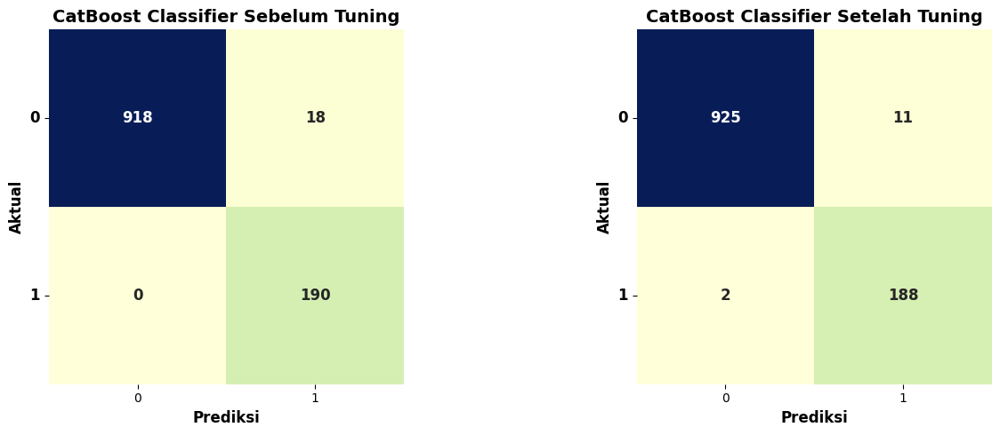

In [201]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt='d', cmap='YlGnBu', square=True, 
            annot_kws={"size": 12, "weight": "bold"}, cbar=False)
plt.xlabel('Prediksi', fontsize=12, fontweight='bold')
plt.ylabel('Aktual', fontsize=12, fontweight='bold')
plt.title('CatBoost Classifier Sebelum Tuning', fontsize=14, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold', rotation=0)

plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, y_pred_test_tune), annot=True, fmt='d', cmap='YlGnBu', square=True, 
            annot_kws={"size": 12, "weight": "bold"}, cbar=False)
plt.xlabel('Prediksi', fontsize=12, fontweight='bold')
plt.ylabel('Aktual', fontsize=12, fontweight='bold')
plt.title('CatBoost Classifier Setelah Tuning', fontsize=14, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold', rotation=0)

plt.tight_layout()
plt.show()

<div style='text-align: justify'>

Confusion matrix sebelum dan setelah tuning. Matriks kebingungan ini menggambarkan performa model dalam mengklasifikasikan dua kategori (0 dan 1), yang mungkin merujuk pada prediksi churn (1) dan non-churn (0).

1. **Sebelum Tuning**: 
   - Model mampu mengklasifikasikan 918 sampel kelas 0 dengan benar (True Negative) dan 190 sampel kelas 1 dengan benar (True Positive).
   - Ada 18 sampel kelas 0 yang salah diklasifikasikan sebagai kelas 1 (False Positive) dan tidak ada sampel kelas 1 yang salah diklasifikasikan sebagai kelas 0 (False Negative).
   
2. **Setelah Tuning**: 
   - Setelah dilakukan tuning, model mengalami peningkatan performa. True Negative meningkat menjadi 925 dan True Positive sedikit berkurang menjadi 188.
   - False Positive berkurang dari 18 menjadi 11, menunjukkan pengurangan kesalahan klasifikasi untuk kelas 0.
   - False Negative bertambah sedikit menjadi 2, namun perubahan ini tidak signifikan.

Secara keseluruhan, tuning model meningkatkan akurasi klasifikasi kelas 0 (non-churn), dengan mengurangi jumlah kesalahan prediksi pada kelas ini. Meskipun ada sedikit peningkatan pada False Negative setelah tuning, model secara keseluruhan menjadi lebih akurat dan seimbang dalam mendeteksi churn dan non-churn. Ini menunjukkan bahwa tuning memberikan dampak positif dalam meminimalkan kesalahan pada kelas yang lebih dominan (kelas 0), yang relevan dalam banyak kasus bisnis di mana menjaga pelanggan (non-churn) menjadi prioritas utama.

</div>

## `Laporan Skor ROC-AUC`

ROC AUC: 0.9903846153846153


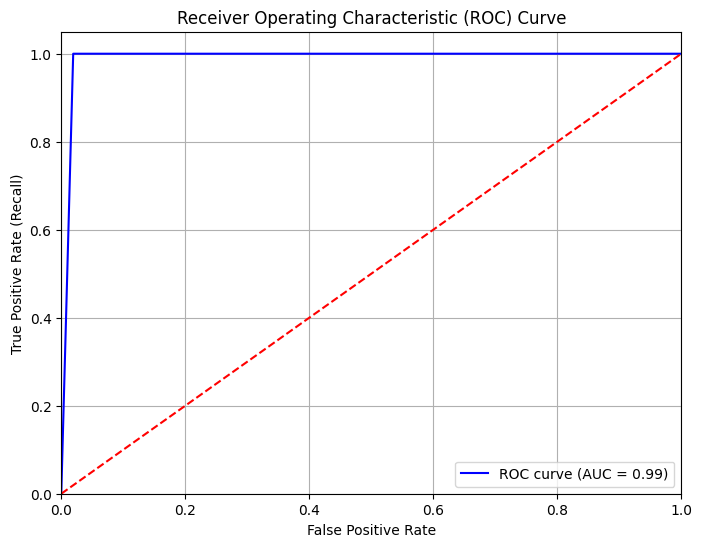

In [202]:
from sklearn.metrics import (roc_auc_score, roc_curve)

# Menghitung ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred_test)
print("ROC AUC:", roc_auc)

# Menghitung dan Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0,1], [0,1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid()
plt.show()

## `Penyimpanan Model`

In [203]:
# Melatih model CatBoost pada seluruh dataset (X dan y)
catboost.fit(X, y)

# Menyimpan model CatBoost yang telah dilatih ke dalam file dengan format .sav
file_name = 'ecommerce_churn_catboost.sav'
pickle.dump(catboost, open(file_name, 'wb'))

# **Bagian VIII. Pemaparan Analisis pada Model Terbaik**

## `Feature Importance`

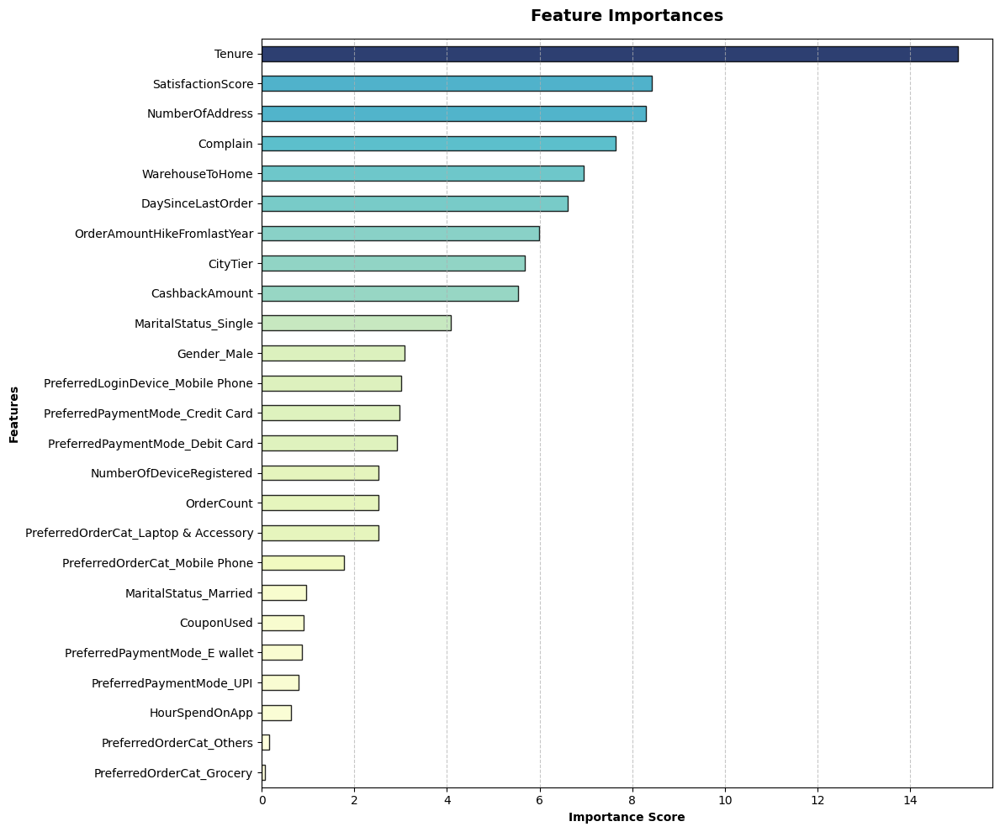

In [208]:
# Sortir feature importances dan plot
coef1 = pd.Series(catboost['model'].feature_importances_, index=preprocessing.get_feature_names_out()).sort_values(ascending=True)

# Menghapus prefix seperti 'remainder__' dan 'onehot__'
coef1.index = coef1.index.str.replace(r'^remainder__|^onehot__|^ordinal__', '', regex=True)

# Mempersiapkan colormap
norm = plt.Normalize(vmin=coef1.min(), vmax=coef1.max())
colors = cm.YlGnBu(norm(coef1.values))

plt.figure(figsize=(12, 10))
coef1.plot(kind='barh', color=colors, edgecolor='black', alpha=0.85)

# Menambahkan judul dan label
plt.title('Feature Importances', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Importance Score', fontsize=10, fontweight='bold')
plt.ylabel('Features', fontsize=10, fontweight='bold')

# Menambahkan grid di background
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Mengatur tampilan layout
plt.tight_layout()
plt.show()

<div style='text-align: justify'>

1. **Fitur dengan Importance Score Tertinggi**
   - **Tenure** memiliki importance score tertinggi, yaitu **15.02**. Ini menunjukkan bahwa durasi penggunaan layanan sangat dominan dalam menentukan prediksi model, menjadikannya fitur yang sangat esensial dibandingkan fitur lainnya.
   
2. **Fitur-Fitur Penting Lainnya**
   - Beberapa fitur lain dengan importance score yang tinggi antara lain:
     - **SatisfactionScore** dengan nilai **8.42**: Menunjukkan bahwa tingkat kepuasan pengguna juga menjadi faktor penting dalam memengaruhi hasil prediksi model.
     - **NumberOfAddress** dengan nilai **8.30**: Indikator jumlah alamat pengguna yang tercatat juga memengaruhi model, menempati posisi ketiga dalam skala kepentingan.
     - **Complain** dengan score **7.65**: Jumlah komplain yang dilakukan pengguna turut memengaruhi prediksi model, mengindikasikan relevansi keluhan pengguna dalam analisis model.
   - Nilai importance yang relatif tinggi pada fitur-fitur ini mengindikasikan kontribusi signifikan dalam performa prediksi model.

3. **Fitur dengan Importance Score Sedang**
   - Fitur-fitur dengan importance score antara **5 hingga 7** seperti:
     - **WarehouseToHome (6.95)** dan **remainder__DaySinceLastOrder (6.60)** menggambarkan perilaku dan preferensi pengguna dalam aspek logistik dan frekuensi pembelian.
     - **OrderAmountHikeFromLastYear (5.99)** dan **ordinal__CityTier (5.68)** memberikan gambaran tentang peningkatan nilai pesanan dari tahun sebelumnya dan klasifikasi kota pengguna.
   - Importance score yang sedang menunjukkan bahwa meskipun kontribusi fitur-fitur ini tidak sebesar Tenure atau SatisfactionScore, fitur-fitur ini tetap memberikan informasi yang berharga dalam prediksi.

4. **Fitur dengan Importance Score Rendah**
   - Fitur-fitur seperti **PreferredOrderCat_Grocery (0.07)** dan **PreferredOrderCat_Others (0.16)** memiliki importance score yang rendah, menunjukkan kontribusi yang minimal terhadap hasil prediksi model.
   - Beberapa fitur lain dengan importance score yang rendah, seperti **HourSpendOnApp (0.64)** dan **PreferredPaymentMode_UPI (0.79)**, memberikan sedikit pengaruh dalam akurasi model. Hal ini dapat diartikan bahwa fitur-fitur ini tidak terlalu signifikan dalam konteks model yang digunakan.

</div>

## `Prediction Probability`

In [206]:
with open('ecommerce_churn_catboost.sav', 'rb') as file:
    model = pickle.load(file)

def prepare_input_data(preferred_login_device, preferred_payment_mode, preferred_order_cat, 
                       marital_status, gender, tenure, warehouse_to_home, hour_spend_on_app, 
                       number_of_device_registered, number_of_address, complain, 
                       order_amount_hike_from_last_year, coupon_used, order_count, 
                       day_since_last_order, cashback_amount, city_tier, satisfaction_score):
    
    input_data = pd.DataFrame({
        'PreferredLoginDevice': [preferred_login_device],
        'PreferredPaymentMode': [preferred_payment_mode],
        'PreferredOrderCat': [preferred_order_cat],
        'MaritalStatus': [marital_status],
        'Gender': [gender],
        'Tenure': [tenure],
        'WarehouseToHome': [warehouse_to_home],
        'HourSpendOnApp': [hour_spend_on_app],
        'NumberOfDeviceRegistered': [number_of_device_registered],
        'NumberOfAddress': [number_of_address],
        'Complain': [complain],
        'OrderAmountHikeFromlastYear': [order_amount_hike_from_last_year],
        'CouponUsed': [coupon_used],
        'OrderCount': [order_count],
        'DaySinceLastOrder': [day_since_last_order],
        'CashbackAmount': [cashback_amount],
        'CityTier': [city_tier],
        'SatisfactionScore': [satisfaction_score]
    })
    
    return input_data

def predict_churn(input_data):
    prediction = model.predict_proba(input_data)[0][1]
    return prediction

preferred_login_device = 'Mobile Phone'
preferred_payment_mode = 'Credit Card'
preferred_order_cat = 'Fashion'
marital_status = 'Single'
gender = 'Male'
tenure = 24
warehouse_to_home = 15
hour_spend_on_app = 2
number_of_device_registered = 3
number_of_address = 1
complain = 0
order_amount_hike_from_last_year = 12
coupon_used = 2
order_count = 30
day_since_last_order = 10
cashback_amount = 110.0
city_tier = 1
satisfaction_score = 4

input_data = prepare_input_data(preferred_login_device, preferred_payment_mode, preferred_order_cat, 
                                marital_status, gender, tenure, warehouse_to_home, hour_spend_on_app, 
                                number_of_device_registered, number_of_address, complain, 
                                order_amount_hike_from_last_year, coupon_used, order_count, 
                                day_since_last_order, cashback_amount, city_tier, satisfaction_score)

churn_probability = predict_churn(input_data)

print(f"Churn Probability: {churn_probability:.2%}")

Churn Probability: 0.18%


## `Perhitungan Bisnis`

<div style='text-align: justify'>

### **Analisis Kerugian Model Prediksi Churn di India**

Untuk memahami dampak finansial dari kesalahan prediksi churn di pasar India, kita menganalisis tiga komponen utama: **Customer Spending per Month (CSPM)**, **Customer Acquisition Cost (CAC)**, dan **Customer Retention Cost (CRC)**. Berikut adalah perhitungannya berdasarkan data terkini.

**1. Customer Spending per Month (CSPM)**  
Pengeluaran rata-rata bulanan per pelanggan adalah **₹17.550**.

**2. Customer Acquisition Cost (CAC)**  
Biaya akuisisi pelanggan baru di India diperkirakan sebesar **₹6.500** per pelanggan.

**3. Customer Retention Cost (CRC)**  
Untuk retensi, yaitu **₹4.000** per pelanggan.

### **Kesimpulan Bisnis**

Kesalahan prediksi churn dapat menyebabkan:
- **CRC sebesar ₹4.000 per pelanggan** yang hilang.
- **CAC sebesar ₹6.500 per pelanggan** jika akuisisi pelanggan terganggu.

Dengan analisis ini, perusahaan dapat meminimalkan risiko kerugian dengan meningkatkan akurasi prediksi dan mengoptimalkan strategi retensi dan alokasi anggaran untuk meningkatkan efisiensi operasional.

</div>

<div style='text-align: justify'>

### **Perbandingan Pengeluaran Perusahaan dengan dan tanpa Model Prediksi Churn**

Analisis ini membandingkan biaya perusahaan dalam dua skenario berbeda terkait churn pelanggan: skenario tanpa prediksi churn (dianggap semua pelanggan churn) dan skenario dengan model prediksi churn berbasis machine learning.

- **Total Pelanggan:** 1.126
- **Confusion Matrix:**
  - **True Negative (TN):** 925
  - **True Positive (TP):** 188
  - **False Negative (FN):** 2
  - **False Positive (FP):** 11
- **Biaya**:
  - **CSPM (Customer Spending per Month):** 17.550 rupee
  - **CAC (Customer Acquisition Cost):** 6.500 rupee
  - **CRC (Customer Retention Cost):** 4.000 rupee

**1. Skenario Pertama: Asumsi Semua Pelanggan Churn**

Tanpa model prediksi, perusahaan menganggap semua 1.126 pelanggan akan churn:

- **Biaya Retensi Semua Pelanggan**  
  CRC x Total Pelanggan = ₹4.000 x 1.126 = ₹4.504.000

- **Biaya Akuisisi 1.126 Pelanggan Baru**  
  CAC x Total Pelanggan = ₹6.500 x 1.126 = ₹7.319.000

- **Total Pengeluaran Perusahaan Tanpa Model**  
  ₹11.823.000

**2. Skenario Kedua: Implementasi Model Prediksi**

Dengan model prediksi churn, perusahaan dapat mengidentifikasi pelanggan yang berpotensi churn:

- **Pelanggan yang Diprediksi Churn**  
  TP + FP = 199

- **Pelanggan yang Diprediksi Tidak Churn**  
  TN + FN = 927

- **Biaya Retensi untuk Pelanggan yang Diprediksi Churn**  
  CRC x 199 = ₹4.000 x 199 = ₹796.000

- **Biaya Akuisisi untuk 199 Pelanggan Baru**  
  CAC x 199 = ₹6.500 x 199 = ₹1.293.500

- **Kerugian Akibat Pelanggan yang Tidak Terantisipasi Churn (False Negative)**  
  CSPM x 2 = ₹17.550 x 2 = ₹35.100

- **Total Pengeluaran Perusahaan dengan Model**  
  ₹2.124.600

### **Penghematan Biaya**

- **Total Biaya Tanpa Model:** ₹11.823.000
- **Total Biaya dengan Model:** ₹2.124.600
- **Penghematan:**  
  ₹9.698.400 (≈82% penghematan)

| **Skenario**                    | **Total Biaya (rupee)** |
|---------------------------------|-------------------------|
| **Tanpa Model**                 | 11.823.000              |
| **Dengan Model**                | 2.124.600               |
| **Penghematan**                 | 9.698.400               |

Implementasi model machine learning signifikan dalam mengurangi biaya retensi dan akuisisi pelanggan baru serta meminimalkan kerugian akibat churn yang tidak terdeteksi.

</div>

## `Rangkuman Berdasarkan Pemaparan Machine Learning`

<div style='text-align: justify'>

Model CatBoost yang telah diimplementasikan menunjukkan peningkatan performa setelah dilakukan tuning. Berdasarkan laporan klasifikasi, akurasi model meningkat dari 0,98 menjadi 0,99, sementara f2-score, yang lebih berfokus pada recall, juga mengalami peningkatan. Sebelum tuning, precision kelas minoritas (label 1) berada di angka 0,91 dengan recall 1,00, sedangkan setelah tuning, precision meningkat menjadi 0,94 dan recall tetap stabil di 0,99. Hal ini mengindikasikan bahwa model tidak hanya meningkatkan kemampuannya dalam mengidentifikasi semua sampel dari kelas minoritas, tetapi juga mengurangi false positives, menghasilkan keseimbangan yang lebih baik antara recall dan precision.

Confusion matrix menunjukkan pengurangan jumlah kesalahan prediksi setelah tuning. Sebelum tuning, terdapat 18 sampel kelas 0 yang salah diklasifikasikan sebagai kelas 1 dan tidak ada kesalahan pada kelas 1. Setelah tuning, kesalahan pada kelas 0 berkurang menjadi 11, sementara kesalahan pada kelas 1 meningkat sedikit menjadi 2. Hal ini menunjukkan bahwa tuning tidak hanya berhasil mengurangi kesalahan pada kelas mayoritas, tetapi juga tetap mempertahankan performa tinggi pada kelas minoritas. Selain itu, nilai AUC yang mencapai 0,99 pada ROC curve mengonfirmasi bahwa model memiliki kemampuan yang sangat baik dalam membedakan kedua kelas tersebut.

Implementasi model prediksi churn berbasis machine learning dapat menghemat biaya perusahaan secara signifikan. Dengan asumsi semua pelanggan akan churn, perusahaan harus mengeluarkan ₹11.823.000 untuk retensi dan akuisisi pelanggan. Namun, dengan model prediksi, total biaya berkurang menjadi ₹2.124.600, menghasilkan penghematan sebesar ₹9.698.400. Hal ini menunjukkan bahwa model prediksi churn efektif dalam menargetkan pelanggan yang benar-benar berisiko churn, sehingga menurunkan biaya retensi dan mengurangi kebutuhan akuisisi pelanggan baru secara drastis.

</div>

## `Rekomendasi Secara Keseluruhan`

<div style='text-align: justify'>

### `Rekomendasi Berdasarkan Pemaparan Analisis`

#### **Karakteristik Pelanggan Berdasarkan Demografis dan Geografis**
* **Strategi Loyalitas pada Pria dan Wanita**
   - **Wanita**
      1. **Program Loyalitas:** Membuat program loyalitas khusus yang dirancang untuk wanita, semisal, reward points yang dapat dikumpulkan untuk kategori produk wanita.
      2. **Kampanye Ladies Night atau Diskon Khusus:** Pertimbangkan event khusus untuk wanita saja atau pemberian diskon pada hari-hari tertentu untuk kategori produk wanita dan peningkatan engagement.
      3. **Penggunaan Influencer atau Testimonial:** Berkolaborasi dengan influencer yang berfokus pada pengalaman positif wanita menggunakan layanan untuk menekankan nilai tambah yang spesifik bagi karakteristik ini.
   - **Pria**
      1. **Peningkatan Program Retensi:** Membuat kampanye atau penawarn khusus untuk pelanggan pria, seperti diskon produk yang diminati atau kategori produk yang populer di kalangan pria.
      2. **Cashback untuk Pembelian Berulang:** Pria cenderung menyukai insentif langsung. Program cashback pada pembelian berulang atau penawaran khusus di kategori tertentu (contoh: teknologi dan elektronik) dapat membantu mempertahankan mereka.
      3. **Strategi Komunikasi Lebih Maskulin:** Pertimbangkan kampanye pemasaran dengan pendekatan maskulin, misalnya dengan bahasa yang lebih langsung atau grafik yang lebih minimalis.

* **Penawaran Berdasarkan Kehidupan Romansa Pelanggan**
   - **Single**
      1. **Diskon Single’s Day atau Program Keanggotaan:** Diskon khusus pada momen tertentu seperti “Single’s Day” atau program keanggotaan yang menawarkan berbagai keuntungan tambahan.
      2. **Rekomendasi Produk Pribadi:** Sediakan rekomendasi produk yang berfokus pada kebutuhan individu, misalnya, makanan siap saji atau barang-barang pribadi.
      3. **Pengalaman Pengguna Lebih Personal:** Sediakan personalisasi konten dan rekomendasi produk, sehingga pelanggan single merasa bahwa pengalaman belanja mereka dirancang khusus untuk mereka.
   - **Married**
      1. **Program Loyalitas Keluarga:** Program loyalitas yang menawarkan insentif untuk pembelian keluarga, seperti diskon untuk produk rumah tangga atau paket langganan bulanan.
      2. **Promosi Bersama Pasangan:** Tawarkan diskon untuk pembelian berpasangan atau paket pembelian bersama (misalnya, dua produk dengan harga khusus).
      3. **Buat Konten Bertema Keluarga:** Fokus pada konten yang menunjukkan manfaat layanan untuk keluarga, seperti kenyamanan dan keamanan belanja.
   - **Divorced**
      1. **Diskon untuk Kebutuhan Pribadi:** Berikan penawaran khusus untuk kebutuhan individu, seperti kategori kesehatan atau hobi yang biasanya lebih relevan bagi pelanggan yang mungkin sedang memulai fase baru dalam hidup mereka.
      2. **Dukungan Pelanggan Lebih Personal:** Hubungi pelanggan dengan status cerai untuk menawarkan dukungan layanan pelanggan yang lebih personal dan memberikan insentif belanja, sebagai upaya meningkatkan kenyamanan mereka.
      3. **Program Langganan untuk Produk Esensial:** Tawarkan program langganan untuk produk-produk esensial yang mungkin sering mereka butuhkan, agar mereka merasa terdukung dan mendapatkan keuntungan sebagai pelanggan tetap.

* **Pemasaran Tepat Sasaran untuk Kota Tier 1, 2, dan 3**
   - **Kota Tier 1**
      1. **Penawaran Premium atau Eksklusif:** Karena pelanggan di kota Tier 1 cenderung lebih loyal, berikan opsi produk premium atau layanan eksklusif untuk mempertahankan mereka.
      2. **Pengiriman Lebih Cepat:** Tingkatkan layanan pengiriman kecepatan tinggi di area Tier 1 untuk menciptakan kepuasan lebih.
      3. **Event atau Workshop Eksklusif:** Pertimbangkan acara khusus atau workshop yang diadakan di area tertentu di Tier 1 untuk meningkatkan engagement pelanggan setia.
   - **Kota Tier 2 dan 3**
      1. **Program Diskon atau Cashback:** Berikan diskon atau cashback untuk menarik pelanggan di Tier 2 dan 3, yang mungkin lebih sensitif terhadap harga.
      2. **Penawaran untuk Produk Lokal:** Tawarkan produk yang sesuai dengan kebutuhan lokal dan budaya di area tersebut untuk meningkatkan keterikatan mereka.
      3. **Pemasaran yang Menyasar Nilai Ekonomis:** Mempromosikan aspek-aspek ekonomis dan kenyamanan bisa lebih efektif untuk pelanggan di Tier 2 dan 3.

* **Penawaran Khusus untuk Pelanggan dengan Mobilitas Tinggi**
   1. **Personalized Shipping Options:** Sediakan opsi pengiriman yang fleksibel untuk pelanggan dengan banyak alamat, seperti fitur pengiriman ke alamat terdekat atau opsi perubahan alamat sebelum pesanan dikirim.
   2. **Program Loyalitas Multi-Alamat:** Buat program loyalitas yang memberikan diskon pengiriman bagi pelanggan dengan banyak alamat untuk menjaga mereka tetap loyal. Misalnya, penawaran gratis biaya kirim ke alamat lain jika pelanggan telah melakukan tiga kali pemesanan dalam sebulan.
   3. **Notifikasi Pengiriman yang Lebih Proaktif:** Tambahkan fitur notifikasi pengiriman proaktif yang memungkinkan pelanggan melacak pesanan mereka dengan lebih mudah, terutama jika sering mengganti alamat. Ini dapat meningkatkan kepuasan dan mengurangi kemungkinan churn.

* **Mengoptimalkan Kepuasan Pelanggan di Setiap Jarak**
   1. **Diskon Pengiriman Jarak Jauh:** Berikan diskon atau opsi pengiriman hemat bagi pelanggan yang berada di jarak jauh, untuk mendorong mereka tetap melakukan pembelian. Program ini bisa mencakup potongan biaya pengiriman berdasarkan jarak tertentu, misalnya, diskon 10% untuk pengiriman di atas 50 km.
   2. **Pilihan Waktu Pengiriman:** Tawarkan opsi pengiriman berdasarkan preferensi waktu, seperti "Pengiriman Standar" atau "Pengiriman Ekspres", dengan tarif berbeda. Pelanggan yang ingin lebih hemat bisa memilih waktu pengiriman yang lebih lama, sedangkan yang membutuhkan pengiriman cepat bisa memilih opsi ekspres.
   3. **Program Pengiriman Berlangganan:** Buat program berlangganan pengiriman khusus yang memungkinkan pelanggan di jarak jauh untuk mendapatkan pengiriman gratis atau diskon setelah sejumlah pembelian. Ini akan meningkatkan loyalitas dan keterikatan mereka, meskipun berada jauh dari gudang.

#### **Karakteristik Pelanggan Berdasarkan Perilaku**
* **Memperkuat Pengalaman pada Perangkat yang Digunakan Pelanggan**
   - **Mobile**
      1. **Perbaikan Navigasi di Aplikasi:** Tingkatkan navigasi di aplikasi dan sediakan fitur-fitur interaktif, seperti notifikasi personal dan rekomendasi produk berbasis preferensi.
      2. **Gamifikasi dan Reward:** Ciptakan gamifikasi atau reward harian untuk pengguna aplikasi mobile agar mereka tetap aktif.
      3. **Pemberitahuan Push yang Relevan:** Gunakan pemberitahuan push untuk menawarkan rekomendasi produk atau mengingatkan mereka untuk menyelesaikan pesanan yang tertunda.
   - **Computer**
      1. **Optimalkan UX di Website:** Perbaiki UX di situs web agar lebih ramah pengguna dan cepat diakses.
      2. **Promosi Khusus Pengguna Web:** Berikan promosi khusus atau diskon bagi mereka yang menggunakan komputer, untuk menarik perhatian dan meningkatkan loyalitas.
      3. **Integrasi dengan Perangkat Mobile:** Dorong pengguna komputer untuk mencoba aplikasi mobile dengan insentif khusus, seperti diskon pertama kali download aplikasi.

* **Mendorong Penggunaan Pembayaran yang Lebih Stabil**
   - **Cash On Delivery**
      1. **Insentif untuk Pembayaran Digital:** Berikan insentif bagi pelanggan COD yang beralih ke pembayaran digital, misalnya diskon tambahan
      2. **Keamanan Pembayaran:** Edukasi pelanggan tentang keamanan metode pembayaran digital untuk meningkatkan kepercayaan mereka.
      3. **Pengurangan Biaya Pengiriman untuk Pembayaran Non-Tunai:** Dorong metode pembayaran non-tunai dengan biaya pengiriman lebih rendah untuk pengguna yang tidak menggunakan COD.
   - **E-Wallet**
      1. Loyalitas E-Wallet: Berikan reward tambahan bagi pengguna E-Wallet, seperti poin loyalitas atau cashback.
      2. Integrasi Berbagai E-Wallet: Pastikan aplikasi mendukung berbagai E-Wallet populer untuk meningkatkan kenyamanan.
      3. Penawaran Bundling: Sediakan bundling produk dengan diskon eksklusif untuk pembayaran E-Wallet, yang bisa mengurangi churn.
   - **Debit/Credit Card**
      1. Program Cashback atau Poin: Tawarkan program cashback atau poin tambahan bagi pelanggan yang menggunakan kartu, untuk meningkatkan engagement.
      2. Penawaran Layanan Premium: Pengguna kartu umumnya lebih loyal, sehingga tawarkan layanan premium atau personalisasi lebih bagi pelanggan yang sering memakai kartu.
      3. Komunikasi Keamanan: Sediakan informasi tentang keamanan dan keunggulan menggunakan kartu di platform Anda.

* **Meningkatkan Loyalitas Berdasarkan Minat Produk**
   - **Grocery**
      1. **Program Langganan Berkelanjutan:** Buat program langganan untuk produk grocery yang memungkinkan pelanggan memesan secara otomatis setiap minggu atau bulan. Contohnya, paket berlangganan yang menawarkan pengiriman gratis atau diskon khusus bagi pelanggan setia di kategori ini.
      2. **Penawaran Bundle atau Diskon Volume:** Tawarkan diskon untuk pembelian dalam jumlah besar atau bundle khusus produk grocery. Misalnya, paket hemat untuk pembelian bahan makanan mingguan atau bulanan, yang membuat pelanggan lebih terdorong untuk tetap berbelanja di platform.
      3. **Cashback Loyalty:** Berikan cashback tambahan bagi pelanggan yang berbelanja lebih dari jumlah tertentu di kategori grocery setiap bulan. Strategi ini bisa mendorong pelanggan untuk tetap menggunakan platform sebagai sumber utama kebutuhan sehari-hari mereka.
   - **Fashion**
      1. **Personalized Fashion Recommendations:** Gunakan data riwayat pembelian dan preferensi pelanggan untuk memberikan rekomendasi produk fashion yang relevan. Misalnya, tampilkan koleksi terbaru atau produk yang sedang tren, berdasarkan gaya atau brand favorit pelanggan.
      2. **Diskon Eksklusif untuk Pelanggan Setia:** Buat program loyalitas untuk pelanggan yang sering berbelanja fashion, seperti diskon eksklusif pada koleksi terbaru atau akses awal pada diskon khusus. Ini membuat mereka merasa dihargai dan memiliki akses eksklusif.
      3. **Kolaborasi dengan Influencer atau Brand Ambassador:** Gunakan strategi influencer marketing dengan menampilkan ulasan atau rekomendasi dari fashion influencer yang sesuai dengan gaya pelanggan, sehingga meningkatkan loyalitas dan engagement mereka terhadap produk fashion di platform.
   - **Mobile Phone**
      1. **Program Garansi dan Perlindungan Tambahan:** Tawarkan program garansi yang lebih panjang atau paket perlindungan tambahan, seperti asuransi kerusakan atau garansi penggantian. Hal ini dapat membuat pelanggan merasa lebih aman saat membeli ponsel di platform.
      2. **Bundle Diskon untuk Aksesoris:** Tawarkan diskon untuk aksesori tambahan, seperti casing, earphones, atau charger, jika pelanggan membeli ponsel melalui platform. Penawaran bundling ini bisa mendorong pelanggan untuk lebih memilih platform dibanding pesaing.
      3. **Notifikasi Pembaruan dan Penawaran Cicilan:** Sediakan notifikasi untuk penawaran cicilan atau pembayaran bertahap pada kategori mobile phone. Ini bisa menarik pelanggan yang ragu membeli langsung karena harga tinggi, sehingga mereka memiliki opsi pembayaran yang lebih terjangkau.
   - **Laptop dan Aksesori**
      1. **Program Poin Pembelian untuk Aksesori Tambahan:** Buat program poin atau reward untuk setiap pembelian aksesori, seperti keyboard, mouse, atau perangkat tambahan lainnya. Poin tersebut bisa ditukar dengan diskon atau produk gratis.
      2. **Paket Perawatan dan Service Gratis:** Tawarkan paket perawatan laptop gratis atau diskon untuk jasa service tertentu setelah pembelian. Misalnya, servis gratis dalam tahun pertama atau diskon untuk servis setelah periode tertentu.
      3. **Diskon untuk Produk Tambahan:** Setelah membeli laptop, berikan diskon khusus untuk produk tambahan atau perangkat lainnya. Ini bisa menjadi insentif bagi pelanggan untuk tetap berbelanja di kategori yang sama dalam platform, seperti pembelian printer atau software.
   - **Lain-Lain**
      1. **Personalized Content and Suggestions:** Sesuaikan penawaran produk berdasarkan minat pelanggan dengan menggunakan data preferensi mereka. Misalnya, jika pelanggan sering membeli produk rumah tangga, tampilkan rekomendasi serupa atau produk baru yang sejenis.
      2. **Loyalty Points untuk Pembelian Lintas Kategori:** Buat program loyalitas yang mendorong pelanggan untuk berbelanja di berbagai kategori produk lain-lain, dengan poin yang bisa dikumpulkan dan ditukar pada pembelian berikutnya.
      3. **Event Khusus atau Diskon Musiman:** Adakan event atau diskon musiman untuk produk di kategori lainnya. Misalnya, diskon akhir tahun atau diskon untuk produk-produk tertentu di kategori lain-lain, yang membuat pelanggan tertarik untuk menjelajah berbagai kategori produk yang tersedia.

* **Meningkatkan Engagement dengan Penggunaan yang Lebih Efektif**
   1. **Optimalisasi Navigasi Aplikasi:** Tingkatkan UX dengan navigasi yang lebih mudah, agar pelanggan yang menghabiskan 2-4 jam di aplikasi dapat menemukan produk tanpa frustrasi atau kebingungan. Sediakan fitur filter produk yang intuitif.
   2. **Fitur Wishlist dan Pengingat Produk:** Tambahkan fitur wishlist dan pengingat produk yang memudahkan pelanggan untuk menyimpan produk yang mereka minati, sehingga mereka tidak perlu menghabiskan waktu terlalu lama mencari kembali produk yang sama.
   3. **Pengalaman Gamifikasi:** Ciptakan pengalaman gamifikasi di aplikasi dengan reward untuk aktivitas tertentu, seperti login harian atau pengisian ulasan produk, untuk meningkatkan engagement tanpa membuat pelanggan merasa terpaksa berlama-lama di aplikasi.

* **Mengelola Akses untuk Meningkatkan Keamanan dan Loyalitas**
   1. **Pembatasan Perangkat dan Keamanan Akun:** Sediakan fitur pembatasan jumlah perangkat yang terdaftar untuk tiap akun dengan autentikasi ganda. Hal ini tidak hanya meningkatkan keamanan akun, tetapi juga mengurangi risiko churn bagi pelanggan yang menggunakan perangkat berlebihan.
   2. **Insentif untuk Penggunaan Perangkat Terbatas:** Berikan reward atau diskon bagi pelanggan yang membatasi penggunaan pada satu atau dua perangkat untuk meningkatkan loyalitas mereka dan menurunkan churn rate.
   3. **Notifikasi Login dari Perangkat Baru:** Kirimkan notifikasi kepada pelanggan ketika akun mereka digunakan dari perangkat baru, untuk meningkatkan keamanan dan kepercayaan pelanggan terhadap platform.

* **Program Loyalitas Berdasarkan Tingkat Penggunaan Kupon**
   1. **Program Poin Berdasarkan Penggunaan Kupon:** Buat program pengumpulan poin yang bisa ditukar dengan kupon tambahan, sehingga pelanggan lebih termotivasi untuk menggunakan kupon secara bertahap dan terencana.
   2. **Batasi Penggunaan Kupon dalam Waktu Singkat:** Untuk mengurangi churn pada pelanggan yang menggunakan kupon berlebihan, batasi jumlah kupon yang dapat digunakan dalam periode tertentu dan berikan diskon khusus untuk pembelian tanpa kupon.
   3. **Segmentasi Kupon Berdasarkan Riwayat Pembelian:** Berikan kupon yang relevan dengan riwayat pembelian pelanggan, sehingga kupon digunakan pada produk yang mereka minati dan meningkatkan potensi pembelian ulang.

#### **Karakteristik Pelanggan Berdasarkan Transaksional**
* **Mengoptimalkan Loyalitas untuk Pelanggan Baru dan Lama**
   1. **Program Onboarding untuk Pelanggan Baru:** Buat program onboarding khusus untuk pelanggan dengan tenure kurang dari satu bulan. Program ini bisa mencakup diskon pembelian pertama, penawaran eksklusif, dan email sambutan dengan penjelasan fitur-fitur terbaik platform.
   2. **Loyalty Program Berjenjang:**Rancang program loyalitas dengan tingkatan berdasarkan tenure, di mana pelanggan yang lebih lama mendapatkan keuntungan lebih besar, seperti diskon eksklusif, prioritas pengiriman, atau akses awal ke promosi.

* **Kenaikan Jumlah Pesanan dari Tahun Sebelumnya**
   1. **Reward Peningkatan Jumlah Pesanan:** Berikan reward atau diskon khusus bagi pelanggan yang menunjukkan peningkatan dalam jumlah pesanan dari tahun sebelumnya. Misalnya, berikan diskon 10% untuk pelanggan yang telah meningkatkan jumlah pesanan mereka hingga batas tertentu.
   2. **Penawaran Produk Berdasarkan Riwayat Belanja:** Gunakan data riwayat pesanan untuk memberikan rekomendasi produk yang relevan, terutama untuk pelanggan yang terus meningkatkan jumlah pesanan mereka. Hal ini bisa menciptakan pengalaman belanja yang lebih personal dan menumbuhkan loyalitas.

* **Mengoptimalkan Program Kupon agar Lebih Terencana dan Berkelanjutan**
   1. **Batasi Kupon per Periode Waktu:** Untuk mengurangi churn pada pelanggan yang menggunakan kupon berlebihan, batasi jumlah kupon yang dapat digunakan dalam periode waktu tertentu, misalnya 3-5 kupon per bulan. Hal ini dapat mengurangi ketergantungan pada kupon dan membuat mereka lebih termotivasi untuk membeli produk bahkan tanpa diskon besar.
   2. **Program Poin yang Bisa Ditukar dengan Kupon:** Ciptakan program poin loyalitas yang memungkinkan pelanggan mengumpulkan poin dari setiap pembelian, yang nantinya bisa ditukar dengan kupon diskon. Ini mengurangi ketergantungan langsung pada kupon dan memberikan insentif tambahan untuk pembelian tanpa kupon.

* **Meningkatkan Loyalitas dengan Penawaran Berdasarkan Frekuensi Pembelian**
   1. **Diskon untuk Pembelian Berikutnya bagi Pelanggan dengan Order Rendah:** Untuk pelanggan yang hanya melakukan satu atau dua order, tawarkan diskon atau cashback untuk pembelian berikutnya. Hal ini bisa menjadi insentif tambahan untuk mendorong mereka melakukan pembelian berulang dan meningkatkan engagement dengan platform.
   2. **Reward untuk Pelanggan Setia dengan Order Tinggi:** Bagi pelanggan yang sering berbelanja, buat program loyalitas yang memberikan mereka reward seperti diskon tambahan, akses awal ke produk baru, atau layanan prioritas. Program loyalitas berbasis frekuensi ini dapat meningkatkan loyalitas pelanggan yang sudah aktif dan mendorong mereka untuk tetap menggunakan platform.

* **Meningkatkan Engagement pada Pelanggan yang Sudah Lama Tidak Berbelanja**
   1. **Penawaran Produk Terbaru atau yang Sedang Tren:** Kirim rekomendasi produk terbaru atau produk yang sedang tren, terutama bagi pelanggan yang belum melakukan pembelian baru dalam waktu lama. Ini bisa menarik minat mereka untuk kembali berbelanja.
   2. **Program Early Repeat Order:** Bagi pelanggan baru yang baru saja berbelanja, berikan insentif untuk pembelian kedua dalam waktu dekat. Misalnya, berikan kupon diskon 10% jika mereka melakukan pembelian lagi dalam 15 hari setelah pesanan pertama. Ini bisa meningkatkan keterlibatan mereka dan memperkuat kebiasaan belanja di platform.

* **Menawarkan Insentif Cashback untuk Meningkatkan Loyalitas**
   1. **Program Cashback Berjenjang:** Buat program cashback berjenjang di mana pelanggan mendapatkan cashback lebih besar seiring dengan peningkatan jumlah pembelian atau total pengeluaran bulanan. Misalnya, pelanggan dengan pengeluaran di atas batas tertentu bisa mendapatkan cashback tambahan hingga 10%.
   2. **“Cashback Loyalty” untuk Pembelian Rutin:** Bagi pelanggan yang sering melakukan pembelian, berikan tambahan cashback khusus untuk produk atau kategori tertentu yang sering mereka beli. Ini bisa mendorong pelanggan untuk berbelanja lebih banyak demi meningkatkan total cashback.

</div>

<div style='text-align: justify'>

### `Rekomendasi Berdasarkan Pemaparan Machine Learning`

1. **Prioritaskan Retensi Pelanggan dengan Masa Tenure yang Lama**  
   Berdasarkan feature importance, masa *tenure* pelanggan memiliki pengaruh terbesar terhadap churn. Pelanggan dengan *tenure* lebih lama cenderung memiliki hubungan yang lebih kuat dengan perusahaan. Oleh karena itu, perusahaan perlu memprioritaskan retensi pelanggan yang telah berlangganan lebih lama melalui program loyalitas atau penawaran khusus untuk mencegah churn pada segmen ini.

2. **Tingkatkan Skor Kepuasan Pelanggan**  
   Skor kepuasan pelanggan (*SatisfactionScore*) adalah faktor penting kedua yang berpengaruh terhadap churn. Perusahaan harus melakukan survei rutin untuk memahami kepuasan pelanggan dan mengidentifikasi area yang perlu ditingkatkan. Memberikan insentif berdasarkan umpan balik pelanggan dapat membantu meningkatkan kepuasan dan mengurangi churn.

3. **Pantau Jumlah Alamat dan Waktu Sejak Order Terakhir**  
   Jumlah alamat yang terdaftar dan waktu sejak order terakhir merupakan faktor penting lainnya. Menggunakan data ini, perusahaan dapat mengidentifikasi pelanggan yang mulai menunjukkan tanda-tanda tidak aktif dan memberikan promosi atau pengingat secara langsung kepada mereka untuk meningkatkan kemungkinan mereka melakukan order ulang.

4. **Respon Proaktif terhadap Komplain Pelanggan**  
   Komplain dari pelanggan juga menjadi faktor signifikan dalam churn. Mengembangkan tim respons cepat untuk menangani keluhan pelanggan dapat meningkatkan kepuasan dan mencegah churn. Menggunakan teknik analitik untuk memahami pola komplain dan menyediakan solusi proaktif juga bisa menjadi strategi efektif.

5. **Segmentasi Berdasarkan Tingkat Kota (City Tier)**  
   Pengaruh *City Tier* menunjukkan bahwa pelanggan dari wilayah tertentu mungkin memiliki perilaku yang berbeda dalam hal churn. Perusahaan bisa menggunakan segmentasi berbasis lokasi untuk mengembangkan strategi pemasaran dan retensi yang disesuaikan dengan kebutuhan pelanggan di berbagai tingkat kota.

6. **Optimalkan Preferensi Login dan Metode Pembayaran**  
   Dari hasil feature importance, terlihat bahwa preferensi perangkat login dan metode pembayaran yang digunakan juga berpengaruh pada churn. Perusahaan dapat menawarkan kemudahan login dan metode pembayaran yang lebih fleksibel dan disesuaikan dengan preferensi pelanggan untuk meningkatkan loyalitas.

7. **Fokus pada Pelanggan Tunggal dan Pria**  
   Data menunjukkan bahwa pelanggan dengan status lajang dan pria cenderung memiliki pengaruh signifikan terhadap churn. Strategi retensi khusus seperti promosi produk yang sesuai dengan demografi ini atau penawaran khusus bisa membantu mempertahankan kelompok pelanggan tersebut.

8. **Evaluasi Efektivitas Program Retensi Secara Berkala**  
   Setelah menerapkan strategi berbasis model prediksi churn, perusahaan harus melakukan evaluasi berkala untuk melihat efektivitas biaya retensi dan akuisisi. Dengan memantau dan menyempurnakan model secara berkala, perusahaan dapat menyesuaikan strategi sesuai dengan perubahan perilaku pelanggan untuk terus meningkatkan efisiensi biaya.

</div>

## `Limitasi Model`

<div style='text-align: justify'>

1. **Tenure**: Rentang waktu penggunaan dalam bulan, berkisar antara 0 hingga 61 bulan.
2. **CityTier**: Kategori kota yang berkisar antara 1 hingga 3, menunjukkan tingkat kota berdasarkan fasilitas atau populasi.
3. **WarehouseToHome**: Jarak dalam satuan tertentu dari gudang ke rumah pengguna, dengan rentang antara 5 hingga 127.
4. **HourSpendOnApp**: Waktu yang dihabiskan pada aplikasi per hari, dengan rentang 0 hingga 5 jam.
5. **NumberOfDeviceRegistered**: Jumlah perangkat yang terdaftar untuk pengguna, dengan rentang 1 hingga 6.
6. **SatisfactionScore**: Skor kepuasan pengguna dengan rentang nilai dari 1 hingga 5.
7. **NumberOfAddress**: Jumlah alamat yang disimpan oleh pengguna, berkisar dari 1 hingga 22.
8. **Complain**: Kolom biner (0 atau 1) yang menunjukkan apakah pengguna telah mengajukan komplain.
9. **OrderAmountHikeFromlastYear**: Persentase peningkatan jumlah pesanan dari tahun lalu, dengan rentang 11 hingga 26.
10. **CouponUsed**: Jumlah kupon yang digunakan pengguna, berkisar antara 0 hingga 16.
11. **OrderCount**: Jumlah pesanan yang dilakukan oleh pengguna, berkisar antara 1 hingga 16.
12. **DaySinceLastOrder**: Jumlah hari sejak pesanan terakhir, dengan rentang dari 0 hingga 46.
13. **CashbackAmount**: Jumlah cashback yang diterima pengguna dalam satuan tertentu, berkisar antara 0.00 hingga 324.99.

</div>